# **NYC Taxi Trip Record Analysis**
### **Pendekatan Analitik untuk Efisiensi Operasional dan Profit Maksimal Taksi Hijau di NYC**
**Data Analyst: Ahmad Faik Setiawan**

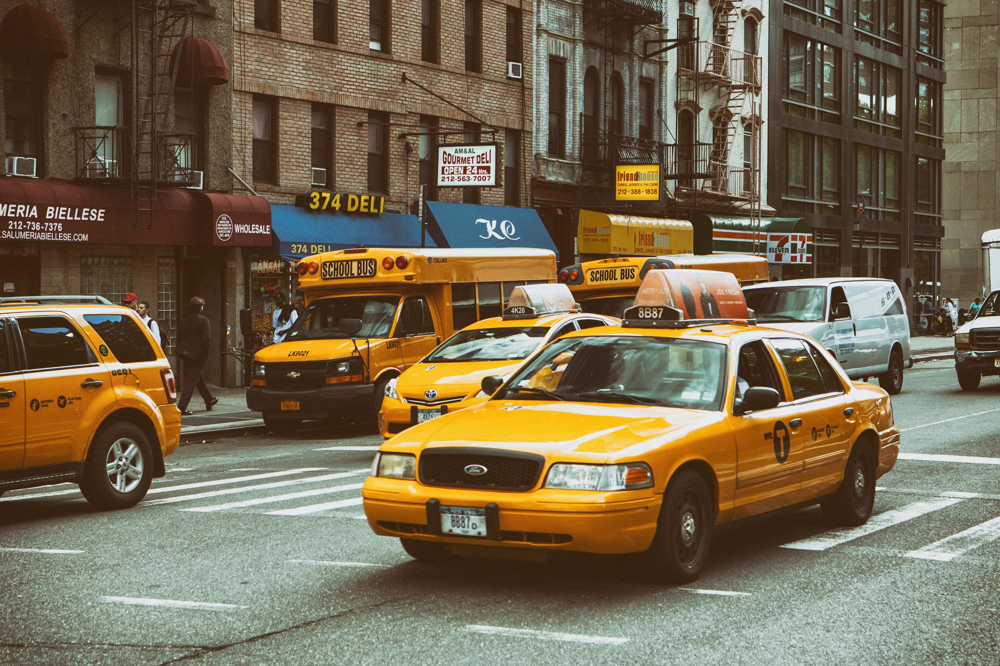

**New York City Taxi and Limousine Commission (NYC TLC)** 
`merupakan sebuah lembaga pemerintahan kota New York yang bertugas memberikan lisensi dan mengatur regulasi terhadap layanan taksi dan transportasi sewaan.Lembaga ini bertanggung jawab untuk melindungi keselamatan publik dan hak-hak konsumen, mengelola perizinan oprasional, menetapkan serta menegakkan tarif resmi, dan mengawasi struktur biaya sewa kendaraan taksi.`

# BAB 1: PENDAHULUAN

## 1.1 Latar Belakang
Di tengah meningkatnya kebutuhan mobilitas masyarakat urban, layanan taksi tetap menjadi komponen penting dalam sistem transportasi perkotaan, khususnya di New York City. Dengan cakupan wilayah yang luas dan karakteristik perjalanan yang beragam di tiap borough, muncul kebutuhan mendesak bagi pengelola armada dan pengemudi untuk memahami di mana dan kapan potensi pendapatan terbesar dapat dioptimalkan.

Meskipun data perjalanan dan transaksi telah dikumpulkan secara sistematis oleh NYC TLC, informasi ini sering kali belum dimanfaatkan secara maksimal untuk mengungkap pola-pola pendapatan yang konsisten berdasarkan wilayah geografis atau rute tertentu. Tanpa pemahaman ini, alokasi armada dan strategi operasional masih bersifat generik, yang berisiko menghasilkan inefisiensi dan hilangnya potensi pendapatan.

Sebagai bagian dari inisiatif tersebut, TLC menyediakan dataset yang memuat catatan perjalanan taksi di wilayah kota New York selama periode 1 Januari hingga 31 Januari 2023. Data ini mencakup berbagai informasi penting seperti, waktu perjalanan, jumlah penumpang, jarak tempuh, lokasi penjemputan dan pengantaran, tarif perjalanan, serta metode pembayaran yang digunakan.

## Stakeholder
**Divisi Operasional dan Armada**

## 1.2 Pernytaan Masalah

Dalam industri taksi yang sangat kompetitif dan dinamis, memahami pola pendapatan tidak cukup hanya mengandalkan jumlah perjalanan (volume demand). Diperlukan analisis mendalam terhadap keterkaitan antara waktu operasional dan lokasi geografis, karena pendapatan pengemudi maupun perusahaan sangat dipengaruhi oleh fluktuasi spasial dan temporal.

Bagaimana memetakan dan menganalisis variasi permintaan serta pendapatan layanan taksi berdasarkan waktu (jam, hari, musim) dan lokasi (borough atau zona), agar dapat menjadi dasar pengambilan keputusan operasional yang lebih adaptif dan strategis?

Apakah terdapat pola pendapatan yang konsisten pada kombinasi waktu dan wilayah tertentu, yang dapat dioptimalkan untuk meningkatkan efisiensi dan profitabilitas operasional layanan taksi di New York City?

- Pengemudi, untuk menentukan waktu dan lokasi kerja yang optimal.

- Pengelola armada, untuk menyusun strategi distribusi kendaraan berdasarkan potensi pendapatan maksimum di tiap borough dan waktu tertentu.

Oleh karena itu, perlu dilakukan analisis untuk menjawab pertanyaan kunci berikut:

1. Bagaimana mengidentifikasi dan memetakan variabilitas permintaan layanan taksi berdasarkan waktu, hari, dan wilayah, sehingga dapat menjadi dasar pengaturan standar operasional yang lebih adaptif?

2. Apakah terdapat pola pendapatan yang konsisten di wilayah dan waktu tertentu yang dapat dioptimalkan oleh pengemudi atau pengelola armada untuk meningkatkan efisiensi dan profitabilitas operasional layanan taksi di New York City?




## 1.3 Tujuan Analisis

1. Menganalisis distribusi pendapatan berdasarkan kombinasi wilayah dan waktu, termasuk:

    - Borough (Manhattan, Brooklyn, dll),

    - Zona (TLC pickup/dropoff),

    - Jam, hari, dan pekan.

2. Mengidentifikasi kombinasi waktu dan lokasi dengan potensi pendapatan tertinggi secara konsisten, bukan hanya sesekali.

3. Menyediakan insight berbasis data untuk membantu:

    - Pengemudi memilih waktu dan tempat kerja paling menguntungkan,

    - Pengelola armada dalam mengatur distribusi kendaraan lebih strategis,

    - TLC memahami ketimpangan atau peluang pengembangan wilayah tertentu.

# BAB 2: PEMBAHASAN
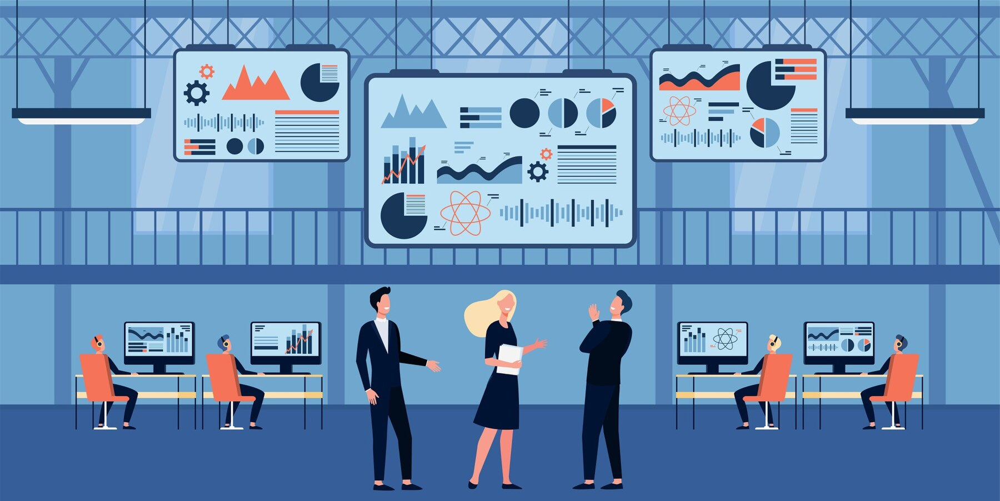

## 2.1 Import Data 

Pada tahap ini, dilakukan peninjauan awal terhadap setiap fitur (kolom) dalam dataset untuk memahami jenis informasi yang dikandung. Ini mencakup pemeriksaan nama fitur, tipe data, dan contoh nilai dari masing-masing kolom.
Selain itu, dilakukan proses merging antara data utama (trip data) dengan data tambahan berupa informasi zona taksi (seperti nama zona dan borough). Penggabungan ini bertujuan untuk menambahkan konteks geografis terhadap lokasi penjemputan (pickup) dan pengantaran (drop-off), sehingga analisis spasial bisa dilakukan dengan lebih bermakna.

### I. Load Libraries

In [1]:
import warnings
from datetime import timedelta

import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import pandas as pd
import seaborn as sns

warnings.filterwarnings("ignore")

### II. Load Dataset

In [2]:
# Load Dataset Trip
df_trips = pd.read_csv("NYC TLC Trip Record.csv")
df_trips.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,ehail_fee,improvement_surcharge,total_amount,payment_type,trip_type,congestion_surcharge
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.9,1.0,0.5,4.03,0.0,NaN,1.0,24.18,1.0,1.0,2.75
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.7,1.0,0.5,2.64,0.0,NaN,1.0,15.84,1.0,1.0,0.00
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.2,1.0,0.5,1.94,0.0,NaN,1.0,11.64,1.0,1.0,0.00
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.5,0.5,1.5,1.70,0.0,NaN,1.0,10.20,1.0,1.0,0.00
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.0,0.5,1.5,0.00,0.0,NaN,1.0,8.00,1.0,1.0,0.00


In [3]:
df_trips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68211 entries, 0 to 68210
Data columns (total 20 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   VendorID               68211 non-null  int64  
 1   lpep_pickup_datetime   68211 non-null  object 
 2   lpep_dropoff_datetime  68211 non-null  object 
 3   store_and_fwd_flag     63887 non-null  object 
 4   RatecodeID             63887 non-null  float64
 5   PULocationID           68211 non-null  int64  
 6   DOLocationID           68211 non-null  int64  
 7   passenger_count        63887 non-null  float64
 8   trip_distance          68211 non-null  float64
 9   fare_amount            68211 non-null  float64
 10  extra                  68211 non-null  float64
 11  mta_tax                68211 non-null  float64
 12  tip_amount             68211 non-null  float64
 13  tolls_amount           68211 non-null  float64
 14  ehail_fee              0 non-null      float64
 15  im

<h3 style="text-align:center"><b>Description Features</b></h3>

| Features                  | Description                                                                                                                   |
|---------------------------|-------------------------------------------------------------------------------------------------------------------------------|
|``VendorID``               | Kode ID yang menunjukkan vendor taksi.                                                                                        |
|                           | 1 = Creative Mobile Technologies, LLC                                                                                         |
|                           | 2 = VeriFone Inc.                                                                                                             |   
|``lpep_pickup_datetime``   | Tanggal dan waktu saat perjalanan taksi dimulai.                                                                              |
|``lpep_dropoff_datetime``  | Tanggal dan waktu saat perjalanan taksi berakhir.                                                                             |
|``store_and_fwd_flag``     | Menunjukkan apakah catatan perjalanan disimpan dalam memori kendaraan sebelum dikirim ke vendor. Y berarti "simpan dan lanjutkan", N berarti bukan perjalanan "simpan dan lanjutkan".                                                                                                                    |
|``RatecodeID``             | Kode tarif untuk perjalanan.                                                                                                  |
|                           |1 = Tarif standar                                                                                                              |
|                           |2 = JFK                                                                                                                        |
|                           |3 = Newark                                                                                                                     |
|                           |4 = Nassau atau Westchester                                                                                                    |
|                           |5 = Tarif yang dinegosiasikan                                                                                                  |
|                           |6 = Perjalanan kelompok.                                                                                                       |
|``PULocationID``           | ID lokasi penjemputan, yang sesuai dengan zona taksi di mana meteran (taximeter) diaktifkan.                                  |
|``DOLocationID``           | ID lokasi penurunan, yang sesuai dengan zona taksi di mana meteran (taximeter) dinonaktifkan.                                 |
|``passenger_count``        | Jumlah penumpang di dalam kendaraan.                                                                                          |
|``trip_distance``          | Jarak perjalanan dalam mil.                                                                                                   |
|``fare_amount``            | Tarif yang diukur untuk perjalanan.                                                                                           |
|``extra``                  | Biaya tambahan. Saat ini, ini hanya mencakup biaya tambahan 0,5 dolar dan 1 dolar untuk jam sibuk dan larut malam.            |
|``mta_tax``                | Pajak MTA sebesar 0,50 dolar yang otomatis aktif berdasarkan tarif yang diukur yang digunakan.                                |
|``tip_amount``             | Jumlah tip. Biaya ini otomatis diisi untuk pembayaran menggunakan kartu kredit. Tip tunai tidak termasuk.                                       |
|``tolls_amount``           | Jumlah total dari semua tol yang dibayar dalam perjalanan.                                                                    |
|``ehail_fee``              | Biaya tambahan sebesar 1 dolar yang otomatis dikenakan untuk setiap perjalanan yang dipesan melalui platform ehail.           |
|``improvement_surcharge``  | Biaya tambahan sebesar 0,30 dolar yang dinilai pada awal perjalanan. Biaya tambahan ini mulai dikenakan pada tahun 2015.      |
|``total_amount``           | Jumlah total yang dikenakan kepada penumpang. Bidang ini mencakup tarif yang diukur, biaya tambahan, mta_tax, tip_amount, dan tolls_amount ditambah biaya tambahan ehail atau improvement_surcharge.                                                                                                   |
|``payment_type``           | Kode numerik yang menunjukkan metode pembayaran.                                                                              |
|``trip_type``              | Kode yang menunjukkan apakah perjalanan adalah dari sisi jalan atau dari pengiriman yang otomatis ditetapkan berdasarkan tarif yang diukur yang digunakan tetapi dapat diubah oleh pengemudi.                                                                                                               |
|                           | 1 = Street-hail                                                                                                               |
|                           | 2 = Dispatch                                                                                                                  |
|``congestion_surcharge``   | Biaya kemacetan sebesar 2,75 dolar untuk perjalanan dengan taksi kuning dan hijau di Manhattan selatan dari 96th St. Biaya tambahan ini mulai dikenakan pada tahun 2019.                                                                                                                                  |

In [4]:
# Load Dataset Zona
df_zones = pd.read_csv("taxi_zone_lookup.csv")
df_zones.head()

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [5]:
df_zones.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 265 entries, 0 to 264
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   LocationID    265 non-null    int64 
 1   Borough       264 non-null    object
 2   Zone          264 non-null    object
 3   service_zone  263 non-null    object
dtypes: int64(1), object(3)
memory usage: 8.4+ KB


<h3 style="text-align:center"><b>Description Features</b></h3>

| Features                  | Description                                                                                                                   |
|---------------------------|-------------------------------------------------------------------------------------------------------------------------------|
|``LocationID``               | Identifier unik untuk setiap zona taksi di NYC.                                                                             |   
|``Borough``   | Kota administratif di NYC tempat zona berada. 
|
|``Zone``  | Nama wilayah spesifik dalam borough.|                                                                               
|                           |EWR = Khusus bandara Newark                                                                                                    |
|                           |Boro Zone = Wilayah layanan taksi hijau                                                                                        |
|                           |Yellow Zone = Wilayah layanan taksi kuning 

### III. Merge Dataset

In [6]:
# Merge PULocationID
df = (
    pd.merge(
        df_trips, df_zones, left_on="PULocationID", right_on="LocationID", how="left"
    )
    .rename(
        columns={
            "Borough": "PUBorough",
            "Zone": "PUZone",
            "service_zone": "PUService_zone",
        }
    )
    .drop("LocationID", axis=1)
)

In [7]:
# Merge DOLocationID
df = (
    pd.merge(df, df_zones, left_on="DOLocationID", right_on="LocationID", how="left")
    .rename(
        columns={
            "Borough": "DOBorough",
            "Zone": "DOZone",
            "service_zone": "DOService_zone",
        }
    )
    .drop("LocationID", axis=1)
)

In [8]:
# Dsiplay Dataset setelah penggabungan
print("Total Data:", len(df))
df.head()

Total Data: 68211


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,total_amount,payment_type,trip_type,congestion_surcharge,PUBorough,PUZone,PUService_zone,DOBorough,DOZone,DOService_zone
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1.0,2.58,14.9,...,24.18,1.0,1.0,2.75,Manhattan,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1.0,1.81,10.7,...,15.84,1.0,1.0,0.00,Manhattan,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1.0,0.00,7.2,...,11.64,1.0,1.0,0.00,Queens,Steinway,Boro Zone,Queens,Old Astoria,Boro Zone
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1.0,1.30,6.5,...,10.20,1.0,1.0,0.00,Manhattan,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1.0,1.10,6.0,...,8.00,1.0,1.0,0.00,Manhattan,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone


## 2.2 Missing Value

Pada tahap ini, akan dilakukan pemeriksaan dan pembersihan terhadap fitur-fitur dalam dataset yang mengandung nilai kosong (missing values). 

<Axes: >

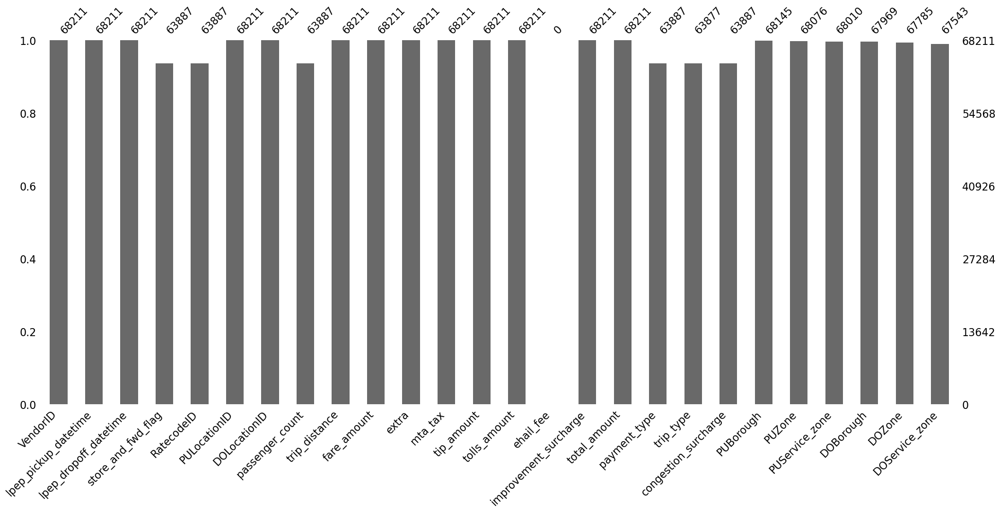

In [9]:
# Display sebelum handling missing values
msno.bar(df)

In [10]:
# Mengecek proporsi missing value pada data
df_missing_values = pd.DataFrame(
    {
        "missing_count": df.isna().sum(),
        "missing_percent": (df.isna().sum() / len(df)) * 100,
    }
).round(2)

# Mengurutkan berdasarkan presentase tertinggi
df_missing_values = df_missing_values.sort_values("missing_percent", ascending=False)
df_missing_values

,missing_count,missing_percent
ehail_fee,68211,100.00
trip_type,4334,6.35
store_and_fwd_flag,4324,6.34
RatecodeID,4324,6.34
passenger_count,4324,6.34
congestion_surcharge,4324,6.34
payment_type,4324,6.34
DOService_zone,668,0.98
DOZone,426,0.62
DOBorough,242,0.35


**Interpretasi**: Setelah dilakukan pengecekan terhadap missing value di setiap fitur dalam dataset, ditemukan bahwa terdapat beberapa fitur memiliki nilai yang hilang (NaN) dengan proporsi yang bervariasi. Fitur-fitur tersebut perlu diperhatikan sebelum melanjutkan ke tahap analisis lebih lanjut.

1. ehail_fee 100%
2. trip_type 6.35%
3. store_and_fwd_flag 6.34%
4. RatecodeID 6.34%
5. passenger_count 6.34%
6. congestion_surcharge 6.34%
7. payment_type	6.34%
8. DOService_zone 0.98%
9. DOZone 0.62%
10. DOBorough 0.35%
11. PUService_zone 0.29%
12. PUZone 0.20%
13. PUBorough 0.10%
    
**`ehail_fee`** Merupakan fitur yang merepresentasikan biaya tambahan untuk pemesanan elektronik (e-hail), yang umumnya muncul dalam layanan seperti Uber atau Lyft. Namun, seluruh nilai pada fitur ini kosong (100% missing values), besar kemungkinan data yang digunakan berasal dari penyedia layanan yang tidak menggunakan sistem *e-hailing*, seperti taksi biasa. Fitur ini akan dihapus dari dataset, karena tidak memberikan informasi tambahan dan tidak relevan untuk dilakukan analisa.

### I. Handling Missing Value

Dalam tahap ini, pembersihan dilakukan berdasarkan proporsi nilai kosong (missing values) pada tiap fitur dengan kriteria sebagai berikut:
1. Persentase missing < 5% -> *Row wise deletion* (hapus baris) 
2. Presentase missing 5-20% -> Imputasi nilai (mean/median/modus/other value) atau berdasarkan variabel lain
3. Presentase > 50% -> Hapus kolom

In [11]:
# Hapus Fitur ehail_fee
df.drop("ehail_fee", axis=1, inplace=True)

In [12]:
# Hapus baris
drop_rows = [
    "DOService_zone",
    "DOZone",
    "DOBorough",
    "PUService_zone",
    "PUZone",
    "PUBorough",
]
df = df.dropna(subset=drop_rows)

In [13]:
# Imputasi nilai modus, median & mean.
categorical_columns = ["trip_type", "store_and_fwd_flag", "RatecodeID", "payment_type"]
for i in categorical_columns:
    df[i] = df[i].fillna(df[i].mode()[0])

df["passenger_count"] = df["passenger_count"].fillna(df["passenger_count"].median())

df["congestion_surcharge"] = df["congestion_surcharge"].fillna(
    df["congestion_surcharge"].mean()
)

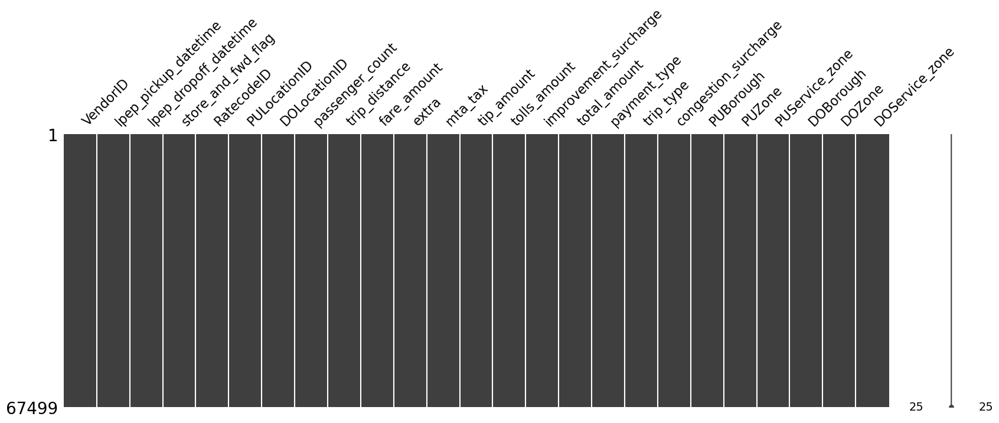

In [14]:
# Display setelah handling missing values
msno.matrix(df, figsize=(20, 6))
plt.show()

**Interpretasi:** Setelah dilakukan proses pembersihan dan penyesuaian terhadap fitur-fitur yang mengandung missing values, kini dataset tidak lagi memiliki nilai kosong (null) pada kolom-kolom yang dipertahankan.

## 2.3 Data Types

Pada tahap ini, akan dilakukan penyesuaian terhadap tipe data pada setiap fitur agar sesuai dengan karakteristik dan jenis data yang direpresentasikan.

In [15]:
# Cek tipe data masing-masing fitur
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 67499 entries, 0 to 68210
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   VendorID               67499 non-null  int64  
 1   lpep_pickup_datetime   67499 non-null  object 
 2   lpep_dropoff_datetime  67499 non-null  object 
 3   store_and_fwd_flag     67499 non-null  object 
 4   RatecodeID             67499 non-null  float64
 5   PULocationID           67499 non-null  int64  
 6   DOLocationID           67499 non-null  int64  
 7   passenger_count        67499 non-null  float64
 8   trip_distance          67499 non-null  float64
 9   fare_amount            67499 non-null  float64
 10  extra                  67499 non-null  float64
 11  mta_tax                67499 non-null  float64
 12  tip_amount             67499 non-null  float64
 13  tolls_amount           67499 non-null  float64
 14  improvement_surcharge  67499 non-null  float64
 15  total_a

In [16]:
# Penyesuaian tipe data masing-masing fitur
df["lpep_pickup_datetime"] = pd.to_datetime(df["lpep_pickup_datetime"])
df["lpep_dropoff_datetime"] = pd.to_datetime(df["lpep_dropoff_datetime"])

df["passenger_count"] = df["passenger_count"].astype("int")

df["PULocationID"] = df["PULocationID"].astype("category")
df["DOLocationID"] = df["DOLocationID"].astype("category")
df["store_and_fwd_flag"] = df["store_and_fwd_flag"].astype("category")
df["RatecodeID"] = df["RatecodeID"].astype("category")
df["payment_type"] = df["payment_type"].astype("category")
df["trip_type"] = df["trip_type"].astype("category")

# Display setelah penyesuaian tipe data
display(df.head(), df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 67499 entries, 0 to 68210
Data columns (total 25 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   VendorID               67499 non-null  int64         
 1   lpep_pickup_datetime   67499 non-null  datetime64[ns]
 2   lpep_dropoff_datetime  67499 non-null  datetime64[ns]
 3   store_and_fwd_flag     67499 non-null  category      
 4   RatecodeID             67499 non-null  category      
 5   PULocationID           67499 non-null  category      
 6   DOLocationID           67499 non-null  category      
 7   passenger_count        67499 non-null  int32         
 8   trip_distance          67499 non-null  float64       
 9   fare_amount            67499 non-null  float64       
 10  extra                  67499 non-null  float64       
 11  mta_tax                67499 non-null  float64       
 12  tip_amount             67499 non-null  float64       
 13  tolls_

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,total_amount,payment_type,trip_type,congestion_surcharge,PUBorough,PUZone,PUService_zone,DOBorough,DOZone,DOService_zone
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1,2.58,14.9,...,24.18,1.0,1.0,2.75,Manhattan,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1,1.81,10.7,...,15.84,1.0,1.0,0.00,Manhattan,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1,0.00,7.2,...,11.64,1.0,1.0,0.00,Queens,Steinway,Boro Zone,Queens,Old Astoria,Boro Zone
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1,1.30,6.5,...,10.20,1.0,1.0,0.00,Manhattan,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1,1.10,6.0,...,8.00,1.0,1.0,0.00,Manhattan,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone


None

## 2.4. Data Duplicates

Pada tahap ini, akan dilakukan pemeriksaan terhadap duplikat dalam dataset untuk memastikan integritas data yang digunakan.

In [17]:
# Cek Duplicates Values
jumlah_duplikat = df.duplicated().sum()
print(f"Total baris duplikat:{jumlah_duplikat}")

Total baris duplikat:0


**Interpretasi:** Hasil pemeriksaan menunjukkan bahwa dataset tidak mengandung record yang terduplikasi.

## 2.5 Outliers Handling & Data Validation 

Pada tahap ini, akan dilakukan pemeriksaan terhadap fitur-fitur yang mengandung *outlier* serta proses validasi terhadap dataset. Langkah ini bertujuan untuk memastikan bahwa data berada dalam rentang yang wajar dan konsisten, sehingga dapat mendukung analisis lebih lanjut secara akurat dan andal.

### Pick up & Drop off Datetime

In [18]:
# Menampilkan data yang di luar rentang januari 2023 (outliers)
outliers = df[
    (df["lpep_pickup_datetime"].dt.month != 1)
    | (df["lpep_pickup_datetime"].dt.year != 2023)
]
outliers.describe()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
count,4.0,4,4,4.00,4.000000,4.000000,4.0,4.000,4.000000,4.0000,4.000,4.0000,4.0000
mean,2.0,2019-06-29 13:09:30.750000128,2019-06-29 17:10:54.500000,1.25,5.787500,26.000000,0.0,0.375,3.215000,1.6375,0.475,32.3900,0.6875
min,2.0,2009-01-01 20:21:27,2009-01-02 11:07:31,1.00,4.580000,16.000000,0.0,0.000,0.000000,0.0000,0.300,16.8000,0.0000
25%,2.0,2019-06-16 03:43:28.500000,2019-06-16 07:33:42.249999872,1.00,5.172500,23.125000,0.0,0.375,0.000000,0.0000,0.300,29.6700,0.0000
50%,2.0,2022-12-09 14:33:15.500000,2022-12-09 14:57:46,1.00,5.425000,26.750000,0.0,0.500,2.830000,0.0000,0.300,34.7800,0.0000
75%,2.0,2022-12-22 23:59:17.750000128,2022-12-23 00:34:58.249999872,1.25,6.040000,29.625000,0.0,0.500,6.045000,1.6375,0.475,37.5000,0.6875
max,2.0,2023-02-01 03:10:05,2023-02-01 03:40:35,2.00,7.720000,34.500000,0.0,0.500,7.200000,6.5500,1.000,43.2000,2.7500
std,0.0,NaN,NaN,0.50,1.349256,7.670289,0.0,0.250,3.765222,3.2750,0.350,11.1456,1.3750


**Interpretasi:** Terdapat beberapa record dalam dataset yang berada diluar periode Januari 2023. Oleh karena itu dilakukan fileterisasi terhadap fitur `lpep_pickup_datetime` dengan hanya mempertahankan record yang berada dalam rentang waktu 1 Januari hingga 31 Januari 2023, guna memastikan konsistensi periode analisis. 

In [19]:
# Menghapus outliers
df.drop(outliers.index, inplace=True)

In [20]:
# Filter untuk lpep_pickup_datetime (1 Januari 2023 - 31 Januari 2023)
df = df[
    (df["lpep_pickup_datetime"] >= "2023-01-01")
    & (df["lpep_pickup_datetime"] < "2023-02-01")
]

# Filter untuk lpep_dropoff_datetime (1 Januari 2023 - 31 Januari 2023)
df = df[
    (df["lpep_dropoff_datetime"] >= "2023-01-01")
    & (df["lpep_dropoff_datetime"] <= "2023-01-31 23:59:59")
]
df.describe()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
count,67480.000000,67480,67480,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000
mean,1.863752,2023-01-16 22:04:06.544798464,2023-01-16 22:21:59.139537664,1.296814,8.148626,16.403473,0.830446,0.589690,2.133257,0.163183,0.952333,21.591134,0.734290
min,1.000000,2023-01-01 00:01:31,2023-01-01 00:13:26,0.000000,0.000000,-70.000000,-2.500000,-0.500000,-10.500000,0.000000,-1.000000,-71.500000,-2.750000
25%,2.000000,2023-01-09 12:18:42.500000,2023-01-09 12:34:44.500000,1.000000,1.130000,9.300000,0.000000,0.500000,0.000000,0.000000,1.000000,12.900000,0.000000
50%,2.000000,2023-01-17 08:43:58,2023-01-17 08:58:51.500000,1.000000,1.850000,13.300000,0.000000,0.500000,1.600000,0.000000,1.000000,17.850000,0.000000
75%,2.000000,2023-01-24 15:51:19.500000,2023-01-24 16:06:53.249999872,1.000000,3.200000,19.800000,1.000000,0.500000,3.330000,0.000000,1.000000,26.012500,2.500000
max,2.000000,2023-01-31 23:45:10,2023-01-31 23:55:05,9.000000,120098.840000,490.000000,7.500000,2.750000,222.220000,36.050000,1.000000,491.000000,2.750000
std,0.343054,NaN,NaN,0.952013,588.265844,12.740198,1.272106,0.383634,2.980470,1.058828,0.195078,14.746903,1.177415


- Selanjutnya, akan dilakukan proses pengelompokan data berdasarkan waktu penjemputan, hari, serta perbedaan antara weekend dan weekdays.

### Penambahan Fitur - pickup_time, pickup_day, day_type

In [21]:
# Penambahan fitur pickup time
time_bins = [6, 12, 17, 20, 24]
time_labels = ["Morning", "Afternoon", "Evening", "Night"]
df["pickup_time"] = pd.cut(
    df["lpep_pickup_datetime"].dt.hour, bins=time_bins, labels=time_labels, right=False
)

# Penambahan fitur pickup day
df["pickup_day"] = df["lpep_pickup_datetime"].dt.day_name()

# Penambahan fitur pickup day type -> weekdays | weekend
df["day_type"] = (
    df["lpep_pickup_datetime"]
    .dt.day_name()
    .apply(lambda x: "Weekend" if x in ["Saturday", "Sunday"] else "Weekdays")
)
df

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,congestion_surcharge,PUBorough,PUZone,PUService_zone,DOBorough,DOZone,DOService_zone,pickup_time,pickup_day,day_type
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,1.0,166,143,1,2.58,14.90,...,2.750000,Manhattan,Morningside Heights,Boro Zone,Manhattan,Lincoln Square West,Yellow Zone,NaN,Sunday,Weekend
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,1.0,24,43,1,1.81,10.70,...,0.000000,Manhattan,Bloomingdale,Yellow Zone,Manhattan,Central Park,Yellow Zone,NaN,Sunday,Weekend
2,2,2023-01-01 00:35:12,2023-01-01 00:41:32,N,1.0,223,179,1,0.00,7.20,...,0.000000,Queens,Steinway,Boro Zone,Queens,Old Astoria,Boro Zone,NaN,Sunday,Weekend
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,1.0,41,238,1,1.30,6.50,...,0.000000,Manhattan,Central Harlem,Boro Zone,Manhattan,Upper West Side North,Yellow Zone,NaN,Sunday,Weekend
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,1.0,41,74,1,1.10,6.00,...,0.000000,Manhattan,Central Harlem,Boro Zone,Manhattan,East Harlem North,Boro Zone,NaN,Sunday,Weekend
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68204,2,2023-01-31 21:53:00,2023-01-31 22:05:00,N,1.0,42,236,1,2.26,14.62,...,0.734227,Manhattan,Central Harlem North,Boro Zone,Manhattan,Upper East Side North,Yellow Zone,Night,Tuesday,Weekdays
68205,2,2023-01-31 21:56:00,2023-01-31 22:14:00,N,1.0,75,186,1,3.92,20.72,...,0.734227,Manhattan,East Harlem South,Boro Zone,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Night,Tuesday,Weekdays
68206,2,2023-01-31 22:29:00,2023-01-31 22:42:00,N,1.0,49,62,1,4070.82,15.70,...,0.734227,Brooklyn,Clinton Hill,Boro Zone,Brooklyn,Crown Heights South,Boro Zone,Night,Tuesday,Weekdays
68207,2,2023-01-31 22:40:00,2023-01-31 22:48:00,N,1.0,10,205,1,2.14,4.41,...,0.734227,Queens,Baisley Park,Boro Zone,Queens,Saint Albans,Boro Zone,Night,Tuesday,Weekdays


### RatecodeID

In [22]:
# Cek distribusi fitur
ratecode_counts = df["RatecodeID"].value_counts().sort_index()
ratecode_counts

RatecodeID
1.0     66018
2.0       155
3.0        24
4.0         3
5.0      1271
99.0        9
Name: count, dtype: int64

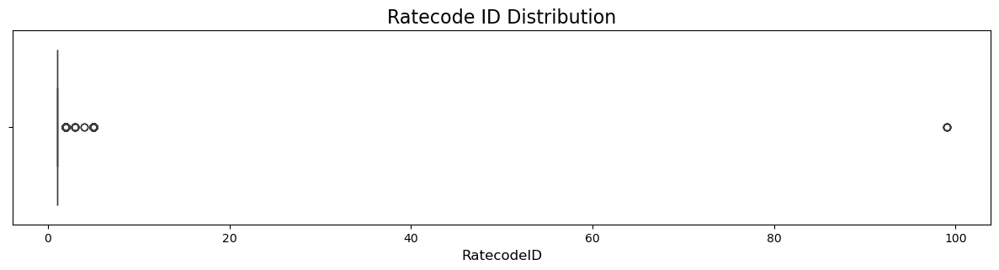

In [23]:
# Cek outliers pada fitur
plt.figure(figsize=(15, 3))
sns.boxplot(data=df, x="RatecodeID")
plt.title("Ratecode ID Distribution", fontsize=16)
plt.xlabel("RatecodeID", fontsize=12)
plt.show()

**Interpretasi:** Ditemukan outlier pada fitur `RatecodeID` yang bernilai 99. Hal ini dianggap tidak wajar, mengingat nilai valid pada fitur `RatecodeID` hanya 1 hingga 6. Oleh karena itu nilai tersebut akan dibersihkan dari dataset dan diganti dengan nilai default, yaitu 1 (standard rate).

In [24]:
# Merubah outlier dengan nilai wajar
df["RatecodeID"] = df["RatecodeID"].replace(99, 1)

# Merubah value angka pada fitur ke dalam beberapa kategori
df["RatecodeID"] = df["RatecodeID"].replace(
    {
        1: "Standard rate",
        2: "JFK Airport",
        3: "Newark Airport",
        4: "Nassau or Westchester",
        5: "Negotiated fare",
        6: "Group ride",
    }
)
df["RatecodeID"].value_counts()

RatecodeID
Standard rate            66027
Negotiated fare           1271
JFK Airport                155
Newark Airport              24
Nassau or Westchester        3
Name: count, dtype: int64

**Interpretasi:** Tarif 1 (standard rate) merupakan jenis tarif dengan jumlah trip terbanyak, sedangkan tarif 2 (JFK) dan 3 (Newark) muncul lebih sedikit. Hal ini mengindikasikan bahwa perjalanan menuju bandara sangat jarang dilakukan oleh mayoritas penumpang berdasarkan data. Selain itu, ditemukan outlier pada fitur `RatecodeID` yang bernilai 99. Hal ini dianggap tidak wajar, mengingat nilai valid pada fitur `RatecodeID` hanya 1 hingga 6. Oleh karena itu nilai tersebut akan dibersihkan dari dataset dan diganti dengan nilai default, yaitu 1 (standard rate).

### Passenger Count

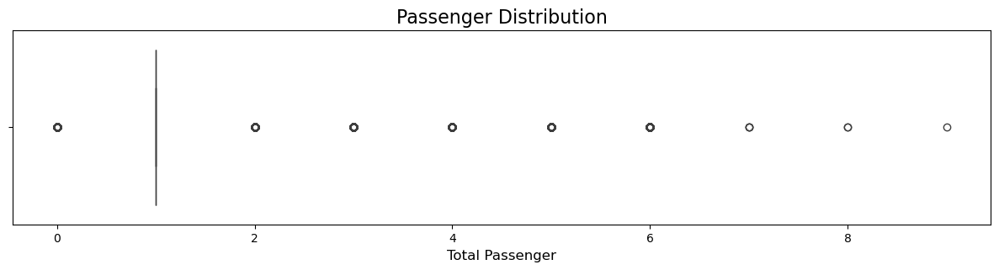

In [25]:
# Melihat distribusi pada fitur
plt.figure(figsize=(15, 3))
sns.boxplot(data=df, x="passenger_count")
plt.title("Passenger Distribution", fontsize=16)
plt.xlabel("Total Passenger", fontsize=12)
plt.show()

**Interpretasi**: Ditemukan bahwa fitur `passanger_count` mengandung nilai nol. Nilai tersebut tidak merepresentasikan kondisi nyata, yang Kemungkinan besar disebabkan oleh kesalahan dalam pencatatan atau anomali sistem.
Selain itu terdapat nilai pada `passanger_count` yang melebihi kapasitas taksi yakni lebih dari lima penumpang. Hal ini dianggap tidak relevan karena berdasarkan regulasi resmi dari NYC TLC, jumlah maksimal penumpang dalam satu perjalanan taksi dibatasi hanya 4 hingga 5 orang, tergantung jenis kendaraan. Oleh karena itu, nilai-nilai yang berada di luar rentang wajar akan dilakukan imputasi berdasarkan menggunakan nilai minimum terhadap nilai 0 dan nilai median terhadap nilai lebih dari 5 pada fitur `passenger_count`.

In [26]:
# Hitung median hanya untuk nilai passenger_count antara 1 dan 5
median = df.loc[
    (df["passenger_count"] >= 1) & (df["passenger_count"] <= 5), "passenger_count"
].median()

# Imputasi: ganti 0 dengan 1
df.loc[df["passenger_count"] == 0, "passenger_count"] = 1

# Imputasi: ganti nilai > 5 dengan nilai median
df.loc[df["passenger_count"] > 5, "passenger_count"] = median

In [27]:
# Display setelah handling outlier
df.describe()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
count,67480.000000,67480,67480,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000,67480.000000
mean,1.863752,2023-01-16 22:04:06.544798464,2023-01-16 22:21:59.139537664,1.223192,8.148626,16.403473,0.830446,0.589690,2.133257,0.163183,0.952333,21.591134,0.734290
min,1.000000,2023-01-01 00:01:31,2023-01-01 00:13:26,1.000000,0.000000,-70.000000,-2.500000,-0.500000,-10.500000,0.000000,-1.000000,-71.500000,-2.750000
25%,2.000000,2023-01-09 12:18:42.500000,2023-01-09 12:34:44.500000,1.000000,1.130000,9.300000,0.000000,0.500000,0.000000,0.000000,1.000000,12.900000,0.000000
50%,2.000000,2023-01-17 08:43:58,2023-01-17 08:58:51.500000,1.000000,1.850000,13.300000,0.000000,0.500000,1.600000,0.000000,1.000000,17.850000,0.000000
75%,2.000000,2023-01-24 15:51:19.500000,2023-01-24 16:06:53.249999872,1.000000,3.200000,19.800000,1.000000,0.500000,3.330000,0.000000,1.000000,26.012500,2.500000
max,2.000000,2023-01-31 23:45:10,2023-01-31 23:55:05,5.000000,120098.840000,490.000000,7.500000,2.750000,222.220000,36.050000,1.000000,491.000000,2.750000
std,0.343054,NaN,NaN,0.739479,588.265844,12.740198,1.272106,0.383634,2.980470,1.058828,0.195078,14.746903,1.177415


### Trip Distance

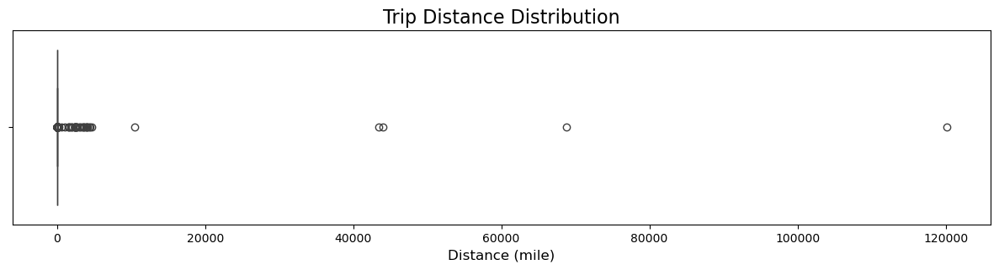

In [28]:
# Melihat distribusi pada fitur
plt.figure(figsize=(15, 3))
sns.boxplot(data=df, x="trip_distance")
plt.title("Trip Distance Distribution", fontsize=16)
plt.xlabel("Distance (mile)", fontsize=12)
plt.show()

**Interpretasi:** Terlihat pada fitur `trip_distance` ditemukan *extreme outliers*, yaitu jarak tempuh yang melebihi 62 mil (100 km). Dan di dalam dataset juga terdapat taksi yang menempuh jarak kurang dari 0,62 mil (1 km), hal tersebut merupakan record yang tidak wajar ataupun record yang gagal seperti kemungkinan penumpang atau driver membatalkan pesanan, maka dataset yang memiliki nilai tersebut akan dibersihkan.

In [29]:
# Display jumlah outlier pada fitur trip_distance
print(
    "Banyaknya data yang memiliki jarak kurang dari 0,62 mil (1 km):",
    len(df[df["trip_distance"] < 0.62]),
)

Banyaknya data yang memiliki jarak kurang dari 0,62 mil (1 km): 6537


In [30]:
# Handling trip distance < 1 km
df = df[df["trip_distance"] > 0.62]

print(
    "Banyaknya data yang memiliki jarak kurang dari 1 km (setelah dibersihkan):",
    len(df[df["trip_distance"] < 0.62]),
)

Banyaknya data yang memiliki jarak kurang dari 1 km (setelah dibersihkan): 0


In [31]:
# Handling trip distance > 100 km
df[df["trip_distance"] > 62][
    [
        "lpep_pickup_datetime",
        "lpep_dropoff_datetime",
        "PULocationID",
        "DOLocationID",
        "trip_distance",
        "fare_amount",
    ]
].sort_values(by="trip_distance", ascending=True).head()

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_distance,fare_amount
7322,2023-01-05 09:00:03,2023-01-05 15:18:38,134,134,66.18,15.00
64695,2023-01-06 14:16:00,2023-01-06 14:59:00,82,130,137.95,44.90
66580,2023-01-20 09:16:00,2023-01-20 09:59:00,133,90,254.65,45.44
63995,2023-01-01 12:35:00,2023-01-01 12:58:00,181,137,579.63,28.49
65149,2023-01-10 15:40:00,2023-01-10 16:24:00,26,37,1082.45,49.80


**Interpretasi:** Terlihat ada beberapa data dengan jarak tempuh yang tidak wajar setelah dibandingkan dengan waktu perjalanan dan juga tarif. Kemungkinan besar, hal ini terjadi karena anomali pada sistem (error pada gps).

In [32]:
# Handling Extreme Outliers
outliers = df[df["trip_distance"] > 62][
    ["PULocationID", "DOLocationID", "trip_distance"]
]
print("Total outliers:", len(outliers))
outliers.head()

Total outliers: 38


,PULocationID,DOLocationID,trip_distance
7322,134,134,66.18
33373,82,236,1571.97
63995,181,137,579.63
64446,193,140,2555.47
64558,49,65,3077.89


**Interpretasi:** Meskipun tidak ada batas maksimum yang diatur resmi oleh NYC TLC, namun jarak tempuh lebih dari 100 km (62 miles) itu hal yang tidak wajar, kemungkinan besar hal tersebut dikarenakan terdapat kesalahan pencatatan atau anomali sistem. Data tersebut akan diganti dengan nilai median untuk masing-masing titik lokasi penjemputan dan pengantaran dalam kumpulan data.

In [33]:
# trip_distance < 62 mil sebagai referensi valid
distance_by_loc = (
    df[df["trip_distance"] < 62]
    .groupby(["PULocationID", "DOLocationID"])
    .agg(
        count=("trip_distance", "count"),
        avg_distance=("trip_distance", "mean"),
        median_distance=("trip_distance", "median"),
    )
    .reset_index()
)

In [34]:
# Penggabungan data outlier dengan median trip_distance berdasarkan asal-tujuan
distance_byid = pd.merge(
    outliers, distance_by_loc, on=["PULocationID", "DOLocationID"], how="left"
)
distance_byid.drop(columns="count", inplace=True)
distance_byid.index = outliers.index
display(distance_byid.head())

# Imputasi nilai median
print("Hasil Imputasi:")
df.loc[outliers.index, "trip_distance"] = distance_byid["median_distance"]
display(
    df.loc[outliers.index][["PULocationID", "DOLocationID", "trip_distance"]].head()
)

,PULocationID,DOLocationID,trip_distance,avg_distance,median_distance
7322,134,134,66.18,1.129205,0.910
33373,82,236,1571.97,8.023333,8.080
63995,181,137,579.63,7.460000,7.460
64446,193,140,2555.47,2.410000,2.470
64558,49,65,3077.89,1.025000,1.025


Hasil Imputasi:


,PULocationID,DOLocationID,trip_distance
7322,134,134,0.910
33373,82,236,8.080
63995,181,137,7.460
64446,193,140,2.470
64558,49,65,1.025


- Selanjutnya akan dilakukan proses penyesuaian terhadap fitur `PUBorough` dan `DOBorough` guna menindak lanjuti proses penanganan *extreme outliers* yang ada pada fitur `trip_distance`.

In [35]:
isna = df.loc[df["trip_distance"].isna()][["PUBorough", "DOBorough", "trip_distance"]]
display(isna)

,PUBorough,DOBorough,trip_distance
65149,Brooklyn,Brooklyn,NaN
65306,Brooklyn,Queens,NaN
65491,Bronx,Manhattan,NaN
66344,Brooklyn,Brooklyn,NaN
66580,Brooklyn,Manhattan,NaN
66724,Manhattan,Bronx,NaN
67307,Bronx,Bronx,NaN


**Interpretasi:** Terdapat sejumlah data dengan nilai `trip_distance` yang tidak terdeteksi (NaN). Hal ini kemungkinan disebabkan oleh kesalahan pada sistem pencatatan, seperti kegagalan perangkat GPS dalam merekam jarak perjalanan atau kerusakan data selama proses pengumpulan. Data tersebut perlu ditangani lebih lanjut, dengan imputasi berdasarkan rute borough.

In [36]:
# Hitung statistik jarak (mean & median) untuk tiap rute unik
ct_distance = (
    df[df["trip_distance"] < 62]
    .groupby(["PUBorough", "DOBorough"])
    .agg(
        count=("trip_distance", "count"),
        avg_distance=("trip_distance", "mean"),
        median_distance=("trip_distance", "median"),
    )
    .reset_index()
)

In [37]:
# Imputasi nilai median
distance_byborough = pd.merge(
    isna, ct_distance, on=["PUBorough", "DOBorough"], how="left"
)
distance_byborough.index = isna.index
display(distance_byborough)

print("Hasil Imputasi:")
df.loc[isna.index, "trip_distance"] = distance_byborough["median_distance"].round(2)
display(df.loc[isna.index][["PUBorough", "DOBorough", "trip_distance"]])

,PUBorough,DOBorough,trip_distance,count,avg_distance,median_distance
65149,Brooklyn,Brooklyn,NaN,6024,2.611976,2.01
65306,Brooklyn,Queens,NaN,438,9.387329,9.54
65491,Bronx,Manhattan,NaN,253,4.992470,3.40
66344,Brooklyn,Brooklyn,NaN,6024,2.611976,2.01
66580,Brooklyn,Manhattan,NaN,1585,5.966871,5.63
66724,Manhattan,Bronx,NaN,1431,4.112418,3.29
67307,Bronx,Bronx,NaN,521,3.082236,2.50


Hasil Imputasi:


,PUBorough,DOBorough,trip_distance
65149,Brooklyn,Brooklyn,2.01
65306,Brooklyn,Queens,9.54
65491,Bronx,Manhattan,3.40
66344,Brooklyn,Brooklyn,2.01
66580,Brooklyn,Manhattan,5.63
66724,Manhattan,Bronx,3.29
67307,Bronx,Bronx,2.50


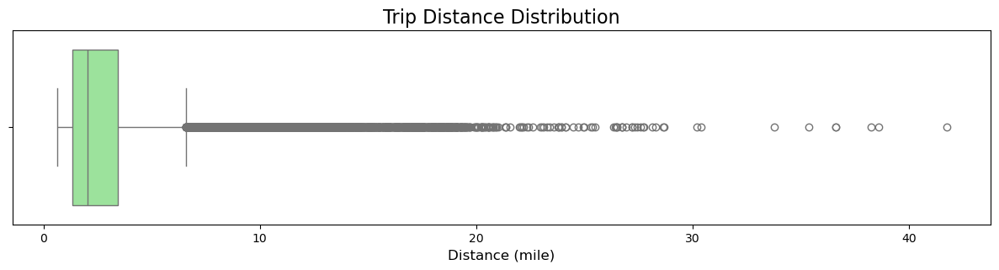

In [38]:
# Display setelah penanganan outliers
plt.figure(figsize=(15, 3))

sns.boxplot(data=df, x="trip_distance", color="lightgreen")
plt.title("Trip Distance Distribution", fontsize=16)
plt.xlabel("Distance (mile)", fontsize=12)

plt.show()

**Interpretasi:** Berdasarkan visualisasi boxplot, terdapat sejumlah outlier pada fitur trip_distance, yaitu data dengan jarak tempuh antara sekitar 10 hingga 40 mil. Untuk menangani outlier tersebut, akan dilakukan pengelompokan jarak ke dalam kategori tertentu. Pendekatan ini memungkinkan data outlier tetap dipertahankan dan digunakan dalam analisis lanjutan, tanpa harus dihapus, sehingga tetap menjaga konteks serta informasi yang mungkin relevan.

In [39]:
# Proses pengelompokkan jarak
bins_of_distance = [0, 2, 6, 10, np.inf]
labels_of_distance = ["<2 miles", "3-6 miles", "7-10 miles", ">10 miles"]

df["distance_bins"] = pd.cut(
    df["trip_distance"], bins=bins_of_distance, labels=labels_of_distance
)

### Penambahan Fitur - Trip Duration
`trip_duration` merupakan fitur yang akan digunakan untuk membantu validasi keakuratan data, seperti keakuratan fitur `trip_distance` dan `total_amount` dalam dataset.

In [40]:
# Durasi dalam menit
df["trip_duration"] = (
    (df["lpep_dropoff_datetime"] - df["lpep_pickup_datetime"]).dt.total_seconds() / 60
).round(2)

In [41]:
df.describe()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,trip_duration
count,60847.000000,60847,60847,60847.000000,60847.000000,60847.000000,60847.000000,60847.000000,60847.000000,60847.000000,60847.000000,60847.000000,60847.000000,60847.000000
mean,1.880339,2023-01-16 22:12:41.838397952,2023-01-16 22:31:01.334281216,1.229001,2.908834,16.779197,0.867364,0.578599,2.272483,0.158170,0.957564,22.201894,0.797490,18.324944
min,1.000000,2023-01-01 00:01:31,2023-01-01 00:13:26,1.000000,0.630000,-43.540000,-2.500000,-0.500000,0.000000,0.000000,-1.000000,-41.780000,-2.750000,0.000000
25%,2.000000,2023-01-09 12:02:39,2023-01-09 12:23:29.500000,1.000000,1.330000,10.000000,0.000000,0.500000,0.000000,0.000000,1.000000,13.600000,0.000000,8.000000
50%,2.000000,2023-01-17 08:55:09,2023-01-17 09:12:19,1.000000,2.030000,13.500000,0.000000,0.500000,2.000000,0.000000,1.000000,18.470000,0.000000,11.920000
75%,2.000000,2023-01-24 15:52:00,2023-01-24 16:08:18,1.000000,3.440000,19.800000,1.000000,0.500000,3.500000,0.000000,1.000000,26.500000,2.750000,17.720000
max,2.000000,2023-01-31 23:45:10,2023-01-31 23:55:05,5.000000,41.740000,348.100000,7.500000,1.500000,222.220000,36.050000,1.000000,349.600000,2.750000,1438.930000
std,0.324567,NaN,NaN,0.752223,2.649951,11.177074,1.295146,0.361258,2.999499,1.032896,0.170700,13.440725,1.207549,72.917006


**Interpretasi:** Terlihat dari visualisasi diatas terdapat perjalanan yang hanya ditempuh dengan waktu dibawah 2 menit. Hal tersebut merupakan record yang tidak wajar ataupun record yang gagal seperti kemungkinan penumpang atau driver membatalkan pesanan, maka dataset yang memiliki nilai tersebut akan dibersihkan.

In [42]:
# Handling duration < 2 minutes
print(
    "Banyak perjalanan yang berdurasi kurang dari 2 menit:",
    len(df[df["trip_duration"] <= 2]),
)

df = df[df["trip_duration"] > 2]

Banyak perjalanan yang berdurasi kurang dari 2 menit: 133


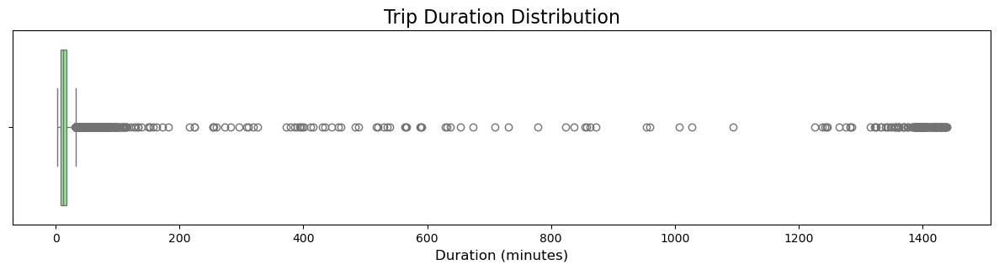

In [43]:
# Display distribusi fitur
plt.figure(figsize=(15, 3))

sns.boxplot(data=df, x="trip_duration", color="lightgreen")
plt.title("Trip Duration Distribution", fontsize=16)
plt.xlabel("Duration (minutes)", fontsize=12)

plt.show()

**Interpretasi:** Distribusi pada fitur trip_duration menunjukkan pola right skewed, yang berarti sebagian besar perjalanan memiliki durasi yang relatif pendek, namun terdapat sejumlah perjalanan dengan durasi yang sangat panjang, seperti perjalanan dengan durasi 250 menit, yang bisa dianggap sebagai outlier atau durasi yang tidak wajar.

In [44]:
# Handling duration > 250 minutes
df[df["trip_distance"] == df["trip_distance"].max()]

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,PUZone,PUService_zone,DOBorough,DOZone,DOService_zone,pickup_time,pickup_day,day_type,distance_bins,trip_duration
8072,2,2023-01-05 14:53:00,2023-01-05 16:19:20,N,Standard rate,130,1,1,41.74,114.0,...,Jamaica,Boro Zone,EWR,Newark Airport,EWR,Afternoon,Thursday,Weekdays,>10 miles,86.33


**Interpretasi:** Dari data di atas dapat diketahui bahwa jarak perjalanan terjauh adalah 41,74 mil dengan durasi perjalanan 86 menit. Sedangkan jika perjalanan tersebut ditempuh dengan kecepatan minimum di kota New York yaitu 10 mph, maka waktu yang dibutuhkan adalah 4.17 jam (250 menit). Dan dapat disimpulkan bahwa durasi yangg lebih dari 250 menit merupakan outlier (nilai yang tidak wajar) ekstrem.
Sama seperti fitur distance sebelumnya , kita akan coba ubah data extreme outliers dengan nilai central tendency (median) dari trip_duration untuk masing-masing titik keberangkatan dan pemberhentian pada record yang sudah ada di dalam dataset.

In [45]:
# Handling Extreme Outliers
duration_outliers = df[df["trip_duration"] > 250][
    [
        "lpep_pickup_datetime",
        "lpep_dropoff_datetime",
        "PULocationID",
        "DOLocationID",
        "trip_duration",
    ]
]
print("Total outliers:", len(duration_outliers))
duration_outliers.head()

Total outliers: 216


,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_duration
49,2023-01-01 00:23:04,2023-01-01 23:18:32,255,48,1375.47
108,2023-01-01 01:53:59,2023-01-02 00:00:00,260,223,1326.02
118,2023-01-01 01:25:46,2023-01-02 00:29:15,129,37,1383.48
207,2023-01-01 03:12:42,2023-01-02 02:03:43,129,129,1371.02
262,2023-01-01 04:03:36,2023-01-02 03:31:50,65,37,1408.23


In [46]:
# trip_duration < 250 menit sebagai referensi valid
duration_by_loc = (
    df[df["trip_duration"] < 250]
    .groupby(["PULocationID", "DOLocationID"])
    .agg(
        count=("trip_duration", "count"),
        avg_duration=("trip_duration", "mean"),
        median_duration=("trip_duration", "median"),
    )
    .reset_index()
)

In [47]:
# Merge outlier pada fitur dengan nilai wajar
duration_distance = pd.merge(
    duration_outliers, duration_by_loc, on=["PULocationID", "DOLocationID"], how="left"
)
duration_distance.drop(columns="count", inplace=True)
duration_distance.index = duration_outliers.index
display(duration_distance.head())

# Imputasi nilai median dari fitur durasi
print("Hasil Imputasi:")
df.loc[duration_outliers.index, "trip_duration"] = duration_distance[
    "median_duration"
].round(2)
display(
    df.loc[duration_outliers.index][
        [
            "lpep_pickup_datetime",
            "lpep_dropoff_datetime",
            "PULocationID",
            "DOLocationID",
            "trip_duration",
        ]
    ].head()
)

,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_duration,avg_duration,median_duration
49,2023-01-01 00:23:04,2023-01-01 23:18:32,255,48,1375.47,24.526667,24.580
108,2023-01-01 01:53:59,2023-01-02 00:00:00,260,223,1326.02,12.232537,11.880
118,2023-01-01 01:25:46,2023-01-02 00:29:15,129,37,1383.48,22.133333,20.350
207,2023-01-01 03:12:42,2023-01-02 02:03:43,129,129,1371.02,12.276617,9.200
262,2023-01-01 04:03:36,2023-01-02 03:31:50,65,37,1408.23,23.145000,22.445


Hasil Imputasi:


,lpep_pickup_datetime,lpep_dropoff_datetime,PULocationID,DOLocationID,trip_duration
49,2023-01-01 00:23:04,2023-01-01 23:18:32,255,48,24.58
108,2023-01-01 01:53:59,2023-01-02 00:00:00,260,223,11.88
118,2023-01-01 01:25:46,2023-01-02 00:29:15,129,37,20.35
207,2023-01-01 03:12:42,2023-01-02 02:03:43,129,129,9.20
262,2023-01-01 04:03:36,2023-01-02 03:31:50,65,37,22.44


In [48]:
# Validasi data
isna = df.loc[df["trip_duration"].isna()][
    [
        "lpep_pickup_datetime",
        "lpep_dropoff_datetime",
        "PUBorough",
        "DOBorough",
        "trip_duration",
    ]
]
display(isna)

,lpep_pickup_datetime,lpep_dropoff_datetime,PUBorough,DOBorough,trip_duration
556,2023-01-01 13:07:46,2023-01-01 19:45:18,Queens,Queens,NaN
16126,2023-01-09 13:44:30,2023-01-10 11:07:20,Brooklyn,Brooklyn,NaN
29711,2023-01-15 17:52:52,2023-01-15 22:11:55,Brooklyn,Brooklyn,NaN
30240,2023-01-16 03:13:50,2023-01-17 00:00:00,Queens,Queens,NaN
40817,2023-01-21 03:09:37,2023-01-22 01:46:44,Queens,Manhattan,NaN
41975,2023-01-21 17:19:27,2023-01-22 00:00:00,Queens,Queens,NaN
42432,2023-01-21 20:29:58,2023-01-22 02:59:25,Brooklyn,Brooklyn,NaN
44216,2023-01-22 21:35:25,2023-01-23 20:42:11,Bronx,Bronx,NaN
52135,2023-01-26 12:45:43,2023-01-27 00:00:00,Bronx,Manhattan,NaN
56314,2023-01-28 04:15:15,2023-01-29 03:58:28,Brooklyn,Manhattan,NaN


**Interpretasi:** Terdapat sejumlah nilai trip_duration yang hilang atau tidak terdeteksi (NaN). Hal ini kemungkinan disebabkan oleh kesalahan pada sistem pencatatan, seperti kegagalan perangkat GPS dalam merekam durasi perjalanan atau kerusakan data selama proses pengumpulan. Data yang hilang ini perlu ditangani dengan hati-hati, dan salah satu pendekatan yang dapat digunakan adalah imputasi berdasarkan rute borough, untuk memastikan data yang hilang dapat diperkirakan dengan informasi yang relevan.

In [49]:
# Melihat distribusi nilai wajar pada fitur
duration_by_borough = (
    df[df["trip_duration"] < 250]
    .groupby(["PUBorough", "DOBorough"])
    .agg(
        count=("trip_duration", "count"),
        avg_duration=("trip_duration", "mean"),
        median_duration=("trip_duration", "median"),
    )
    .reset_index()
)

In [50]:
# Imputasi nilai median
duration_distance = pd.merge(
    isna, duration_by_borough, on=["PUBorough", "DOBorough"], how="left"
)
duration_distance.drop(columns="count", inplace=True)
duration_distance.index = isna.index
display(duration_distance.head())

print("Hasil Imputasi:")
df.loc[isna.index, "trip_duration"] = duration_distance["median_duration"].round(2)
display(
    df.loc[isna.index][
        [
            "PULocationID",
            "DOLocationID",
            "lpep_pickup_datetime",
            "lpep_dropoff_datetime",
            "trip_duration",
        ]
    ].head()
)

,lpep_pickup_datetime,lpep_dropoff_datetime,PUBorough,DOBorough,trip_duration,avg_duration,median_duration
556,2023-01-01 13:07:46,2023-01-01 19:45:18,Queens,Queens,NaN,13.163157,11.05
16126,2023-01-09 13:44:30,2023-01-10 11:07:20,Brooklyn,Brooklyn,NaN,16.408103,13.91
29711,2023-01-15 17:52:52,2023-01-15 22:11:55,Brooklyn,Brooklyn,NaN,16.408103,13.91
30240,2023-01-16 03:13:50,2023-01-17 00:00:00,Queens,Queens,NaN,13.163157,11.05
40817,2023-01-21 03:09:37,2023-01-22 01:46:44,Queens,Manhattan,NaN,26.873925,24.86


Hasil Imputasi:


,PULocationID,DOLocationID,lpep_pickup_datetime,lpep_dropoff_datetime,trip_duration
556,223,8,2023-01-01 13:07:46,2023-01-01 19:45:18,11.05
16126,17,256,2023-01-09 13:44:30,2023-01-10 11:07:20,13.91
29711,150,123,2023-01-15 17:52:52,2023-01-15 22:11:55,13.91
30240,129,16,2023-01-16 03:13:50,2023-01-17 00:00:00,11.05
40817,179,114,2023-01-21 03:09:37,2023-01-22 01:46:44,24.86


In [51]:
# Menghitung ulang dropoff time berdasarkan pickup time dan durasi perjalanan
df.loc[duration_outliers.index, "lpep_dropoff_datetime"] = df[
    "lpep_pickup_datetime"
] + pd.to_timedelta((df["trip_duration"]), unit="m").dt.round("S")
df.loc[duration_outliers.index][
    [
        "PULocationID",
        "DOLocationID",
        "lpep_pickup_datetime",
        "lpep_dropoff_datetime",
        "trip_duration",
    ]
].head()

,PULocationID,DOLocationID,lpep_pickup_datetime,lpep_dropoff_datetime,trip_duration
49,255,48,2023-01-01 00:23:04,2023-01-01 00:47:39,24.58
108,260,223,2023-01-01 01:53:59,2023-01-01 02:05:52,11.88
118,129,37,2023-01-01 01:25:46,2023-01-01 01:46:07,20.35
207,129,129,2023-01-01 03:12:42,2023-01-01 03:21:54,9.20
262,65,37,2023-01-01 04:03:36,2023-01-01 04:26:02,22.44


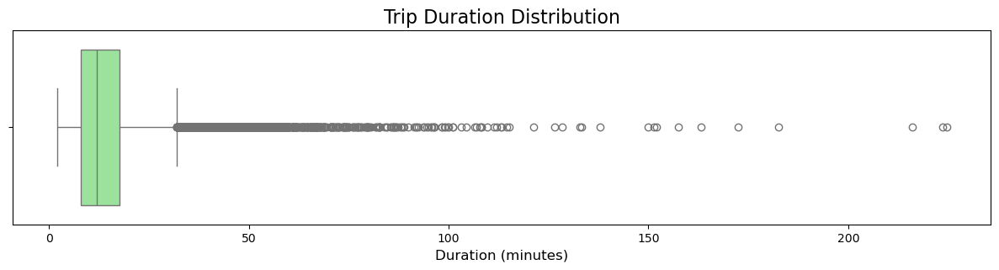

In [52]:
# Melihat distribusi fitur
plt.figure(figsize=(15, 3))

sns.boxplot(data=df, x="trip_duration", color="lightgreen")
plt.title("Trip Duration Distribution", fontsize=16)
plt.xlabel("Duration (minutes)", fontsize=12)

plt.show()

- Selanjutnya, fitur `trip_duration` akan dikelompokkan ke dalam beberapa kategori tertentu untuk keperluan analisis lebih lanjut. Pengelompokan ini akan membantu dalam memahami pola durasi perjalanan dengan cara yang lebih terstruktur dan memudahkan analisis mendalam.

In [53]:
# Binning fitur trip_duration
bins_of_duration = [0, 10, 20, 30, np.inf]
labels_of_duration = ["<10 minutes", "11-20 minutes", "21-30 minutes", ">30 minutes"]

df["duration_bins"] = pd.cut(
    df["trip_duration"], bins=bins_of_duration, labels=labels_of_duration
)

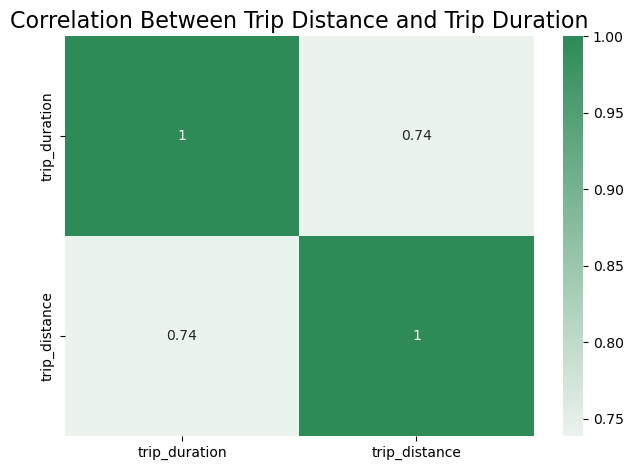

In [54]:
# Melihat korelasi antar fitur trip_distance dan trip_duration
colors = sns.light_palette("seagreen", as_cmap=True)
sns.heatmap(df[["trip_duration", "trip_distance"]].corr(), annot=True, cmap=colors)
plt.title("Correlation Between Trip Distance and Trip Duration", fontsize=16)
plt.tight_layout()
plt.show()

**Interpretasi:** Berdasarkan visualisasi diatas dapat disimpulkan bahwa fitur `trip_distance` dengan `trip_duration` memiliki hubungan positif yang cukup kuat, yaitu 0.74. Artinya semakin jauh jarak yang ditempuh, maka waktu perjalananya akan semakin bertambah.
Dari kedua fitur tersebut dapat mengahasilkan fitur `driving_speed`.

### Create Feature - Driving Speed
`driving_speed` merupakan fitur yang akan digunakan untuk membantu deteksi anomali (contoh: jarak panjang dengan tarif rendah).

In [55]:
# menghitung kecepatan berkendara
df["driving_speed"] = (df["trip_distance"] / (df["trip_duration"] / 60)).round(2)

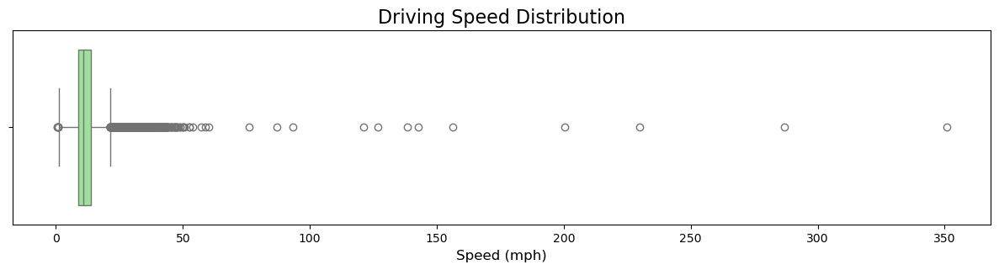

In [56]:
# Melihat distribusi fitur
plt.figure(figsize=(15, 3))

sns.boxplot(data=df, x="driving_speed", color="lightgreen")
plt.title("Driving Speed Distribution", fontsize=16)
plt.xlabel("Speed (mph)", fontsize=12)

plt.show()

**Interpretasi:** Berdasarkan boxplot di atas terdapat extreme outliers pada fitur ini seperti kecepatan yang lebih dari 100 mph dan kurang dari 5 mph.
Berdasarkan aturan resmi dari New York Police Departement (NYPD) yang dikeluarkan pada 7 November 2014, Batas kecepatan di kota New York secara umum adalah 25 mph(mil per jam), kecuali jika ada rambu yang menyatakan lain. 
Namun, kecepatan ini dapat bervariasi tergantung kondisi keramaian lalu lintas, dengan kemungkinan adanya kemacetan maka toleransi kecepatan terendah yaitu kurang lebih 5 mph(mil per jam).
Sedangkan untuk batas kecepatan di jalan raya sekitar 65 mph (mil per jam). Dengan toleransi 5 mph, maka toleransi kecepatan tertinggi yaitu 70 mph. 
Oleh karena itu, data yang mengandung nilai extreme outliers (yang tidak wajar) tersebut akan dibersihkan.  

In [57]:
# Display statistik pada fitur
print("Statistik Kecepatan:")
pd.DataFrame(df["driving_speed"].describe())

Statistik Kecepatan:


,driving_speed
count,60714.000000
mean,12.055450
std,5.781682
min,0.400000
25%,8.700000
50%,10.750000
75%,13.820000
max,350.710000


**Interpretasi:** Rata-rata kecepatan berkendara di kota New York berdasarkan statistik deskripsi di atas adalah 12 mph (mil per jam).

In [58]:
# Handling Extreme Outliers
speed_outliers = df[(df["driving_speed"] < 5) | (df["driving_speed"] > 70)][
    [
        "lpep_pickup_datetime",
        "lpep_dropoff_datetime",
        "trip_distance",
        "distance_bins",
        "trip_duration",
        "duration_bins",
        "driving_speed",
    ]
]

print("Total outliers:", len(speed_outliers))
speed_outliers.sort_values(by="driving_speed", ascending=True).head()

Total outliers: 906


,lpep_pickup_datetime,lpep_dropoff_datetime,trip_distance,distance_bins,trip_duration,duration_bins,driving_speed
60667,2023-01-30 14:55:13,2023-01-30 16:31:28,0.64,<2 miles,96.25,>30 minutes,0.40
21587,2023-01-11 21:28:35,2023-01-12 00:00:00,1.63,<2 miles,151.42,>30 minutes,0.65
17029,2023-01-09 19:38:56,2023-01-09 20:51:12,1.03,<2 miles,72.27,>30 minutes,0.86
23872,2023-01-12 20:15:27,2023-01-13 00:00:00,3.32,3-6 miles,224.55,>30 minutes,0.89
23993,2023-01-12 21:42:06,2023-01-13 00:00:00,2.14,3-6 miles,137.90,>30 minutes,0.93


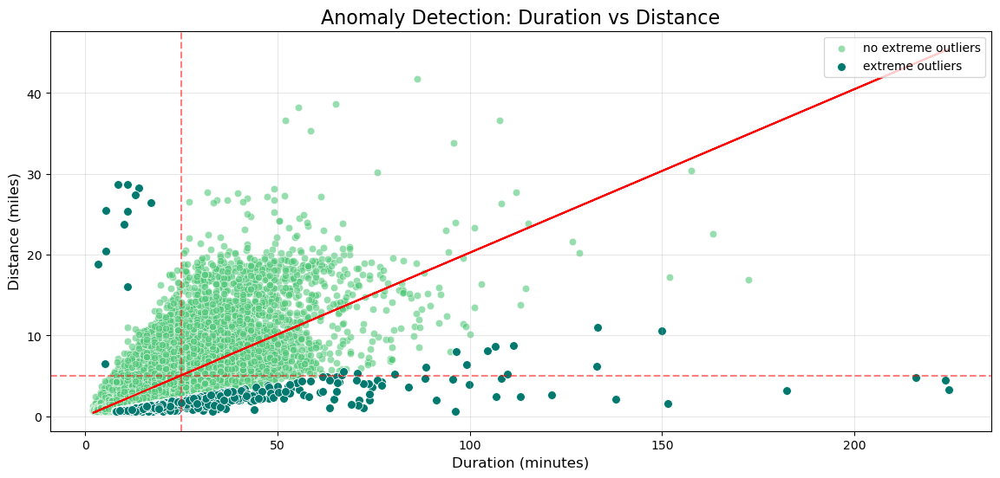

In [59]:
# Melihat sebaran data pada fitur trip_duration & trip_distance
plt.figure(figsize=(14, 6))
sns.scatterplot(
    data=df,
    x="trip_duration",
    y="trip_distance",
    color=["#50C878"],
    label="no extreme outliers",
    alpha=0.6,
)

# Highlight anomali
sns.scatterplot(
    x=speed_outliers["trip_duration"],
    y=speed_outliers["trip_distance"],
    color=["#01796F"],
    s=50,
    label="extreme outliers",
)

x, y = df["trip_duration"], df["trip_distance"]
a, b = np.polyfit(x, y, 1)
plt.plot(x, a * x + b, color="red")

# Garis referensi
plt.axhline(y=5, color="red", linestyle="--", alpha=0.5)  # Jarak 5 mil
plt.axvline(x=25, color="red", linestyle="--", alpha=0.5)  # Durasi 25 menit

plt.title("Anomaly Detection: Duration vs Distance", fontsize=16)
plt.xlabel("Duration (minutes)", fontsize=12)
plt.ylabel("Distance (miles)", fontsize=12)
plt.legend(loc=("upper right"))
plt.grid(alpha=0.3)
plt.show()

In [60]:
# Melihat kecepatan rata-rata dan median berdasarkan kategori jarak
ct_duration = (
    df.loc[~df.index.isin(speed_outliers.index)]
    .groupby("distance_bins")
    .agg(
        count=("distance_bins", "count"),
        avg_speed=("driving_speed", "mean"),
        median_speed=("driving_speed", "median"),
    )
    .reset_index()
)
ct_duration

,distance_bins,count,avg_speed,median_speed
0,<2 miles,29179,10.154240,9.71
1,3-6 miles,24525,12.529518,11.43
2,7-10 miles,4569,18.959685,18.07
3,>10 miles,1535,23.487290,22.29


In [61]:
# Melihat distribusi fitur
new_duration = pd.merge(speed_outliers, ct_duration, on="distance_bins", how="left")
new_duration.index = speed_outliers.index
new_duration.head()

,lpep_pickup_datetime,lpep_dropoff_datetime,trip_distance,distance_bins,trip_duration,duration_bins,driving_speed,count,avg_speed,median_speed
207,2023-01-01 03:12:42,2023-01-01 03:21:54,0.72,<2 miles,9.20,<10 minutes,4.70,29179,10.154240,9.71
545,2023-01-01 12:53:04,2023-01-01 14:10:09,4.26,3-6 miles,77.08,>30 minutes,3.32,24525,12.529518,11.43
556,2023-01-01 13:07:46,2023-01-01 13:18:49,16.00,>10 miles,11.05,11-20 minutes,86.88,1535,23.487290,22.29
648,2023-01-01 13:34:51,2023-01-01 13:59:58,1.86,<2 miles,25.12,21-30 minutes,4.44,29179,10.154240,9.71
769,2023-01-01 15:33:05,2023-01-01 16:03:34,1.15,<2 miles,30.48,>30 minutes,2.26,29179,10.154240,9.71


In [62]:
# Memperbaiki nilai kecepatan, durasi trip, dan waktu drop-off
df.loc[speed_outliers.index, "driving_speed"] = new_duration["median_speed"].round(2)

time_duration = (df["trip_distance"] / df["driving_speed"]) * 60
df.loc[speed_outliers.index, "trip_duration"] = time_duration.round(2)

df.loc[speed_outliers.index, "duration_bins"] = pd.cut(
    df["trip_duration"], bins=bins_of_duration, labels=labels_of_duration
)

df.loc[speed_outliers.index, "lpep_dropoff_datetime"] = df[
    "lpep_pickup_datetime"
] + pd.to_timedelta(df["trip_duration"], unit="m").dt.round("S")

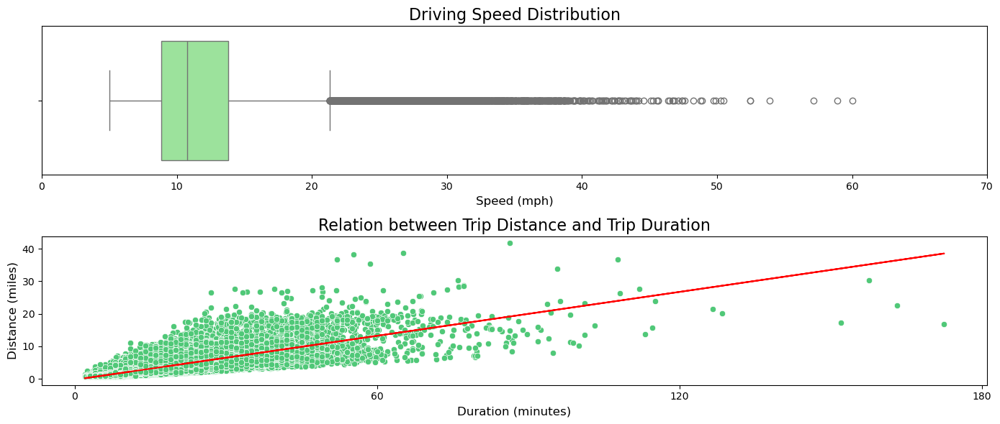

In [63]:
plt.figure(figsize=(14, 6))

# Distribusi speed
plt.subplot(2, 1, 1)
sns.boxplot(data=df, x="driving_speed", color="lightgreen")
plt.title("Driving Speed Distribution", fontsize=16)
plt.xlabel("Speed (mph)", fontsize=12)
plt.xticks(np.arange(0, 71, 10))


# Hubungan jarak vs durasi
plt.subplot(2, 1, 2)
sns.scatterplot(df, x="trip_duration", y="trip_distance", color=["#50C878"])
plt.title("Relation between Trip Distance and Trip Duration", fontsize=16)
plt.xlabel("Duration (minutes)", fontsize=12)
plt.ylabel("Distance (miles)", fontsize=12)
plt.xticks(np.arange(0, 181, 60))

# Garis regresi linear
x, y = df["trip_duration"], df["trip_distance"]
m, b = np.polyfit(x, y, 1)
plt.plot(x, m * x + b, color="red")

plt.tight_layout()
plt.show()

**Interpretasi:** Mayoritas nilai kecepatan berkisar antara 5 hingga 25 mph, yang sesuai dengan kondisi nyata lalu lintas taksi di kota New York. Kecepatan ini mencerminkan situasi lalu lintas yang padat dan peraturan kecepatan yang ketat di area perkotaan.
Namun, terdapat sejumlah outlier, bahkan beberapa di antaranya menunjukkan kecepatan ekstrem melebihi 50 hingga 60 mph. Kecepatan setinggi ini dianggap tidak realistis untuk sebagian besar wilayah NYC, kecuali mungkin di jalan tol seperti FDR Drive atau West Side Highway. Oleh karena itu, data tersebut dianggap sebagai anomali dan akan dibersihkan dari dataset guna menjaga kualitas dan validitas analisis selanjutnya.

In [64]:
# Melihat data kecepatan sangat tinggi di jarak pendek
mask_speed_outlier = (df["trip_distance"] < 2) & (df["driving_speed"] > 30)
print(
    "Jumlah data anomali (jarak < 2 mil & kecepatan > 30 mph):",
    mask_speed_outlier.sum(),
)

df = df[
    (df["driving_speed"] <= 50)
    & ~((df["trip_distance"] < 2) & (df["driving_speed"] > 30))
]

Jumlah data anomali (jarak < 2 mil & kecepatan > 30 mph): 7


In [65]:
# Binning pada fitur driving_speed
bins_of_speed = [0, 10, 20, 30, np.inf]
labels_of_speed = ["<10 mph", "11-20 mph", "21-30 mph", ">30 mph"]
df["speed_bins"] = pd.cut(
    df["driving_speed"], bins=bins_of_speed, labels=labels_of_speed
)

In [66]:
# Display fitur
df["speed_bins"].value_counts()

speed_bins
11-20 mph    30928
<10 mph      24921
21-30 mph     4149
>30 mph        701
Name: count, dtype: int64

- Selanjutnya, fitur `driving_speed` akan dikelompokkan ke dalam beberapa kategori tertentu untuk keperluan analisis lebih lanjut. Pengelompokan ini akan membantu dalam memahami pola kecepatan berkendara di kota New York dengan cara yang lebih terstruktur dan memudahkan analisis mendalam.

### Fare Amount

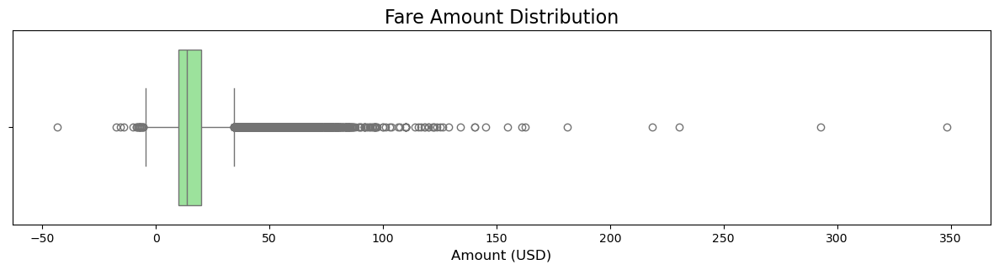

In [67]:
# Melihat distribusi fitur
plt.figure(figsize=(15, 3))

sns.boxplot(data=df, x="fare_amount", color="lightgreen")
plt.title("Fare Amount Distribution", fontsize=16)
plt.xlabel("Amount (USD)", fontsize=12)

plt.show()

**Interpretasi:** terdapat nilai negatif pada fitur `fare_amount`, yang secara logika seharusnya selalu bernilai positif karena merepresentasikan tarif yang dibayarkan penumpang. Nilai negatif ini kemungkinan disebabkan oleh kesalahan pencatatan atau anomali sistem. 
Berdasarkan ketentuan resmi yang tercantum pada laman New York City Taxi and Limousine Commission (TLC) https://www.nyc.gov/site/tlc/passengers/taxi-fare.page, tarif minimum untuk setiap perjalanan taksi adalah sebesar $3.00. Oleh karena itu, dilakukan proses penyaringan data untuk menghapus seluruh entri yang memiliki nilai tarif `fare_amount` di bawah batas minimum tersebut guna menjaga validitas data yang dianalisis.

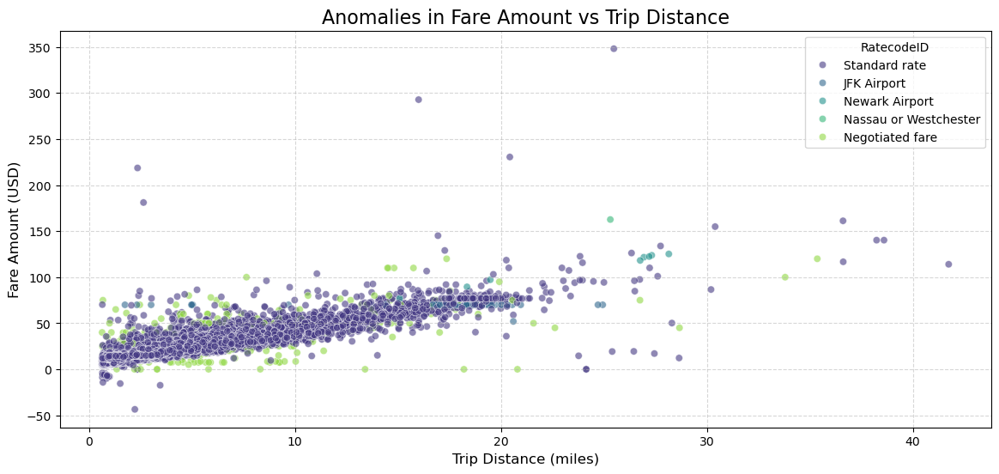

In [68]:
# Melihat anomali dengan membandingkan dengan fitur trip_distance
plt.figure(figsize=(14, 6))
sns.scatterplot(
    data=df,
    x="trip_distance",
    y="fare_amount",
    hue="RatecodeID",
    palette="viridis",
    alpha=0.6,
)
plt.title("Anomalies in Fare Amount vs Trip Distance", fontsize=16)
plt.xlabel("Trip Distance (miles)", fontsize=12)
plt.ylabel("Fare Amount (USD)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

**Interpretasi:** Berdasarkan visualisasi yang ditampilkan, dapat disimpulkan bahwa terdapat hubungan linear positif antara fitur `trip_distance` dengan `fare_amount`. Artinya, semakin jauh jarak perjalanan yang ditempuh, semakin besar tarif yang harus dibayar oleh penumpang. Hal ini konsisten dengan struktur tarif taksi yang umumnya mengenakan biaya per mil dan biaya per menit.
Namun demikian, terlihat adanya sejumlah outliers dalam data, yaitu titik-titik yang tidak sesuai dengan pola umum hubungan antara jarak dan tarif. Hal ini kemungkinan disebabkan oleh pencatatan yang tidak akurat atau karena adanya faktor tertentu, seperti kemacetan atau perjalanan pada jam sibuk. 

In [69]:
# Handling outlier pada fitur RatecodeID, fare_amount, trip_distance
outliers_amount = pd.DataFrame()

# Hapus anomali pada fitur RatecodeID = Standard rate
mask_sr_1 = (
    (df["RatecodeID"] == "Standard rate")
    & (df["fare_amount"] > 75)
    & (df["trip_distance"] < 5)
)
mask_sr_2 = (
    (df["RatecodeID"] == "Standard rate")
    & (df["fare_amount"] > 120)
    & (df["trip_distance"] < 20)
)
mask_sr_3 = (
    (df["RatecodeID"] == "Standard rate")
    & (df["fare_amount"] < 60)
    & (df["trip_distance"] > 20)
)
mask_sr_4 = (
    (df["RatecodeID"] == "Standard rate")
    & (df["fare_amount"] > 150)
    & (df["trip_distance"] < 30)
)
sr_outlier = df[mask_sr_1 | mask_sr_2 | mask_sr_3 | mask_sr_4]
outliers_amount = pd.concat([outliers_amount, sr_outlier])

# Hapus anomali pada fitur RatecodeID = Negotiated fare
mask_nf_1 = (
    (df["RatecodeID"] == "Negotiated fare")
    & (df["fare_amount"] > 99)
    & (df["trip_distance"] < 20)
)
mask_nf_2 = (
    (df["RatecodeID"] == "Negotiated fare")
    & (df["fare_amount"] < 5)
    & (df["trip_distance"] < 10)
)
mask_nf_3 = (
    (df["RatecodeID"] == "Negotiated fare")
    & (df["fare_amount"] < 60)
    & (df["trip_distance"] > 20)
)
mask_nf_4 = (
    (df["RatecodeID"] == "Negotiated fare")
    & (df["fare_amount"] > 60)
    & (df["trip_distance"] < 10)
)
nf_outlier = df[mask_nf_1 | mask_nf_2 | mask_nf_3 | mask_nf_4]
outliers_amount = pd.concat([outliers_amount, nf_outlier])

# Hapus anomali pada fitur RatecodeID = JFK Airport
mask_jfk = (df["RatecodeID"] == "JFK Airport") & (df["fare_amount"] < 70)
jfk_outlier = df[mask_jfk]
outliers_amount = pd.concat([outliers_amount, jfk_outlier])

# Hapus anomali pada fitur RatecodeID = Newark Airport
mask_ewr = (df["RatecodeID"] == "Newark Airport") & (df["fare_amount"] > 160)
ewr_outlier = df[mask_ewr]
outliers_amount = pd.concat([outliers_amount, ewr_outlier])

mask_lower = df["fare_amount"] < 3
lower_outlier = df[mask_lower]
outliers_amount = pd.concat([outliers_amount, lower_outlier])

# Display jumlah outlier
print("Total standard rate outlier:", len(sr_outlier))
print("Total negotiated rate outlier:", len(nf_outlier))
print("Total JFK airport outlier:", len(jfk_outlier))
print("Total Newark airport outlier:", len(ewr_outlier))
print("Total outlier < 3 USD:", len(lower_outlier))
print("Total seluruh outlier:", len(outliers_amount))

outliers_amount = outliers_amount[["RatecodeID", "distance_bins", "fare_amount"]]

outliers_amount.head()

Total standard rate outlier: 22
Total negotiated rate outlier: 28
Total JFK airport outlier: 1
Total Newark airport outlier: 0
Total outlier < 3 USD: 38
Total seluruh outlier: 89


,RatecodeID,distance_bins,fare_amount
556,Standard rate,>10 miles,292.8
2014,Standard rate,3-6 miles,218.6
7731,Standard rate,>10 miles,348.1
7746,Standard rate,3-6 miles,81.4
9964,Standard rate,3-6 miles,80.0


In [70]:
# Imputasi outlier dengan nilai median
ct_amount = (
    df[~df.index.isin(outliers_amount.index)]
    .groupby(["RatecodeID", "distance_bins"])
    .agg(
        count=("fare_amount", "count"),
        avg_fare=("fare_amount", "mean"),
        median_fare=("fare_amount", "median"),
    )
    .reset_index()
)
ct_amount.head()

,RatecodeID,distance_bins,count,avg_fare,median_fare
0,Standard rate,<2 miles,29734,10.010064,10.0
1,Standard rate,3-6 miles,24377,19.002886,17.7
2,Standard rate,7-10 miles,4460,34.705114,33.8
3,Standard rate,>10 miles,1319,56.322714,52.7
4,JFK Airport,<2 miles,1,70.000000,70.0


In [71]:
# Validasi setelah imputasi
new_fare = pd.merge(
    outliers_amount, ct_amount, on=["RatecodeID", "distance_bins"], how="left"
)
new_fare.drop(columns="count", inplace=True)
new_fare.index = outliers_amount.index
display(new_fare.sample(5))

df.loc[outliers_amount.index, "fare_amount"] = new_fare["median_fare"]
display(
    df.loc[outliers_amount.index][["RatecodeID", "distance_bins", "fare_amount"]].head()
)

,RatecodeID,distance_bins,fare_amount,avg_fare,median_fare
42824,Negotiated fare,7-10 miles,70.00,32.690185,30.0
232,Negotiated fare,3-6 miles,78.00,22.160000,20.0
45204,Standard rate,>10 miles,50.20,56.322714,52.7
65001,Standard rate,>10 miles,19.46,56.322714,52.7
182,Negotiated fare,3-6 miles,80.00,22.160000,20.0


,RatecodeID,distance_bins,fare_amount
556,Standard rate,>10 miles,52.7
2014,Standard rate,3-6 miles,17.7
7731,Standard rate,>10 miles,52.7
7746,Standard rate,3-6 miles,17.7
9964,Standard rate,3-6 miles,17.7


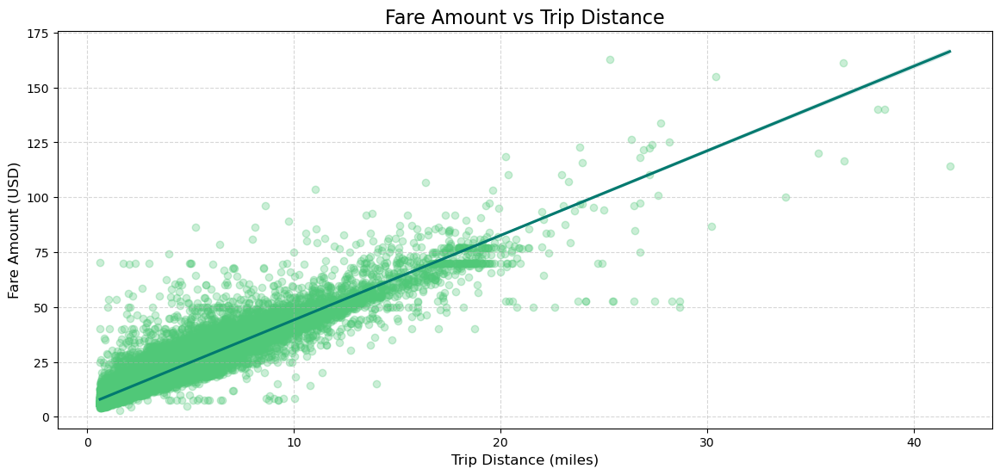

In [72]:
# Melihat korelasi antar fitur trip_distance dan Fare_amount
plt.figure(figsize=(14, 6))
sns.regplot(
    data=df,
    x="trip_distance",
    y="fare_amount",
    scatter_kws={"alpha": 0.3, "color": "#50C878"},
    line_kws={"color": "#01796F"},
)
plt.title("Fare Amount vs Trip Distance", fontsize=16)
plt.xlabel("Trip Distance (miles)", fontsize=12)
plt.ylabel("Fare Amount (USD)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

In [73]:
# Binning biaya perjalanan ke beberapa kategori
bins_of_fare = [0, 10, 20, 30, 40, np.inf]
labels_of_fare = ["<10 USD", "11-20 USD", "21-30 USD", "31-40 USD", ">40 USD"]
df["fare_amount_bins"] = pd.cut(
    df["fare_amount"], bins=bins_of_fare, labels=labels_of_fare
)

In [74]:
df["fare_amount_bins"].value_counts()

fare_amount_bins
11-20 USD    28371
<10 USD      17620
21-30 USD     8729
31-40 USD     3540
>40 USD       2439
Name: count, dtype: int64

### Extra

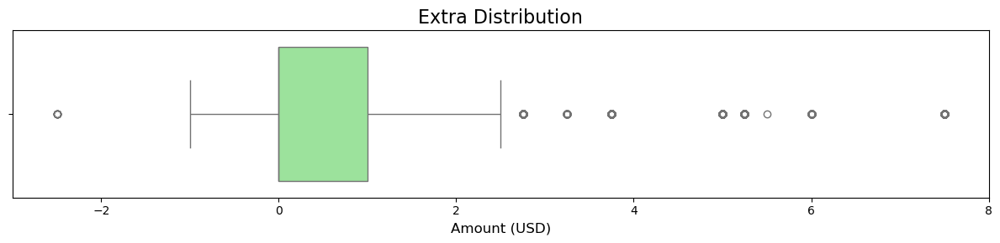

In [75]:
# Melihat distribusi pada fitur
plt.figure(figsize=(12, 3))
sns.boxplot(x=df["extra"], color="lightgreen")
plt.title("Extra Distribution", fontsize=16)
plt.xlabel("Amount (USD)", fontsize=12)

plt.tight_layout()
plt.show()

**Interpretasi:** Nilai negatif pada fitur extra kemungkinan merupakan kesalahan pencatatan, sehingga akan dihapus untuk menjaga kualitas data.

In [76]:
df = df[df["extra"] >= 0]

### Mta Tax

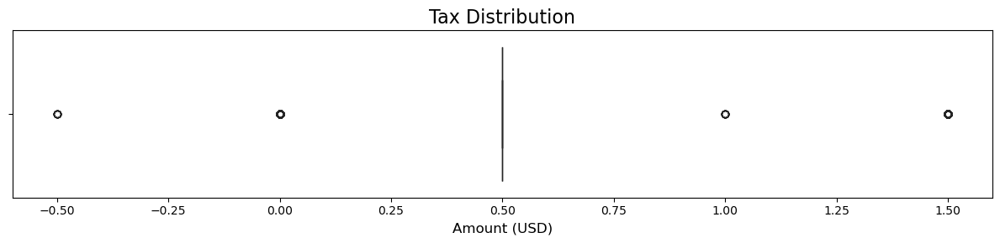

In [77]:
# Melihat distribusi pada fitur
plt.figure(figsize=(12, 3))
sns.boxplot(x=df["mta_tax"], color="green")
plt.title("Tax Distribution", fontsize=16)
plt.xlabel("Amount (USD)", fontsize=12)

plt.tight_layout()
plt.show()

**Interpretasi:** sumber: https://www.nyc.gov/site/tlc/about/congestion-surcharge.page

Terlihat sejumlah data pada fitur `mta_tax` mengandung nilai negatif. Nilai negatif tersebut diidentifikasi sebagai error sistem dan akan dikoreksi dengan fungsi absolut untuk menjaga konsistensi data.

In [78]:
# Merubah nilai negatif dengan nilai positif pada fitur
df["mta_tax"] = df["mta_tax"].abs()
df["mta_tax"].describe()

count    60686.000000
mean         0.578412
std          0.359642
min          0.000000
25%          0.500000
50%          0.500000
75%          0.500000
max          1.500000
Name: mta_tax, dtype: float64

### Improvement Surcharge 

In [79]:
# Melihat nilai outlier pada fitur
outliers = df[df["improvement_surcharge"] < 0]
print("Total outliers:", len(outliers))
display(outliers)

Total outliers: 9


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,DOService_zone,pickup_time,pickup_day,day_type,distance_bins,trip_duration,duration_bins,driving_speed,speed_bins,fare_amount_bins
1686,2,2023-01-02 12:56:53,2023-01-02 13:00:10,N,Standard rate,75,75,1,0.77,10.0,...,Boro Zone,Afternoon,Monday,Weekdays,<2 miles,3.28,<10 minutes,14.09,11-20 mph,<10 USD
7419,2,2023-01-05 09:28:13,2023-01-05 09:33:22,N,Standard rate,181,181,1,0.84,10.0,...,Boro Zone,Morning,Thursday,Weekdays,<2 miles,5.15,<10 minutes,9.79,<10 mph,<10 USD
7819,2,2023-01-05 12:51:03,2023-01-05 12:54:47,N,Standard rate,179,7,2,0.71,10.0,...,Boro Zone,Afternoon,Thursday,Weekdays,<2 miles,3.73,<10 minutes,11.42,11-20 mph,<10 USD
7995,2,2023-01-05 14:03:43,2023-01-05 14:08:18,N,Standard rate,236,238,1,0.75,10.0,...,Yellow Zone,Afternoon,Thursday,Weekdays,<2 miles,4.58,<10 minutes,9.83,<10 mph,<10 USD
10027,2,2023-01-06 12:04:12,2023-01-06 12:07:05,N,Standard rate,42,42,1,0.64,10.0,...,Boro Zone,Afternoon,Friday,Weekdays,<2 miles,2.88,<10 minutes,13.33,11-20 mph,<10 USD
15689,2,2023-01-09 09:38:39,2023-01-09 09:46:08,N,Standard rate,65,66,1,0.88,10.0,...,Boro Zone,Morning,Monday,Weekdays,<2 miles,7.48,<10 minutes,7.06,<10 mph,<10 USD
16429,2,2023-01-09 15:44:32,2023-01-09 15:50:08,N,Standard rate,42,41,2,0.82,10.0,...,Boro Zone,Afternoon,Monday,Weekdays,<2 miles,5.60,<10 minutes,8.79,<10 mph,<10 USD
30232,2,2023-01-16 03:39:38,2023-01-16 03:54:12,N,Standard rate,235,78,1,2.34,17.7,...,Boro Zone,NaN,Monday,Weekdays,3-6 miles,14.57,11-20 minutes,9.64,<10 mph,11-20 USD
36900,2,2023-01-19 13:49:39,2023-01-19 14:40:05,N,Standard rate,43,23,1,24.14,52.7,...,Boro Zone,Afternoon,Thursday,Weekdays,>10 miles,50.43,>30 minutes,28.72,21-30 mph,>40 USD


**Interpretasi:** sumber: https://www.nyc.gov/site/tlc/about/congestion-surcharge.page

Terlihat sejumlah data pada fitur `improvement_surcharge` mengandung nilai negatif. Sesuai regulasi TLC, biaya Improvement Surcharge ditetapkan sebesar $1.00 per perjalanan. Nilai-nilai selain itu diidentifikasi sebagai error sistem dan akan dikoreksi untuk menjaga konsistensi data.

In [80]:
df["improvement_surcharge"] = df["improvement_surcharge"].abs()

In [81]:
# Melakukan group by berdasarkan 'mta_tax' dan 'improvement_surcharge'
tax_surcharge = (
    df.groupby(["mta_tax", "improvement_surcharge"]).size().reset_index(name="count")
)

# Menambahkan kolom persentase dengan dua angka di belakang koma
tax_surcharge["percentage"] = ((tax_surcharge["count"] / len(df)) * 100).round(2)

# Menampilkan hasil
display(tax_surcharge)

,mta_tax,improvement_surcharge,count,percentage
0,0.0,0.0,22,0.04
1,0.0,0.3,185,0.30
2,0.0,1.0,4415,7.28
3,0.5,0.0,29,0.05
4,0.5,0.3,3346,5.51
5,0.5,1.0,45614,75.16
6,1.0,1.0,11,0.02
7,1.5,1.0,7064,11.64


**Interpretasi:** Terlihat bahwa kombinasi yang benar antara `mta_tax` = 0.5 dan `improvement_surcharge` = 1.0 sebesar 75% dari data secara keseluruhan. Sementara itu, sisanya merupakan kombinasi yang salah.

- Selanjutnya akan dilakukan proses untuk memperbaiki kombinasi yang salah tersebut. maka dari itu dengan mengacu pada seharusnya `mta_tax` = 0.5 dan `improvement_surcharge` = 1, akan dilakukan pengimputan `mta_tax` = 0.5 dan `improvement_surcharge` = 1 kepada semua yang `mta_tax` != 0.5 dan `improvement_surcharge` != 1 untuk menjaga konsistesi data.

In [82]:
# Mengubah semua nilai 'mta_tax' menjadi 0.5
df["mta_tax"] = 0.5

# Mengubah semua nilai 'improvement_surcharge' menjadi 0.3
df["improvement_surcharge"] = 1

display(df[["improvement_surcharge", "mta_tax"]].describe())

,improvement_surcharge,mta_tax
count,60686.0,60686.0
mean,1.0,0.5
std,0.0,0.0
min,1.0,0.5
25%,1.0,0.5
50%,1.0,0.5
75%,1.0,0.5
max,1.0,0.5


### Congestion Surcharge

In [83]:
# Melihat outlier pada fitur
outliers = df[(df["congestion_surcharge"] < 0) | (df["congestion_surcharge"] > 2.75)]
print("Total outliers:", len(outliers))
outliers.describe()

Total outliers: 1


,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,trip_duration,driving_speed
count,1.0,1,1,1.0,1.00,1.0,1.0,1.0,1.0,1.0,1.0,1.00,1.00,1.00,1.00
mean,2.0,2023-01-19 13:49:39,2023-01-19 14:40:05,1.0,24.14,52.7,0.0,0.5,0.0,0.0,1.0,-4.25,-2.75,50.43,28.72
min,2.0,2023-01-19 13:49:39,2023-01-19 14:40:05,1.0,24.14,52.7,0.0,0.5,0.0,0.0,1.0,-4.25,-2.75,50.43,28.72
25%,2.0,2023-01-19 13:49:39,2023-01-19 14:40:05,1.0,24.14,52.7,0.0,0.5,0.0,0.0,1.0,-4.25,-2.75,50.43,28.72
50%,2.0,2023-01-19 13:49:39,2023-01-19 14:40:05,1.0,24.14,52.7,0.0,0.5,0.0,0.0,1.0,-4.25,-2.75,50.43,28.72
75%,2.0,2023-01-19 13:49:39,2023-01-19 14:40:05,1.0,24.14,52.7,0.0,0.5,0.0,0.0,1.0,-4.25,-2.75,50.43,28.72
max,2.0,2023-01-19 13:49:39,2023-01-19 14:40:05,1.0,24.14,52.7,0.0,0.5,0.0,0.0,1.0,-4.25,-2.75,50.43,28.72
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Interpretasi:** sumber: https://www.nyc.gov/site/tlc/about/congestion-surcharge.page

Terlihat sejumlah data pada fitur `congestion_surcharge` mengandung *outlier*. Sesuai regulasi TLC, biaya Kemacetan Negara Bagian New York sebesar 2.50 USD (Taksi Kuning) atau 2.75 USD (Taksi Hijau) atau 75 sen (setiap perjalanan bersama) untuk semua perjalanan yang dimulai, berakhir, atau melewati Manhattan di selatan 96th Street. Nilai-nilai selain itu diidentifikasi sebagai error sistem dan akan dikoreksi untuk menjaga konsistensi data.

In [84]:
# Mengubah outlier negatif menjadi positif
df["congestion_surcharge"] = df["congestion_surcharge"].abs()
df["congestion_surcharge"].describe()

count    60686.000000
mean         0.799376
std          1.208174
min          0.000000
25%          0.000000
50%          0.000000
75%          2.750000
max          2.750000
Name: congestion_surcharge, dtype: float64

### Payment Type

In [85]:
# Penyesuaian nama metode pembayaran
df["payment_type"] = df["payment_type"].replace(
    {
        1: "Credit card",
        2: "Cash",
        3: "No charge",
        4: "Dispute",
        5: "Unknown",
        6: "Voided trip",
    }
)
df["payment_type"].value_counts()

payment_type
Credit card    40680
Cash           19883
No charge        102
Dispute           21
Unknown            0
Name: count, dtype: int64

### Tip Amount

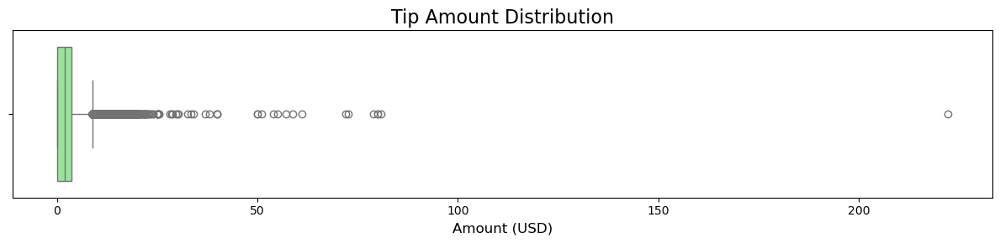

In [86]:
# Melihat distribusi fitur
plt.figure(figsize=(12, 3))
sns.boxplot(x=df["tip_amount"], color="lightgreen")
plt.title("Tip Amount Distribution", fontsize=16)
plt.xlabel("Amount (USD)", fontsize=12)

plt.tight_layout()
plt.show()

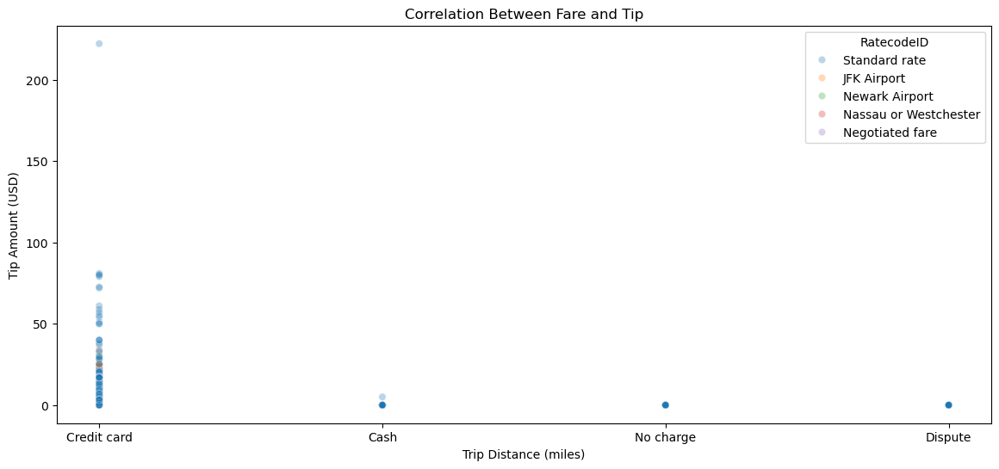

In [87]:
# Melihat hubungan antar fitur fare dan tip
plt.figure(figsize=(14, 6))
sns.scatterplot(
    data=df,
    x="payment_type",
    y="tip_amount",
    hue="RatecodeID",
    alpha=0.3,
    color="YlGnBu",
)
plt.title("Correlation Between Fare and Tip")
plt.xlabel("Trip Distance (miles)")
plt.ylabel("Tip Amount (USD)")
plt.show()

In [88]:
# Melihat nilai outlier pada fitur
outliers = df[(df["RatecodeID"] == "Standard rate") & (df["tip_amount"] > 50)]
print("Total outliers:", len(outliers))
display(outliers[["tip_amount", "fare_amount"]])

# Hapus outlier berdasarkan index
for i in outliers.index.tolist():
    df.drop(index=i, inplace=True)

Total outliers: 13


,tip_amount,fare_amount
297,54.00,33.8
16464,80.00,26.1
19464,72.00,56.2
20685,72.55,8.6
24979,61.00,26.8
31679,79.00,49.2
32984,51.00,25.4
38664,80.88,14.2
40892,80.00,7.2
44718,55.05,17.7


**Interpretasi:** Teridentifikasi sejumlah outlier pada fitur `tip_amount`. Selain itu, berdasarkan informasi yang diperoleh, untuk pembayaran non-tunai (kartu kredit/debit), penumpang biasanya diberi opsi untuk memilih jumlah tip yang akan diberikan melalui layar pembayaran di dalam taksi. Opsi tip yang umumnya tersedia adalah 15%, 20%, 25%, Atau penumpang memilih jumlah tip khusus (custom tip) sesuai keinginan. 
- Oleh karena itu, pada tahap selanjutnya akan dilakukan proses pengelompokkan berdasarkan nilai proporsi tip terhadap biaya yang dikenakan.

In [89]:
# Hitung persentase tip
df["tip_percent"] = (df["tip_amount"] / df["fare_amount"]) * 100

# Inisialisasi kolom tip_category
df["tip_category"] = "Other"

# Kategori 15%
df.loc[(df["tip_percent"] >= 14) & (df["tip_percent"] <= 16), "tip_category"] = "15%"

# Kategori 20%
df.loc[(df["tip_percent"] >= 19) & (df["tip_percent"] <= 21), "tip_category"] = "20%"

# Kategori 25%
df.loc[(df["tip_percent"] >= 24) & (df["tip_percent"] <= 26), "tip_category"] = "25%"

# Custom Tip (> 26%)
df.loc[df["tip_percent"] > 26, "tip_category"] = "Custom Tip"

df["tip_category"].value_counts()

tip_category
Other         41258
Custom Tip    12352
25%            4491
20%            1467
15%            1105
Name: count, dtype: int64

### Total Fare

In [90]:
# Membuat fitur baru sebagai acuan untuk validasi total amount
df["total_fare"] = (
    df["extra"]
    + df["mta_tax"]
    + df["tip_amount"]
    + df["tolls_amount"]
    + df["improvement_surcharge"]
    + df["congestion_surcharge"]
    + df["fare_amount"]
).round(2)

In [91]:
# melihat selisih antara total amount dan total fare
df["total_diff"] = df["total_amount"] - df["total_fare"].round(2)

In [92]:
df["is_consistent"] = df["total_diff"].abs() <= 0.01
is_inconsistent = df[~df["is_consistent"]]

In [93]:
is_inconsistent.describe()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,trip_duration,driving_speed,tip_percent,total_fare,total_diff
count,10415.000000,10415,10415,10415.000000,10415.00000,10415.000000,10415.000000,10415.0,10415.000000,10415.000000,10415.0,10415.000000,10415.000000,10415.000000,10415.000000,10415.000000,10415.000000,10415.000000
mean,1.765434,2023-01-16 20:52:47.108785408,2023-01-16 21:10:09.004416768,1.109169,3.87274,20.232671,0.980413,0.5,2.957463,0.292962,1.0,26.337598,1.224837,17.364912,12.873587,15.493548,27.186691,-0.849094
min,1.000000,2023-01-01 00:08:05,2023-01-01 00:13:26,1.000000,0.63000,4.000000,0.000000,0.5,0.000000,0.000000,1.0,-41.780000,0.000000,2.170000,5.000000,0.000000,5.500000,-62.470000
25%,2.000000,2023-01-09 12:10:44.500000,2023-01-09 12:32:20,1.000000,1.64000,12.020000,0.000000,0.5,0.080000,0.000000,1.0,15.960000,0.000000,9.830000,9.060000,0.681159,17.135000,-1.230000
50%,2.000000,2023-01-17 08:45:00,2023-01-17 09:05:28,1.000000,2.73000,16.300000,0.000000,0.5,2.510000,0.000000,1.0,22.030000,0.734227,15.000000,11.240000,19.000549,23.200000,-0.700000
75%,2.000000,2023-01-24 14:46:45.500000,2023-01-24 15:07:34,1.000000,4.93000,25.000000,2.500000,0.5,4.240000,0.000000,1.0,31.665000,2.750000,22.000000,15.035000,23.927089,32.450000,-0.700000
max,2.000000,2023-01-31 23:42:20,2023-01-31 23:55:05,5.000000,41.74000,162.600000,7.500000,0.5,40.000000,36.050000,1.0,349.600000,2.750000,172.480000,49.890000,219.653179,182.240000,295.400000
std,0.423747,NaN,NaN,0.425660,3.48420,13.087070,1.533084,0.0,3.106836,1.479071,0.0,17.024475,1.135205,11.185961,5.776345,12.615336,15.647100,6.054775


In [94]:
print(f"Jumlah record tidak konsisten: {len(is_inconsistent)}")

Jumlah record tidak konsisten: 10415


In [95]:
# Merubah nilai pada total amount dengan total fare setelah penghitungan ulang
df["total_amount"] = df["total_fare"]
df.drop("total_fare", axis=1, inplace=True)
df.drop("total_diff", axis=1, inplace=True)
df.drop("is_consistent", axis=1, inplace=True)
df.head()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,store_and_fwd_flag,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,...,pickup_day,day_type,distance_bins,trip_duration,duration_bins,driving_speed,speed_bins,fare_amount_bins,tip_percent,tip_category
0,2,2023-01-01 00:26:10,2023-01-01 00:37:11,N,Standard rate,166,143,1,2.58,14.9,...,Sunday,Weekend,3-6 miles,11.02,11-20 minutes,14.05,11-20 mph,11-20 USD,27.046980,Custom Tip
1,2,2023-01-01 00:51:03,2023-01-01 00:57:49,N,Standard rate,24,43,1,1.81,10.7,...,Sunday,Weekend,<2 miles,6.77,<10 minutes,16.04,11-20 mph,11-20 USD,24.672897,25%
3,1,2023-01-01 00:13:14,2023-01-01 00:19:03,N,Standard rate,41,238,1,1.30,6.5,...,Sunday,Weekend,<2 miles,5.82,<10 minutes,13.40,11-20 mph,<10 USD,26.153846,Custom Tip
4,1,2023-01-01 00:33:04,2023-01-01 00:39:02,N,Standard rate,41,74,1,1.10,6.0,...,Sunday,Weekend,<2 miles,5.97,<10 minutes,11.06,11-20 mph,<10 USD,0.000000,Other
5,2,2023-01-01 00:53:31,2023-01-01 01:11:04,N,Standard rate,41,262,1,2.78,17.7,...,Sunday,Weekend,3-6 miles,17.55,11-20 minutes,9.50,<10 mph,11-20 USD,0.000000,Other


### Trip Type

In [96]:
# Merubah nilai pada fitur trip_type dengan nama pada tipe perjalanan
df["trip_type"] = df["trip_type"].replace({1: "Street-hail", 2: "Dispatch"})
df["trip_type"].value_counts()

trip_type
Street-hail    60121
Dispatch         552
Name: count, dtype: int64

In [97]:
df.describe()

,VendorID,lpep_pickup_datetime,lpep_dropoff_datetime,passenger_count,trip_distance,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,trip_duration,driving_speed,tip_percent
count,60673.000000,60673,60673,60673.000000,60673.000000,60673.000000,60673.000000,60673.0,60673.000000,60673.000000,60673.0,60673.000000,60673.000000,60673.000000,60673.000000,60673.000000
mean,1.881265,2023-01-16 22:15:37.757091584,2023-01-16 22:29:41.074745088,1.228916,2.909498,16.764641,0.868385,0.5,2.259133,0.158151,1.0,22.349482,0.799457,14.055303,12.106479,14.097735
min,1.000000,2023-01-01 00:01:31,2023-01-01 00:13:26,1.000000,0.630000,3.000000,0.000000,0.5,0.000000,0.000000,1.0,5.500000,0.000000,2.030000,5.000000,0.000000
25%,2.000000,2023-01-09 12:08:22,2023-01-09 12:23:46,1.000000,1.330000,10.000000,0.000000,0.5,0.000000,0.000000,1.0,13.800000,0.000000,7.920000,8.830000,0.000000
50%,2.000000,2023-01-17 08:58:24,2023-01-17 09:13:32,1.000000,2.040000,13.500000,0.000000,0.5,2.000000,0.000000,1.0,18.750000,0.000000,11.730000,10.770000,14.814815
75%,2.000000,2023-01-24 15:52:45,2023-01-24 16:05:38,1.000000,3.440000,19.800000,1.000000,0.5,3.500000,0.000000,1.0,26.800000,2.750000,17.430000,13.820000,24.619565
max,2.000000,2023-01-31 23:45:10,2023-01-31 23:55:05,5.000000,41.740000,162.600000,7.500000,0.5,50.000000,36.050000,1.0,195.240000,2.750000,172.480000,49.890000,219.653179
std,0.323479,NaN,NaN,0.752562,2.646845,10.819951,1.294871,0.0,2.710883,1.032998,0.0,13.091898,1.208204,9.262503,5.118683,13.657707


In [98]:
data_awal = 68211
data_sisa = 60673

persentase_tersisa = (data_sisa / data_awal) * 100
persentase_dihapus = 100 - persentase_tersisa

print(f"Persentase data tersisa: {persentase_tersisa:.2f}%")
print(f"Persentase data dihapus: {persentase_dihapus:.2f}%")

Persentase data tersisa: 88.95%
Persentase data dihapus: 11.05%


**Interpretasi:**
Setelah dilakukan proses penanganan missing values dan outliers, jumlah data yang tersisa adalah sebanyak 60.673 baris dari total awal 68.211 baris. Ini menunjukkan bahwa sekitar 11.03% data dibuang untuk memastikan kualitas dan validitas analisis selanjutnya.

## 2.6 Exploratory Data Analysis

Pada tahap ini akan dilakukan penelusuran (analisa) secara umum terhadap data yang akan dilakukan analisa lebih lanjut.

## Analisa Tren Operasional Taksi Selama Periode Januari 2023

In [99]:
# Membuat fitur pickup date berdasarkan lpep_pickup_datetime
df["pickup_date"] = df["lpep_pickup_datetime"].dt.strftime("%d")

# Aggregasi terhadap fitur untuk melihat jumlah perjalanan di tanggal tersebut
trip_by_date = (
    df.groupby(df["pickup_date"])
    .agg(
        total_trip=("lpep_pickup_datetime", "count"),
        trip_distance=("trip_distance", "sum"),
    )
    .reset_index()
)

trip_by_date

,pickup_date,total_trip,trip_distance
0,01,1311,4507.910
1,02,1400,4407.570
2,03,1879,5281.960
3,04,2103,5749.700
4,05,2174,6423.460
5,06,2249,6495.410
6,07,1918,5799.230
7,08,1473,4315.600
8,09,1958,5556.105
9,10,1934,5439.620


In [147]:
trip_by_date.to_csv('Tren perjalanan.csv')

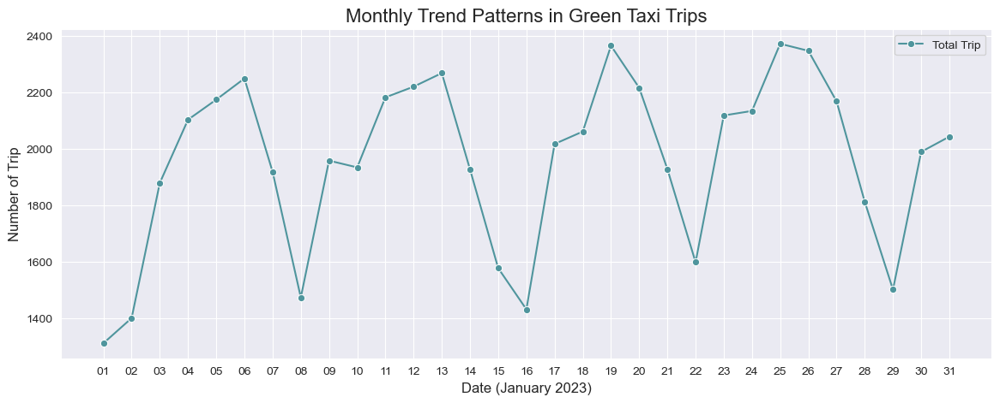

In [100]:
# Visualisasi tren bulanan terkait jumlah perjalanan taksi hijau
plt.figure(figsize=(14, 5))
sns.set_style("darkgrid")

sns.lineplot(
    data=trip_by_date,
    x="pickup_date",
    y="total_trip",
    color="#4F959D",
    marker="o",
    label="Total Trip",
)

plt.title("Monthly Trend Patterns in Green Taxi Trips", fontsize=16)
plt.xlabel("Date (January 2023)", fontsize=12)
plt.ylabel("Number of Trip", fontsize=12)
plt.xticks(trip_by_date["pickup_date"])

plt.show()

**Insight:**
- Secara umum *green taxi* (taksi hijau) memiliki pola perjalanan yang cukup fluktuatif sepanjang januari 2023, dengan kecenderungan naik dan turun secara mingguan.
- Jumlah perjalanan tertinggi tercatat pada 25 januari 2023, sedangkan jumlah perjalanan terendah terjadi pada 1 januari 2023.
- Pola kenaikan yang paling signifikan terjadi pada periode 16-19 januari 2023, sementara penurunan yang paling tajam terlihat pada 25-29 januari 2023.

In [101]:
# Penggabungan fitur pickup day dengan daily amount dan total trip
total_amount = (
    df.groupby("pickup_day")
    .agg(
        daily_amount=("total_amount", "sum"),
        total_trip=("lpep_pickup_datetime", "count"),
    )
    .reset_index()
)

# Buat kategori terurut
days = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
total_amount["pickup_day"] = pd.Categorical(
    total_amount["pickup_day"], categories=days, ordered=True
)

# Urutkan sesuai kategori
daily_total_amount = total_amount.sort_values("pickup_day").reset_index(drop=True)

daily_total_amount

,pickup_day,daily_amount,total_trip
0,Monday,196299.19,8896
1,Tuesday,224329.19,10007
2,Wednesday,194711.90,8718
3,Thursday,207962.85,9106
4,Friday,200629.24,8901
5,Saturday,167962.17,7585
6,Sunday,164115.57,7460


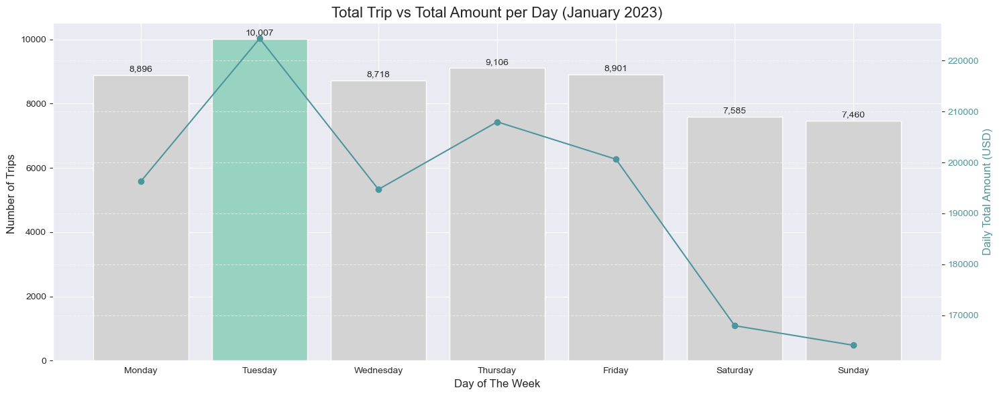

In [102]:
# Visualisasi untuk membandingkan total pendapatan dengan total trip per hari
fig, ax1 = plt.subplots(figsize=(15, 6))
color = [
    "lightgrey" if day != "Tuesday" else "#98D2C0"
    for day in daily_total_amount["pickup_day"]
]

# Bar untuk trip distance
bars = ax1.bar(
    daily_total_amount["pickup_day"],
    daily_total_amount["total_trip"],
    color=color,
    label="Total Trip",
)

ax1.set_ylabel("Number of Trips ", fontsize=12)
ax1.set_xlabel("Day of The Week", fontsize=12)
ax1.tick_params(axis="y")

for p in ax1.patches:
    value = int(p.get_height())
    if value > 0:
        ax1.annotate(
            f"{value:,}",
            (p.get_x() + p.get_width() / 2, p.get_height()),
            ha="center",
            va="bottom",
            xytext=(0, 2),
            textcoords="offset points",
        )
# Garis untuk fare amount
ax2 = ax1.twinx()
ax2.plot(
    daily_total_amount["pickup_day"],
    daily_total_amount["daily_amount"],
    color="#4F959D",
    marker="o",
    label="Total Amount",
)

ax2.set_ylabel("Daily Total Amount (USD)", color="#4F959D", fontsize=12)
ax2.tick_params(axis="y", labelcolor="#4F959D")

plt.title("Total Trip vs Total Amount per Day (January 2023)", fontsize=16)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

**Insight:**
- Hari Selasa merupakan hari dengan jumlah perjalanan tertinggi, yaitu 10.009 trip, dan juga mencatatkan pendapatan harian (total amount) tertinggi.
- Secara umum, aktivitas perjalanan taksi lebih tinggi pada hari kerja (Senin–Jumat) dibanding akhir pekan (Sabtu dan Minggu).
- Pendapatan harian dan jumlah trip menurun sangat tajam pada akhir pekan, terutama hari Minggu yang menjadi hari dengan pendapatan dan jumlah trip terendah.
  Dapat disimpulkan bahwa terdapat korelasi positif antara jumlah perjalanan dengan total pendapatan, artinya semakin banyak perjalanan yang dilakukan, semakin tinggi pula total pendapatan yang dihasilkan pada hari tersebut.

In [103]:
# penggabungan fitur untuk melihat proporsi trip per hari
trip_by_time = (
    df.groupby(["pickup_time"])["lpep_pickup_datetime"]
    .count()
    .reset_index()
    .rename(columns={"lpep_pickup_datetime": "trip"})
)

trip_by_time["total_trip"] = trip_by_time["trip"].sum()

trip_by_time["percentage"] = (trip_by_time["trip"] / trip_by_time["total_trip"]) * 100

# proprsi trip per tipe hari
day_type = (
    df.groupby(["day_type"])["lpep_pickup_datetime"]
    .count()
    .reset_index()
    .rename(columns={"lpep_pickup_datetime": "trip"})
)

day_type["total_trip"] = day_type["trip"].sum()

day_type["percentage"] = (day_type["trip"] / day_type["total_trip"]) * 100

display(trip_by_time, day_type)

,pickup_time,trip,total_trip,percentage
0,Morning,15766,57181,27.572096
1,Afternoon,19979,57181,34.939928
2,Evening,13332,57181,23.315437
3,Night,8104,57181,14.172540


,day_type,trip,total_trip,percentage
0,Weekdays,45628,60673,75.203138
1,Weekend,15045,60673,24.796862


In [148]:
trip_by_time.to_csv('trip per hari (pie).csv')

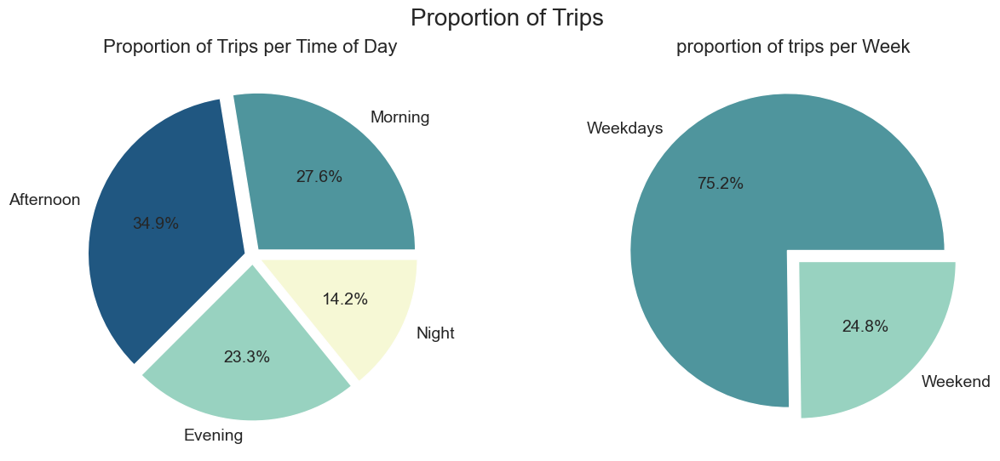

In [104]:
plt.figure(figsize=(15, 6))
plt.suptitle("Proportion of Trips", fontsize=20)
green_gradient = ["#4F959D", "#205781", "#98D2C0", "#F6F8D5"]

# Visualisasi proporsi trip per waktu dalam sehari
plt.subplot(1, 2, 1)
plt.pie(
    data=trip_by_time,
    x="percentage",
    labels="pickup_time",
    colors=green_gradient,
    autopct="%1.1f%%",
    textprops={"fontsize": 14},
    explode=(0.05, 0.05, 0.05, 0.05),
)
plt.title("Proportion of Trips per Time of Day ", fontsize=16)

# Visualisasi proporsi trip per minggu
plt.subplot(1, 2, 2)
plt.pie(
    data=day_type,
    x="percentage",
    labels="day_type",
    colors=["#4F959D", "#98D2C0"],
    autopct="%1.1f%%",
    textprops={"fontsize": 14},
    explode=(0.05, 0.05),
)
plt.title("proportion of trips per Week", fontsize=16)

plt.show()

**Insight:**
- Sekitar 75% perjalanan terjadi pada hari kerja (Senin-Jumat), hal ini sejalan dengan grafik sebelumnya yang menunjukkan penurunan jumlah perjalanan pada akhir pekan (Sabtu-Minggu).
- Berdasarkan pola harian, mayoritas perjalanan dilakukan pada rentang waktu siang hingga sore hari, hal ini mencerminkan tingginya mobilitas masyarakat pada jam aktif kerja dan aktivitas harian.

In [105]:
# Mengurutkan hari
day_order = [
    "Sunday",
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
]

# Buat pivot table jumlah trip per hari per jam
pivot = pd.crosstab(
    index=df["lpep_pickup_datetime"].dt.day_name(),
    columns=df["lpep_pickup_datetime"].dt.hour,
).reindex(day_order)

pivot.index.name = "Day of Week"
pivot.columns.name = None

pivot

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
Day of Week,,,,,,,,,,,,,,,,,,,,,
Sunday,281,264,221,181,137,74,58,96,123,217,...,503,562,539,507,518,442,379,293,193,158
Monday,110,67,48,64,52,51,134,375,418,482,...,580,696,703,704,724,552,378,305,218,151
Tuesday,85,50,44,34,21,51,186,531,647,644,...,650,721,783,774,795,628,456,323,242,158
Wednesday,84,66,27,24,17,43,165,406,510,518,...,535,650,689,747,731,601,408,279,211,152
Thursday,88,61,41,25,31,51,163,424,505,545,...,590,658,698,760,794,543,445,309,240,165
Friday,135,81,38,36,28,42,140,429,461,469,...,594,695,688,710,718,568,421,321,289,251
Saturday,210,176,122,102,84,45,46,107,196,252,...,454,581,567,508,533,475,419,324,315,301


In [149]:
pivot.to_csv('pivot EDA.csv')

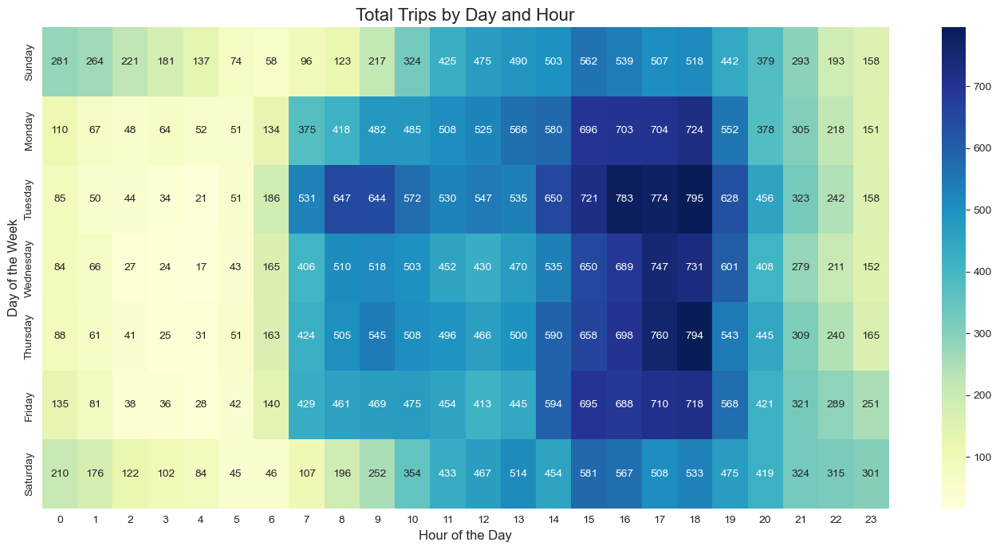

In [106]:
# Visualisasi peak hour per hari
plt.figure(figsize=(14, 7))

sns.heatmap(pivot, cmap="YlGnBu", annot=True, fmt=".0f")

plt.title("Total Trips by Day and Hour", fontsize=16)
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Day of the Week", fontsize=12)
plt.tight_layout()
plt.show()

**Insights:**

- Jam sibuk (*peak hour*) pagi: terlihat pada pukul 07:00 hingga 09:00 pagi (senin-jumat). Mencapai puncak tertinggi pada hari selasa dengan total perjalanan sebanyak 647 perjalanan pada jam 8 pagi.

- Jam sibuk (*peak hour*) sore: terjadi pada pukul 15:00 hingga 18:00 (senin-jumat) dengan jumlah perjalanan mencapai 650 hingga 795 selama bulan Januari. Mencapai puncak tertinggi pada hari selasa dengan total perjalanan sebanyak 795 perjalanan pada jam 6 sore.

- Jam-jam yang paling sepi terjadi pada pukul 00:00 hingga 05:00 pagi (senin-jumat). Sedangkan pada akhir pekan (sabtu-minggu), jam-jam tersebut memiliki jumlah perjalanan yang lebih tinggi.

## 2.7 Data Analysis

## Variabilitas permintaan layanan taksi berdasarkan waktu, hari, dan wilayah.

Pada tahap ini, akan dilakukan analisis lanjutan terkait pola permintaan layanan taksi berdasarkan waktu, hari, dan wilayah borough. Tujuan dari analisis ini adalah untuk mengidentifikasi tren penggunaan layanan guna mendukung efisiensi operasional taksi secara keseluruhan.

In [107]:
# Penggabungan antar fitur untuk melihat total trip per borough
agg_borough = (
    df.groupby(["PUBorough", "day_type"])
    .agg(count=("PUBorough", "count"))
    .sort_values(by="count", ascending=False)
    .reset_index()
)

display(agg_borough)

,PUBorough,day_type,count
0,Manhattan,Weekdays,28636
1,Queens,Weekdays,11142
2,Manhattan,Weekend,7669
3,Brooklyn,Weekdays,5227
4,Queens,Weekend,4366
5,Brooklyn,Weekend,2825
6,Bronx,Weekdays,615
7,Bronx,Weekend,185
8,Staten Island,Weekdays,8


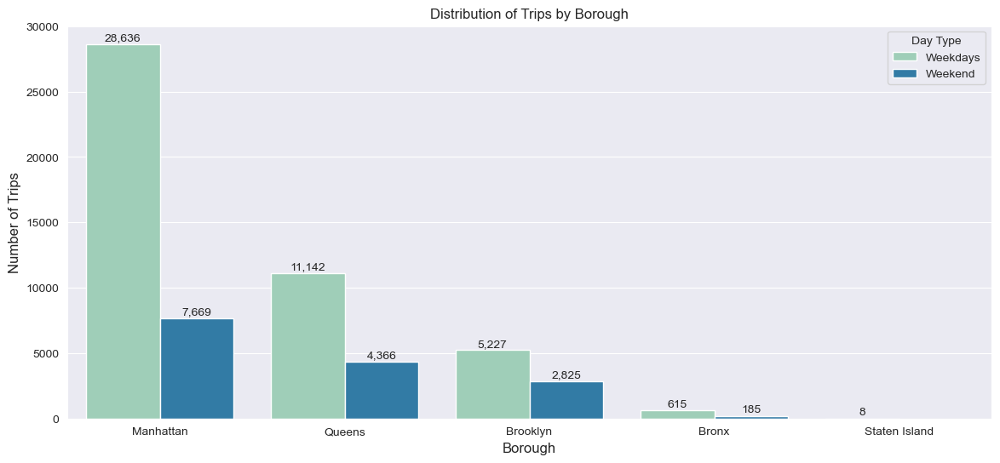

In [108]:
# Visualisasi distribusi perjalanan per borough
plt.figure(figsize=(14, 6))

ax1 = sns.barplot(
    data=agg_borough, y="count", x="PUBorough", hue="day_type", palette="YlGnBu"
)
plt.legend(title="Day Type")
plt.title("Distribution of Trips by Borough", fontsize=12)
plt.xlabel("Borough", fontsize=12)
plt.ylabel("Number of Trips", fontsize=12)

for p in ax1.patches:
    value = int(p.get_height())
    if value > 0:
        ax1.annotate(
            f"{value:,}",
            (p.get_x() + p.get_width() / 2, p.get_height()),
            ha="center",
            va="bottom",
            xytext=(0, 1),
            textcoords="offset points",
        )

plt.show()

**Insight:**
- Distribusi perjalanan taksi berdasarkan borough:
1. **Manhattan** merupakan borough dengan jumlah perjalanan tertinggi baik pada hari kerja (28,637 perjalanan), maupun akhir pekan (7,670 perjalanan).
2. **Queens** merupakan borough dengan jumlah perjalanan tertinggi ke dua, dengan 11,148 perjalanan pada hari kerja dan 4,367 perjalanan pada akhir pekan.
3. **Brooklyn** jumlah perjalanan pada borough ini cukup stabil dengan 5,229 perjalanan pada hari kerja dan 2,826 perjalanan pada akhir pekan.
4. **Bronx & Staten Island** merupakan borough dengan jumlah perjalanan paling rendah dibanding borough lainnya dengan jumlah perjalanan kurang dari 1000 perjalanan. Hal ini menunjukan bahwa kedua borough ini tidak terlalu dominana dalam penggunaan layanan taksi hijau (green cab).

In [109]:
# Jumlah trip per jam, per borough, dan tipe hari
df["pickup_hour"] = df["lpep_pickup_datetime"].dt.hour

# Jumlah trip per jam per borough per tanggal
hourly_trip_counts = (
    df.groupby(["pickup_date", "pickup_hour", "PUBorough", "day_type"])
    .size()
    .reset_index(name="trip_count")
)

# Median trip_count per jam
median_hourly_trips = (
    hourly_trip_counts.groupby(["PUBorough", "pickup_hour", "day_type"])["trip_count"]
    .median()
    .reset_index(name="median_frequency")
    .sort_values(by="median_frequency", ascending=False)
)

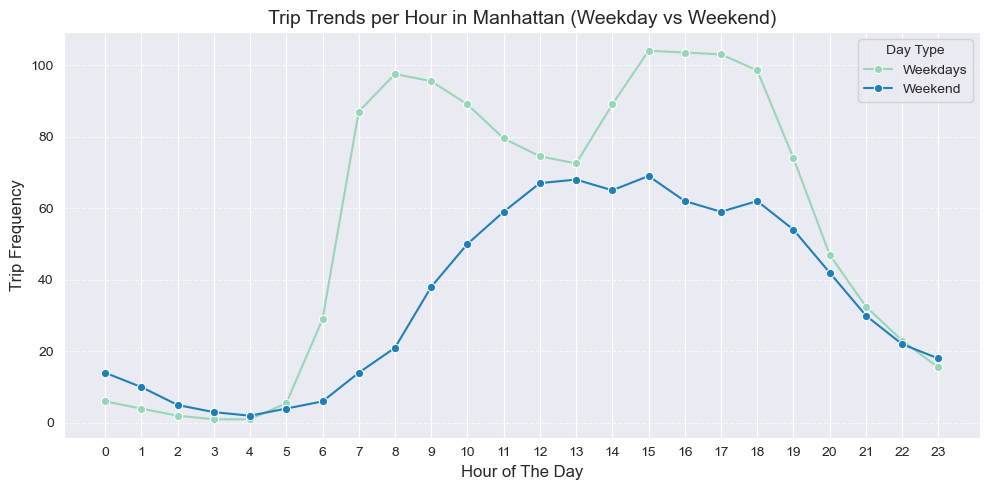

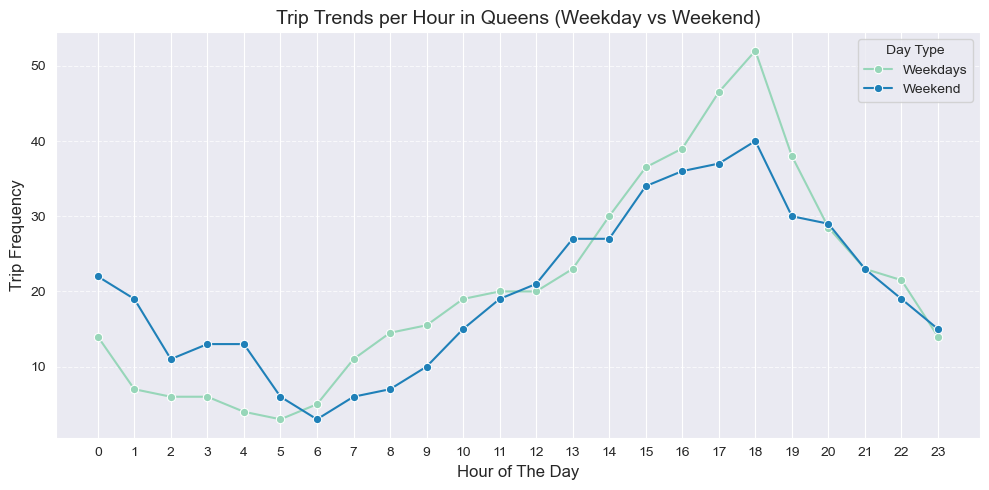

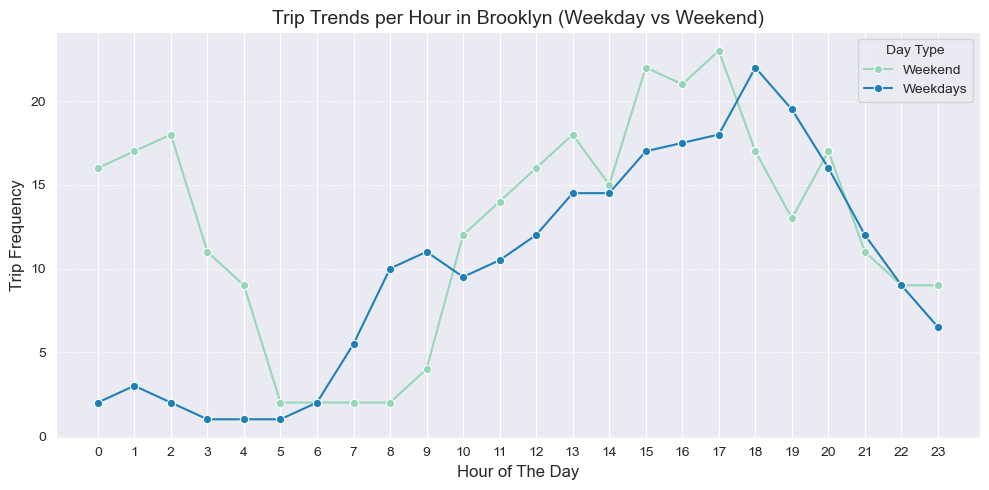

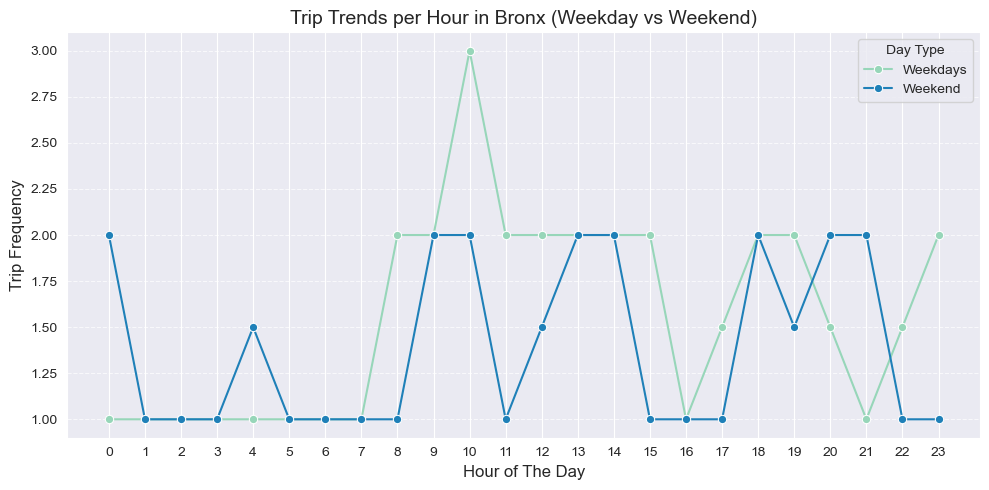

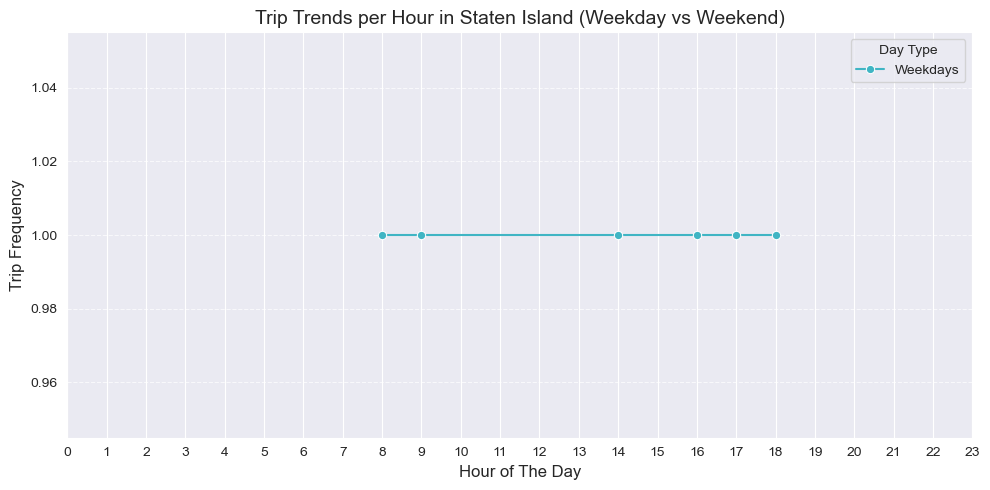

In [110]:
# Visualisasi untuk melihat frekuensi tren trip setiap borough di weekday & weekend
boroughs = median_hourly_trips["PUBorough"].unique()

for borough in boroughs:
    plt.figure(figsize=(10, 5))

    subset = median_hourly_trips[median_hourly_trips["PUBorough"] == borough]

    sns.lineplot(
        data=subset,
        x="pickup_hour",
        y="median_frequency",
        hue="day_type",
        marker="o",
        palette="YlGnBu",
    )

    plt.title(f"Trip Trends per Hour in {borough} (Weekday vs Weekend)", fontsize=14)
    plt.xlabel("Hour of The Day", fontsize=12)
    plt.ylabel("Trip Frequency", fontsize=12)
    plt.xticks(range(0, 24))
    plt.grid(axis="y", linestyle="--", alpha=0.7)
    plt.legend(title="Day Type")
    plt.tight_layout()
    plt.show()

In [111]:
# Mendefinisikan hari berdasarkan urutannya
day_order = [
    "Sunday",
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
]
df["pickup_day"] = pd.Categorical(df["pickup_day"], categories=day_order, ordered=True)

# Menambahkan fitur untuk merlihat jam tertentu
df["pickup_hour"] = df["lpep_pickup_datetime"].dt.hour

# Penggabungan antar fitur untuk melihat peak hour setiap borough
rush_hour_byBorough = (
    df.groupby(["PUBorough", "pickup_hour", "pickup_day"])
    .size()
    .reset_index(name="trip_count")
    .sort_values(by="trip_count", ascending=False)
)

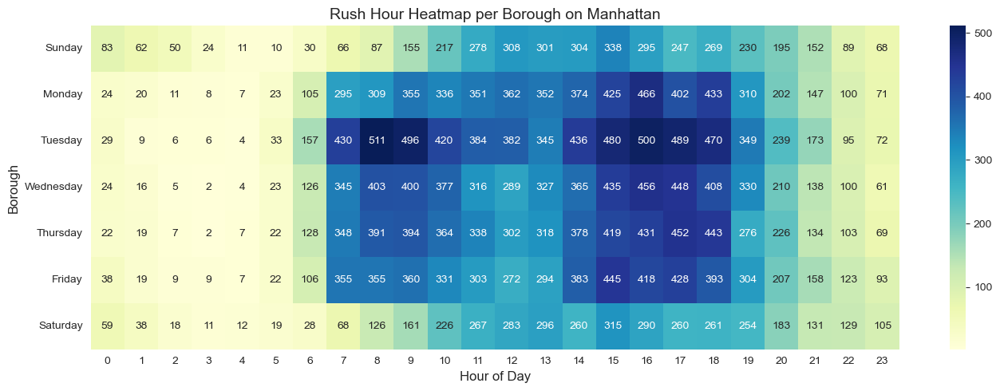

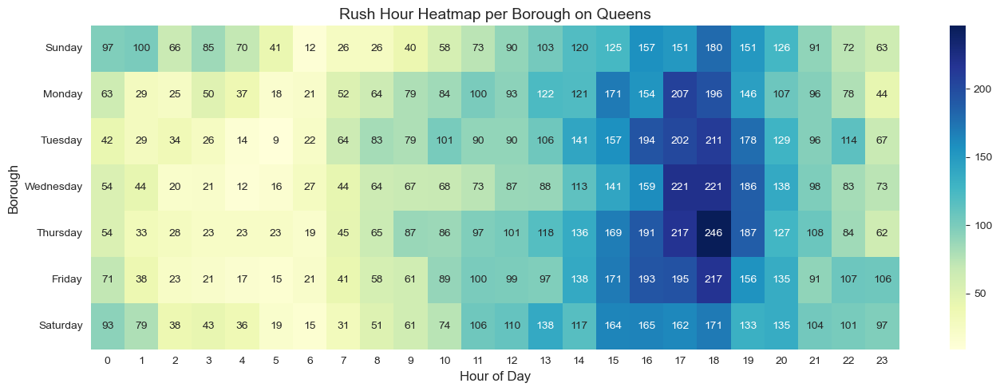

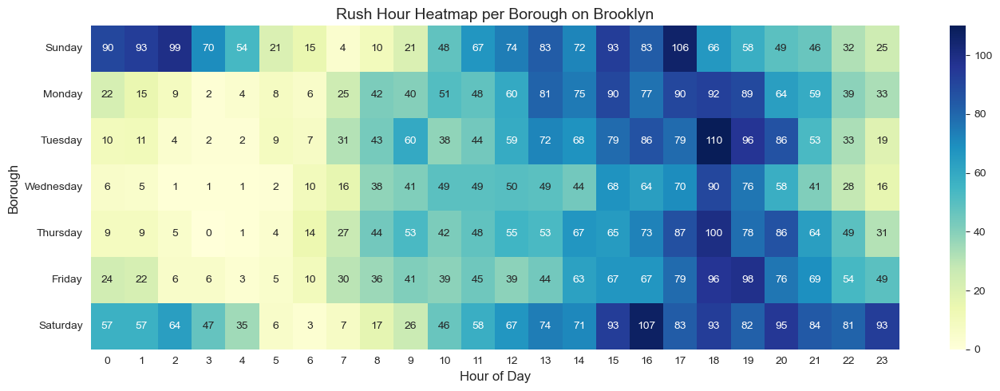

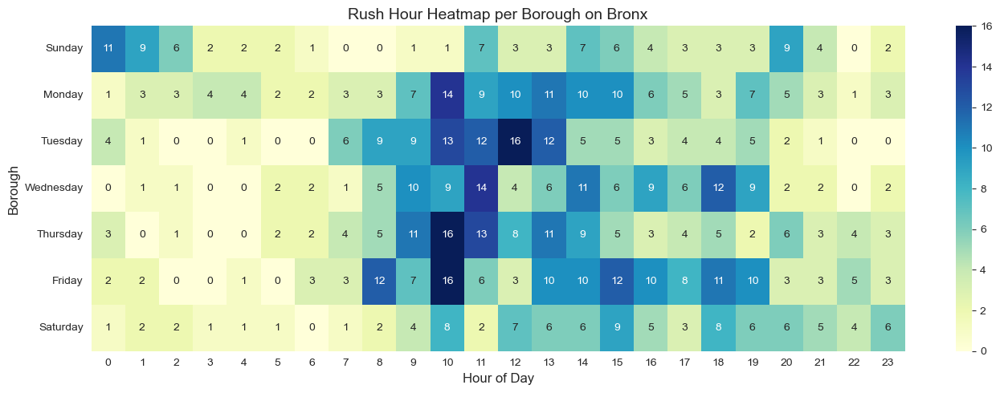

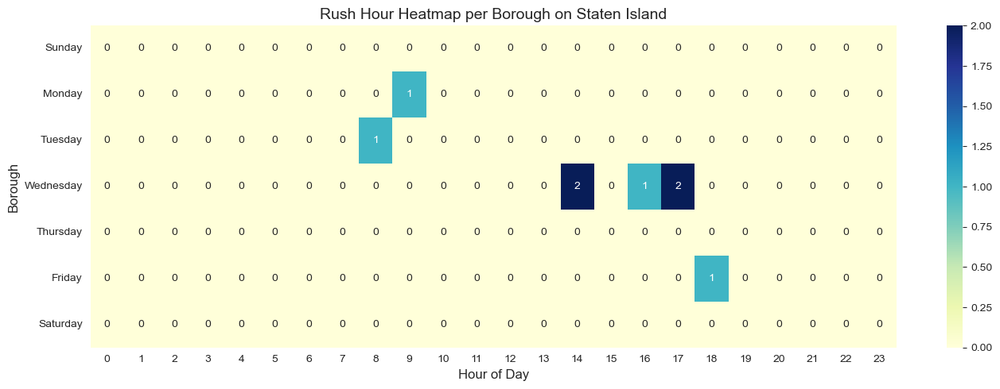

In [140]:
# Visualisasi peak hour setiap borough per hari per jam
boroughs = rush_hour_byBorough["PUBorough"].unique()

for borough in boroughs:
    data = rush_hour_byBorough[rush_hour_byBorough["PUBorough"] == borough]
    pivot = data.pivot_table(
        index="pickup_day", columns="pickup_hour", values="trip_count"
    ).fillna(0)

    plt.figure(figsize=(14, 5))
    sns.heatmap(pivot, annot=True, fmt=".0f", cmap="YlGnBu")
    plt.title(f"Rush Hour Heatmap per Borough on {borough}", fontsize=14)
    plt.xlabel("Hour of Day", fontsize=12)
    plt.ylabel("Borough", fontsize=12)
    plt.tight_layout()
    plt.show()

**Insight:**

Berdasarkan visualisasi heatmap "Rush Hour per Borough" dan "Trend of Trips per Borough" tersebut, terlihat bahwa permintaan taxi tertinggi terjadi pada tiga borough, yaitu:
1. **Manhattan** 
- Merupakan pusat ekonomi dan aktivitas utama di Amerika Serikat. Manhattan dikenal sebagai pusat komersial, keuangan, dan budaya kota, dengan banyak landmark, tempat wisata, museum, dan universitas.
- Permintaan taksi tertinggi terjadi di borough ini
- Waktu sibuk pada **Weekday** antara 08:00-18:00 dan pada **Weekend** antara 11:00-19:00, hal ini menunjukkan bahwa Manhattan cenderung memiliki waktu sibuk yang lebih panjang pada hari kerja.
- Puncak aktivitas terjadi pada pukul 16.00–18.00
- Interpretasi: Armada tambahan paling dibutuhkan di rentang waktu 07:00–18:00.

2. **Queens**
- Waktu sibuk pada **Weekday** antara 17:00-19:00 dan pada **Weekend** antara 15:00-20:00, yang menunjukkan sedikit pergeseran waktu sibuk ke sore hari pada akhir pekan.
- Frekuensi perjalanan di Queens cukup tinggi, terutama pada pukul 15.00–18.00. Hal ini menunjukkan adanya arus pulang kerja dari Manhattan ke Queens.
- Interpretasi: Perlu tambahan armada di siang hingga sore hari, terutama saat jam pulang kerja.

3. **Brooklyn**
- Brooklyn menunjukkan distribusi perjalanan yang cukup stabil pada **Weekday** dan **Weekend**, yaitu antara 15:00-21:00, yang menunjukkan pola waktu sibuk yang lebih terpusat pada sore hingga malam hari.
- Jumlah perjalanan memuncak pada pukul 17.00–18.00
- Interpretasi: Ada permintaan yang stabil sepanjang hari, khususnya tinggi di sore hari.

4. **Bronx:**
- Jumlah trip sangat rendah dibanding borough lain.
- Aktivitas meningkat sedikit antara 07:00 – 12:00, tapi tetap di bawah 100 trip/jam.
- Interpretasi: Armada mungkin tidak perlu banyak, atau ada potensi pengembangan layanan.

5. **Staten Island:**
- Aktivitas hampir nol sepanjang hari.
- Hanya ada sedikit trip secara sporadis (maksimal 2/jam).
- Interpretasi: Tidak termasuk wilayah prioritas untuk penambahan armada.

**Kesimpulan Strategis:**
Fokus utama penambahan armada adalah:
- Manhattan (08:00 – 18:00) 
- Queens (12:00 – 18:00)
- Brooklyn (14:00 – 17:00)

In [114]:
# Import modul untuk visualisasi map
import cufflinks as cf

cf.go_offline()
import folium
import geopandas as gpd

# Load GeoJSON
nyc_geojson = gpd.read_file("NYC Taxi Zones.geojson")

# Total pickup dan dropoff
pickup = df["PUBorough"].value_counts().reset_index()
pickup.columns = ["borough", "pickup_count"]

dropoff = df["DOBorough"].value_counts().reset_index()
dropoff.columns = ["borough", "dropoff_count"]

nyc_geojson = nyc_geojson.rename(columns={"borough": "borough"})
nyc_geojson = nyc_geojson.merge(pickup, on="borough", how="left")
nyc_geojson = nyc_geojson.merge(dropoff, on="borough", how="left")

nyc_geojson[["pickup_count", "dropoff_count"]] = nyc_geojson[
    ["pickup_count", "dropoff_count"]
].fillna(0)

In [115]:
import branca.colormap as cm

# Total aktivitas (pickup + dropoff)
nyc_geojson["total_activity"] = (
    nyc_geojson["pickup_count"] + nyc_geojson["dropoff_count"]
)

# Atur warna berdasarkan nilai terkecil sampai terbesar
min_val = nyc_geojson["total_activity"].min()
max_val = nyc_geojson["total_activity"].max()
colormap = cm.linear.YlGnBu_09.scale(min_val, max_val)

nyc_geojson["color"] = nyc_geojson["total_activity"].apply(colormap)

green_cab_maps = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

# Visualisasi maps
folium.GeoJson(
    nyc_geojson,
    style_function=lambda x: {
        "fillColor": x["properties"]["color"],
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.7,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["borough", "pickup_count", "dropoff_count", "total_activity"],
        aliases=["Borough:", "Pickup:", "Dropoff:", "Total:"],
    ),
).add_to(green_cab_maps)

# legenda
colormap.caption = "Total Pickup + Dropoff per Borough"
colormap.add_to(green_cab_maps)

green_cab_maps

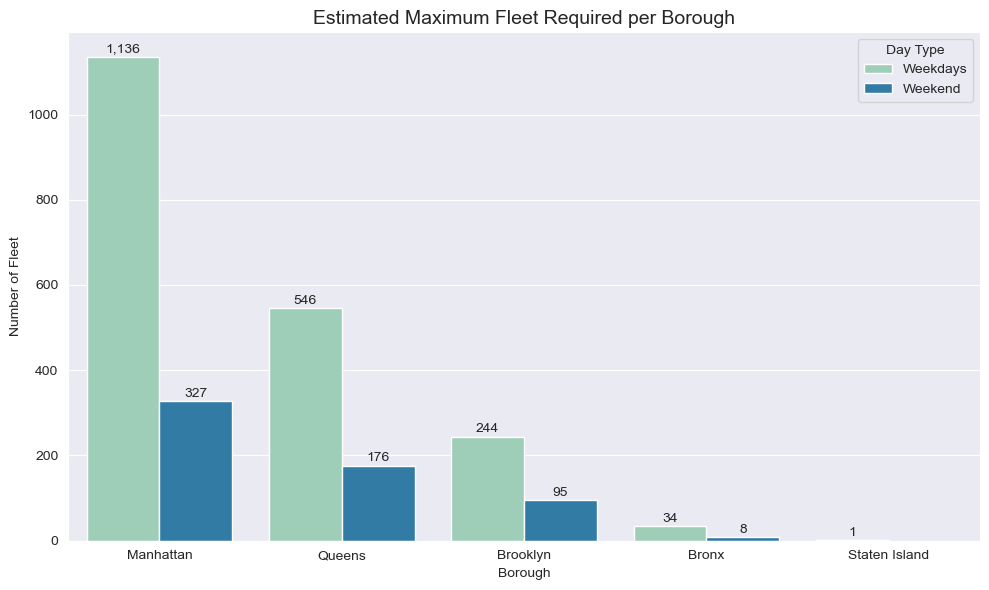

In [116]:
# Hitung rata-rata trip per borough per jam
avg_trip_per_hour = (
    df.groupby(["PUBorough", "pickup_hour", "day_type"])
    .size()
    .reset_index(name="trip_count")
)
avg_trip_per_hour = (
    avg_trip_per_hour.groupby(["PUBorough", "pickup_hour", "day_type"])["trip_count"]
    .mean()
    .reset_index()
)
avg_trip_per_hour.rename(columns={"trip_count": "avg_trip"}, inplace=True)

# Estimasi jumlah armada yang dibutuhkan (1 armada : 2 trip)
avg_trip_per_hour["estimated_fleet"] = (avg_trip_per_hour["avg_trip"] / 2).apply(
    np.ceil
)

fleet_summary = (
    avg_trip_per_hour.groupby(["PUBorough", "day_type"])["estimated_fleet"]
    .max()
    .reset_index()
)
fleet_summary = fleet_summary.sort_values(by="estimated_fleet", ascending=False)

plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=fleet_summary,
    x="PUBorough",
    y="estimated_fleet",
    hue="day_type",
    palette="YlGnBu",
)

plt.legend(title="Day Type")
plt.title("Estimated Maximum Fleet Required per Borough", fontsize=14)
plt.xlabel("Borough")
plt.ylabel("Number of Fleet")

# Anotasi jumlah armada
for p in ax.patches:
    value = int(p.get_height())
    if value > 0:
        ax.annotate(
            f"{value:,}",
            (p.get_x() + p.get_width() / 2, p.get_height()),
            ha="center",
            va="bottom",
            xytext=(0, 1),
            textcoords="offset points",
        )
plt.tight_layout()
plt.show()

In [142]:
fleet_summary.to_csv('fleet summary.csv')

**Insight:**
1. **Manhattan**
- menunjukkan lonjakan aktivitas sangat signifikan di hari kerja.
- Manhattan adalah pusat aktivitas kerja (bisnis dan komersial), sehingga perlu prioritas alokasi armada terutama di weekday.

2. **Queens**
- Permintaan cukup tinggi, menunjukkan peran Queens sebagai area hunian dengan mobilitas tinggi menuju pusat kota pada hari kerja.

3. **Brooklyn**
- Aktivitas stabil, tapi tetap ada kebutuhan armada cukup besar, terutama saat weekday.

4. **Bronx**
- Permintaan jauh lebih kecil dibanding borough lain. Dapat jadi prioritas rendah untuk alokasi armada.

5. **Staten Island**
- Jumlah perjalanan taksi hijau pada borough ini sangat minim.

**Perbandingan Weekdays vs Weekend (Rata-rata Seluruh Borough)**
- Weekdays selalu membutuhkan >2–3x armada dibanding weekend.
- Implikasi operasional: Alokasi armada harus sangat fleksibel dan adaptif dengan hari kerja, terutama untuk Manhattan dan Queens.

## Mengidentifikasi Pola Pendapatan Berdasarkan Wilayah dan waktu

Pada tahap ini, akan dilakukan analisis lanjutan terkait pola pendapatan layanan taksi berdasarkan waktu, hari, dan wilayah borough. Tujuan dari analisis ini adalah untuk mengidentifikasi kombinasi waktu dan lokasi dengan potensi pendapatan tertinggi secara konsisten.

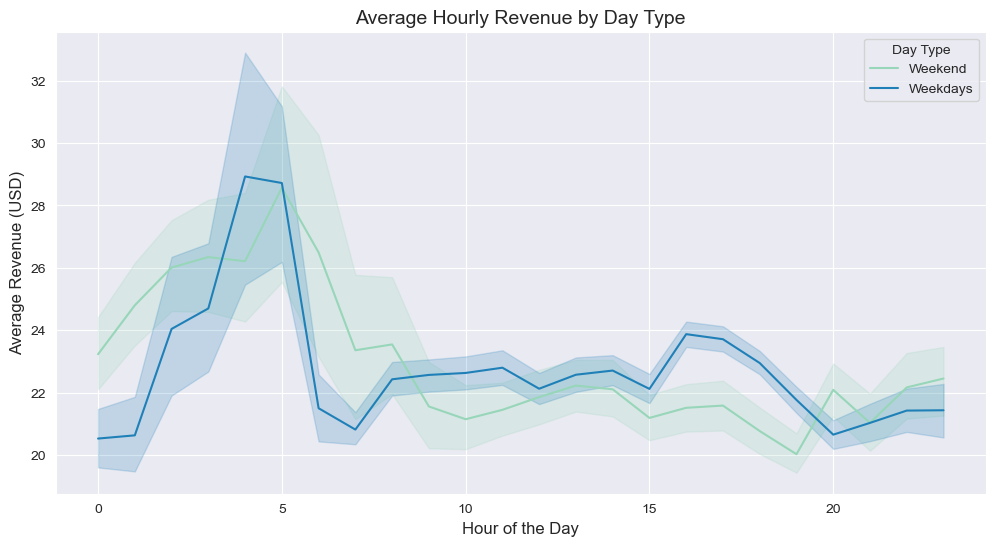

In [117]:
# Lineplot Revenue per Jam berdasarkan Weekday vs Weekend
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=df,
    x="pickup_hour",
    y="total_amount",
    hue="day_type",
    estimator="mean",
    palette="YlGnBu",
)
plt.title("Average Hourly Revenue by Day Type", fontsize=14)
plt.xlabel("Hour of the Day", fontsize=12)
plt.ylabel("Average Revenue (USD)", fontsize=12)
plt.legend(title="Day Type")
plt.grid(True)
plt.show()

**Insight:**
1. Puncak Pendapatan Terjadi di Jam 5–6 Pagi
- Weekdays: Pendapatan tertinggi (~33 USD) muncul sekitar jam 5 pagi.
- Weekend: Puncak sedikit lebih rendah (~31–32 USD) juga terjadi sekitar jam 5–6 pagi.

2. Setelah Jam 6 Pagi Pendapatan Menurun Drastis
- Penurunan terjadi tajam dari jam 6 ke 7 (turun >5 USD). Setelahnya, pendapatan stabil di kisaran 21–24 USD.

3. Sore dan Malam Hari Pendapatan Cenderung Datar
- Dari jam 10 pagi – 20 malam, rata-rata pendapatan stabil (weekdays sedikit lebih tinggi).

**Kesimpulan:**
- Jam 5–6 pagi adalah “golden hour” untuk semua hari, terutama weekdays.
- Pendapatan terendah umumnya terjadi di jam 19–20 malam (~20–21 USD).

In [118]:
# Rata-rata pendapatan per trip per borough per hari
avg_income_per_trip = (
    df.groupby(["PUBorough", "day_type"])["total_amount"]
    .mean()
    .reset_index()
    .rename(columns={"total_amount": "avg_income"})
)

avg_income_per_trip = avg_income_per_trip.sort_values(by="avg_income", ascending=False)
avg_income_per_trip

,PUBorough,day_type,avg_income
2,Brooklyn,Weekdays,27.057289
3,Brooklyn,Weekend,26.220241
0,Bronx,Weekdays,24.913870
8,Staten Island,Weekdays,24.695000
1,Bronx,Weekend,24.623622
7,Queens,Weekend,22.056940
6,Queens,Weekdays,21.984672
4,Manhattan,Weekdays,21.721997
5,Manhattan,Weekend,20.491536


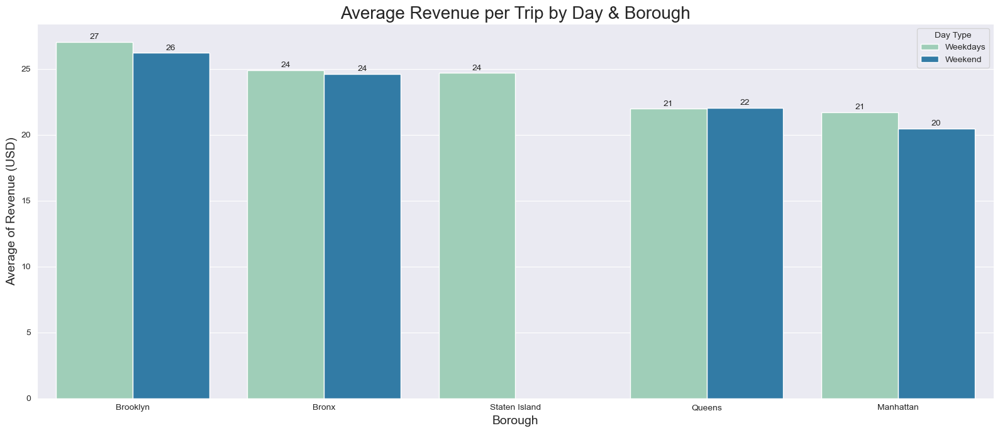

In [119]:
# Visualisasi rata-rata pendapatan per trip per borough per hari
plt.figure(figsize=(16, 7))

ax = sns.barplot(
    data=avg_income_per_trip,
    x="PUBorough",
    y="avg_income",
    hue="day_type",
    palette="YlGnBu",
)

plt.legend(title="Day Type")
plt.title("Average Revenue per Trip by Day & Borough", fontsize=20)
plt.xlabel("Borough", fontsize=14)
plt.ylabel("Average of Revenue (USD)", fontsize=14)

# Anotasi
for p in ax.patches:
    value = int(p.get_height())
    if value > 0:
        ax.annotate(
            f"{value:,}",
            (p.get_x() + p.get_width() / 2, p.get_height()),
            ha="center",
            va="bottom",
            xytext=(0, 1),
            textcoords="offset points",
        )
plt.tight_layout()
plt.show()

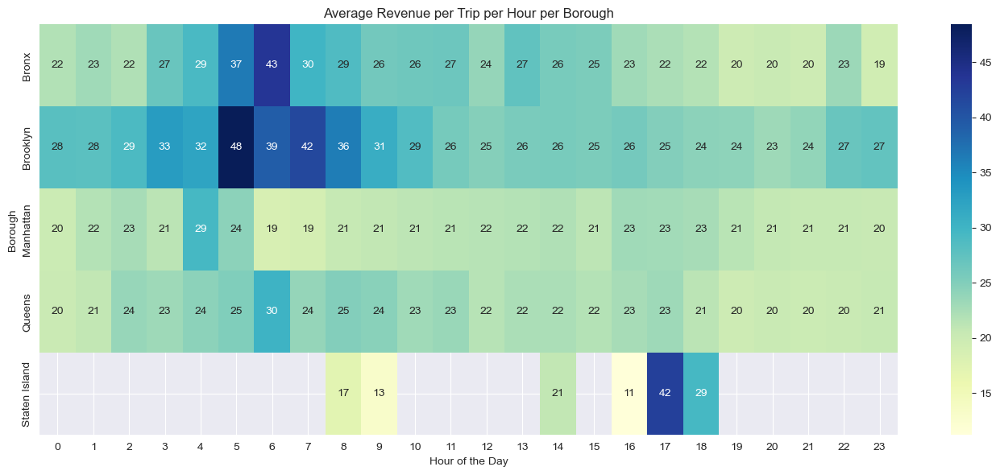

In [120]:
# Rata-rata pendapatan per trip per jam per borough
df["revenue_per_trip"] = df["total_amount"]
revenue_hourly = (
    df.groupby(["PUBorough", "pickup_hour"])["revenue_per_trip"].mean().reset_index()
)
revenue_hourly.sort_values("revenue_per_trip", ascending=False)

# Heatmap rata-rata pendapatan per borough per jam
pivot_revenue = revenue_hourly.pivot(
    index="PUBorough", columns="pickup_hour", values="revenue_per_trip"
)

plt.figure(figsize=(14, 6))
sns.heatmap(pivot_revenue, annot=True, fmt=".0f", cmap="YlGnBu")
plt.title("Average Revenue per Trip per Hour per Borough")
plt.xlabel("Hour of the Day")
plt.ylabel("Borough")
plt.tight_layout()
plt.show()

**Insight:**
1. **Brooklyn**
- Pendapatan tertinggi (27–26 USD/trip), sangat stabil.
- Cocok untuk memaksimalkan revenue meskipun jumlah armada menengah.

2. **Bronx**
- Pendapatan cukup tinggi (25–24 USD), meskipun permintaan armada sangat rendah.

3. **Staten Island**
- Pendapatan rata-rata cukup baik (24 USD), tapi jumlah perjalanan sangat rendah.

4. **Queens**
- Pendapatan cukup rendah di weekdays, meningkat di weekend.
- Menarik untuk weekend promo/insentif.

5. Manhattan
- Pendapatan per trip paling rendah meskipun permintaan sangat tinggi.

In [121]:
# Distribusi revenue per borough per zona
revenue_dist = (
    df.groupby(["DOBorough", "DOZone"])
    .agg(
        trip_count=("total_amount", "count"),
        total_revenue=("total_amount", "sum"),
        avg_of_revenue=("total_amount", "mean"),
        median_of_revenue=("total_amount", "median"),
    )
    .sort_values(by="total_revenue", ascending=False)
    .reset_index()
    .round(2)
)

In [122]:
# Visualisasi revenue per borough per borough per zona
import plotly.express as px

plt.figure(figsize=(15, 8))

fig = px.treemap(
    revenue_dist,
    path=[px.Constant("All"), "DOBorough", "DOZone"],
    values="total_revenue",
    color="median_of_revenue",
    color_continuous_scale="Viridis",
    range_color=[5, 40],
    custom_data=["trip_count", "median_of_revenue"],
    title="Revenue Distribution based on Drop off Location",
)
fig.update_traces(
    hovertemplate="<b>%{label}</b><br>Total Revenue: %{value}<br>Trip Count: %{customdata[0]}<br>Median of Revenue: %{customdata[1]:.2f}"
)
fig.update_layout(margin=dict(t=50, l=0, r=0, b=0))
fig.update_traces(marker=dict(cornerradius=2))
fig.show()

<Figure size 1500x800 with 0 Axes>

**Insight:**

- Zona-zona di Manhattan mendominasi kontribusi pendapatan. Terlihat frekuensi dan konektivitas antar zona membuat zona-zona di Manhattan menghasilkan pendapatan yang besar.
- Queens mendominasi dengan median revenue tertinggi. Bandara seperti JFK dan LaGuardia merupakan penghasil median revenue tertinggi, mencapai 32–60 USD.
Namun frekuensi pada rute ini cukup rendah, meskipun tarif per perjalanan sangat tinggi. Hal tersebut menunjukkan rute ini lebih cocok untuk *long-trip* atau *airport drop-off*.

In [123]:
# Total pendapatan kotor per borough
revenue_per_borough = (
    df.groupby("DOBorough")["total_amount"]
    .sum()
    .reset_index()
    .rename(columns={"total_amount": "total_revenue"})
)
lowest_borough = revenue_per_borough.tail(3)

revenue_per_borough["DOBorough"] = np.where(
    revenue_per_borough["DOBorough"].isin(["Manhattan", "Queens", "Brooklyn"]),
    revenue_per_borough["DOBorough"],
    "Other",
)

revenue_per_borough = revenue_per_borough.groupby("DOBorough", as_index=False).sum()
revenue_per_borough = revenue_per_borough.sort_values(
    by="total_revenue", ascending=False
).reset_index()
revenue_per_borough

,index,DOBorough,total_revenue
0,1,Manhattan,786012.16
1,3,Queens,353330.95
2,0,Brooklyn,165066.50
3,2,Other,51600.50


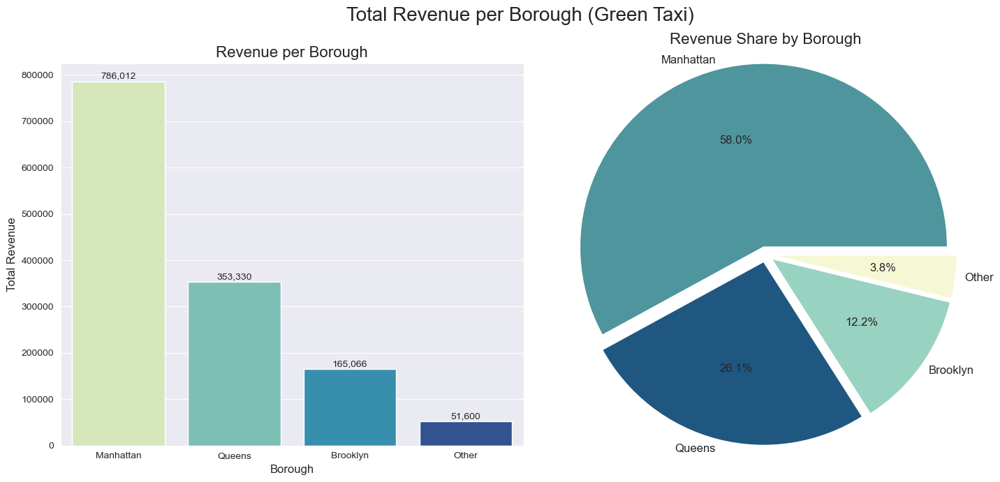

In [124]:
# Visualisasi Total pendapatan kotor per borough
plt.figure(figsize=(15, 7))
plt.suptitle("Total Revenue per Borough (Green Taxi)", fontsize=20)
green_gradient = ["#4F959D", "#205781", "#98D2C0", "#F6F8D5"]

# Visualisasi pendapatan per borough
plt.subplot(1, 2, 2)
plt.pie(
    data=revenue_per_borough,
    x="total_revenue",
    labels="DOBorough",
    colors=green_gradient,
    explode=[0.05, 0.05, 0.05, 0.05],
    radius=1.2,
    labeldistance=1.05,
    autopct="%1.1f%%",
    textprops={"fontsize": 12},
)
plt.title("Revenue Share by Borough", pad=20, fontsize=16)

# Visualisasi proporsi pendapatan per borough
plt.subplot(1, 2, 1)
ax2 = sns.barplot(
    data=revenue_per_borough, x="DOBorough", y="total_revenue", palette="YlGnBu"
)

plt.title("Revenue per Borough", fontsize=16)
plt.xlabel("Borough", fontsize=12)
plt.ylabel("Total Revenue", fontsize=12)

for p in ax2.patches:
    value = int(p.get_height())
    if value > 0:
        ax2.annotate(
            f"{value:,}",
            (p.get_x() + p.get_width() / 2, p.get_height()),
            ha="center",
            va="bottom",
            xytext=(0, 1),
            textcoords="offset points",
        )
plt.tight_layout()
plt.show()

**Insight:**
- Borough Manhattan menjadi kota dengan kontribusi pendapatan terbesar, yaitu sebesar 788,290 USD atau 58% dari Total revenue selama periode januari 2023.

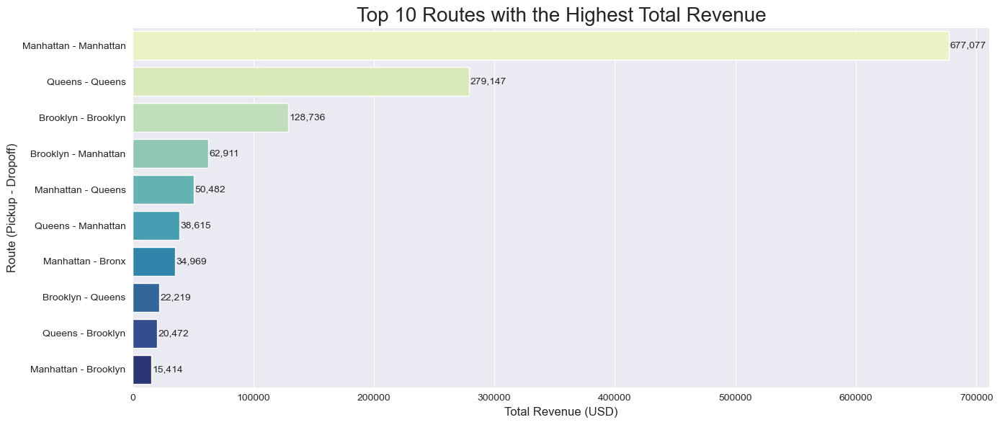

In [125]:
# Rute (borough) dengan Revenue Tertinggi (Pickup - Dropoff)
route_revenue = (
    df.groupby(["PUBorough", "DOBorough"])["total_amount"]
    .sum()
    .reset_index()
    .sort_values(by="total_amount", ascending=False)
)

# Visualisasi Top 10 Rute
top_routes = route_revenue.head(10)
plt.figure(figsize=(14, 6))

ax = sns.barplot(
    data=top_routes,
    x="total_amount",
    y=top_routes["PUBorough"] + " - " + top_routes["DOBorough"],
    palette="YlGnBu",
)

plt.title("Top 10 Routes with the Highest Total Revenue", fontsize=20)
plt.xlabel("Total Revenue (USD)", fontsize=12)
plt.ylabel("Route (Pickup - Dropoff)", fontsize=12)

for p in ax.patches:
    value = int(p.get_width())
    if value > 0:
        ax.annotate(
            f"{value:,}",  # Tambahkan format angka ribuan
            (p.get_width(), p.get_y() + p.get_height() / 2),
            ha="left",
            va="center",
            xytext=(1, 0),
            textcoords="offset points",
        )
plt.tight_layout()
plt.show()

In [126]:
# Rute (zone) dengan Revenue & Tip Tertinggi (Pickup - Dropoff)
total_revenue = (
    df.groupby(["PUZone", "DOZone"])
    .agg(
        trip_count=("PUZone", "count"),
        total_revenue=("total_amount", "sum"),
        total_tip=("tip_amount", "sum"),
        avg_tip=("tip_amount", "mean"),
    )
    .reset_index()
    .sort_values(by=["total_revenue"], ascending=False)
    .head(10)
    .round(2)
)
route = total_revenue["PUZone"] + " - " + total_revenue["DOZone"]
total_revenue.insert(0, "Route", route)

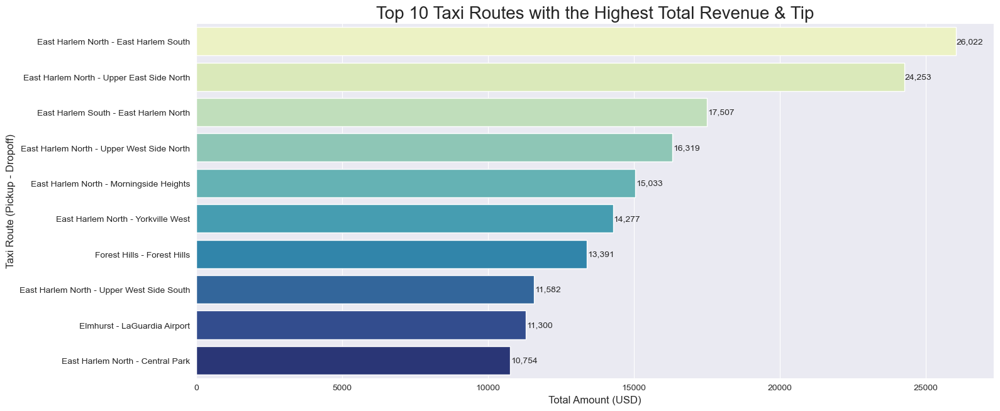

In [127]:
# Visualisasi Top 10 Rute
plt.figure(figsize=(16, 7))

ax = sns.barplot(
    data=total_revenue.head(10), y="Route", x="total_revenue", palette="YlGnBu"
)

plt.title("Top 10 Taxi Routes with the Highest Total Revenue & Tip", fontsize=20)
plt.xlabel("Total Amount (USD)", fontsize=12)
plt.ylabel("Taxi Route (Pickup - Dropoff)", fontsize=12)

for p in ax.patches:
    value = int(p.get_width())
    if value > 0:
        ax.annotate(
            f"{value:,}",  # Tambahkan format angka ribuan jika perlu
            (p.get_width(), p.get_y() + p.get_height() / 2),
            ha="left",
            va="center",
            xytext=(1, 0),
            textcoords="offset points",
        )
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

**Insight:**
- Manhattan adalah pusat aktivitas transportasi yang dominan, baik dari sisi pendapatan driver maupun perusahaan. Hal itu yang menjadikan Manhattan adalah kontributor utama.
- Banyak rute yang melibatkan Manhattan baik sebagai asal maupun tujuan.
- Rute lintas borough yang melibatkan Manhattan juga signifikan, hal ini menunjukkan Manhattan sebagai hub utama, tidak hanya untuk perjalanan internal tapi juga antar borough.

- Berikut adalah rute-rute yang memiliki rata-rata fare amount tertinggi berdasarkan volume perjalanan tertinggi:

1. East Harlem North & South menjadi rute yang paling menghasilkan secara total amount, mencapai 26.381 USD.
2.  East Harlem South & North sebesar 17.594 USD.   
3. Upper East Side North rute ini menghasilkan 24.432 USD, merupakan rute tertinggi setelah East Harlem North & South .
4. Forest Hills merupakan rute yang memiliki jumlah perjalanan dan juga dalam total amount (rute Forest Hills – Forest Hills, 13.400 USD) cukup tinggi. Ini menunjukkan tingkat penggunaan tinggi sekaligus nilai total cukup besar, yang bisa disebabkan oleh durasi perjalanan atau frequent short trips.
5. Rute Intra-Zone juga menghasilkan *revenue* yang cukup tinggi, seperti terlihat pada Forest Hills – Forest Hills. Ini menandakan mobilitas lokal yang tinggi dan penting untuk area-area yang cukup luas atau padat penduduk.

In [128]:
# Melihat perbandingan sekaligus korelasi tip dengan durasi trip,
tip_by_duration = df[df["tip_amount"] > 0][["tip_amount", "duration_bins", "day_type"]]
dist_tip_byDuration = (
    tip_by_duration.groupby(["duration_bins", "day_type"])
    .agg(count=("tip_amount", "count"), avg_tip=("tip_amount", "mean"))
    .round(2)
    .reset_index()
)

# Melihat perbandingan sekaligus korelasi tip dengan kecepatan taksi
tip_by_speed = df[df["tip_amount"] > 0][["tip_amount", "speed_bins", "day_type"]]
dist_tip_bySpeed = (
    tip_by_speed.groupby(["speed_bins", "day_type"])
    .agg(count=("tip_amount", "count"), avg_tip=("tip_amount", "mean"))
    .round(2)
    .reset_index()
)

display(dist_tip_byDuration)
display(dist_tip_bySpeed)

,duration_bins,day_type,count,avg_tip
0,<10 minutes,Weekdays,10362,2.40
1,<10 minutes,Weekend,3557,2.42
2,11-20 minutes,Weekdays,12026,3.67
3,11-20 minutes,Weekend,4172,3.83
4,21-30 minutes,Weekdays,3798,5.47
5,21-30 minutes,Weekend,1071,5.88
6,>30 minutes,Weekdays,1590,8.01
7,>30 minutes,Weekend,413,9.15


,speed_bins,day_type,count,avg_tip
0,<10 mph,Weekdays,12072,3.23
1,<10 mph,Weekend,2457,3.01
2,11-20 mph,Weekdays,13665,3.70
3,11-20 mph,Weekend,5742,3.63
4,21-30 mph,Weekdays,1798,6.04
5,21-30 mph,Weekend,829,5.85
6,>30 mph,Weekdays,241,8.59
7,>30 mph,Weekend,185,8.51


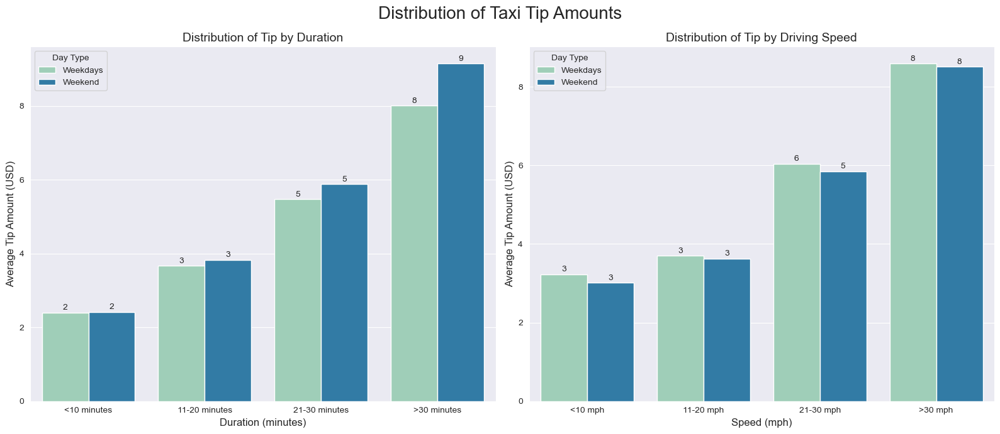

In [129]:
# Visualisasi distribusi durasi perjalanan terhadap tip
plt.figure(figsize=(16, 7))
plt.suptitle("Distribution of Taxi Tip Amounts", fontsize=20)

plt.subplot(1, 2, 1)
ax1 = sns.barplot(
    data=dist_tip_byDuration,
    x="duration_bins",
    y="avg_tip",
    hue="day_type",
    palette="YlGnBu",
)
plt.legend(title="Day Type")
plt.title("Distribution of Tip by Duration", fontsize=14)
plt.xlabel("Duration (minutes)", fontsize=12)
plt.ylabel("Average Tip Amount (USD)", fontsize=12)

for p in ax1.patches:
    value = int(p.get_height())
    if value > 0:
        ax1.annotate(
            f"{value:,}",
            (p.get_x() + p.get_width() / 2, p.get_height()),
            ha="center",
            va="bottom",
            xytext=(0, 1),
            textcoords="offset points",
        )

# Visualisasi distribusi kecepatan taksi terhadap tip
plt.subplot(1, 2, 2)
ax2 = sns.barplot(
    data=dist_tip_bySpeed, x="speed_bins", y="avg_tip", hue="day_type", palette="YlGnBu"
)
plt.legend(title="Day Type")
plt.title("Distribution of Tip by Driving Speed", fontsize=14)
plt.xlabel("Speed (mph)", fontsize=12)
plt.ylabel("Average Tip Amount (USD)", fontsize=12)

for p in ax2.patches:
    value = int(p.get_height())
    if value > 0:
        ax2.annotate(
            f"{value:,}",
            (p.get_x() + p.get_width() / 2, p.get_height()),
            ha="center",
            va="bottom",
            xytext=(0, 1),
            textcoords="offset points",
        )
plt.tight_layout()
plt.show()

**Insight:**
- Distribusi tip berdasarkan durasi perjalanan
  
    Semakin lama durasi perjalanan, umumnya jumlah tip yang diberikan juga meningkat. Dan akhir pekan cenderung menghasilkan jumlah tip lebih tinggi dibandingkan hari kerja, terutama pada perjalanan berdurasi panjang.
- Distribusi tip berdasarkan kecepatan
  
    Terlihat bahwa kecepatan juga dapat mempengaruhi nominal tip yang diberikan, kecepatan lebih dari 30 mph memiliki jumlah tip paling tinggi. Secara umum jumlah tip yang dihasilkan pada hari kerja lebih tinggi dibanding akhir pekan.

**Catatan:** 
- Hal ini diharapkan dapat digunakan sebagai acuan dasar untuk meningkatkan pendapatan bersih pengemudi taksi hijau di kota New York.

**Sumber:** https://www.nyc.gov/site/tlc/about/driver-income.page
- Berdasarkan dokumen tersebut dapat diketahui bahwa pendapatan bersih pengemudi dan perusahaan memiliki proporsi (pembagian laba bersih) sebagai berikut:
 - Pendapatan bersih = Total pendapatan (kotor) per trip - biaya operasional (15%) 
 - Pendapatan pengemudi = 70% dari pendapatan per trip + tip
 - Laba perusahaan = 30% dari pendapatan per trip
 
 => Oleh karena itu hal ini dapat dijadikan sebagai acuan untuk menghitung laba bersih perusahaan ataupun pendapatan bersih pengemudi.

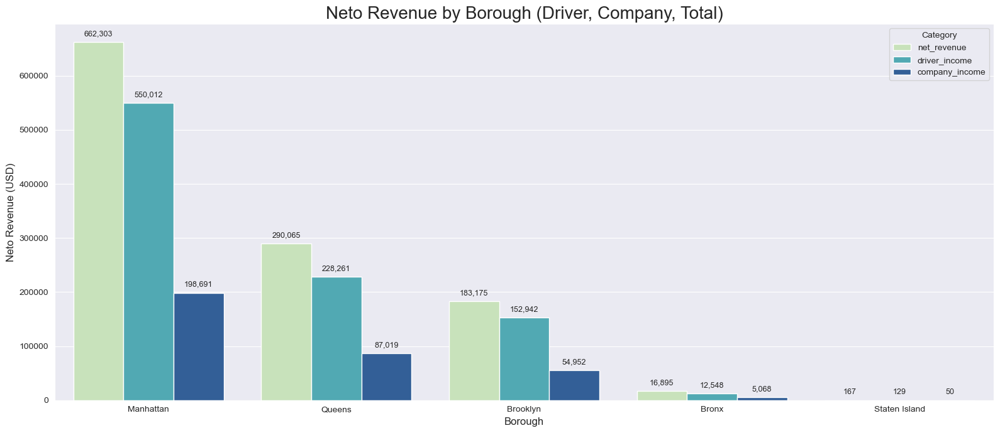

In [130]:
# Estimasi Pendapatan Bersih Pengemudi dan Perusahaan
biaya_operasional_pct = 0.15  # 15% biaya operasional
pembagian_pengemudi = 0.7  # 70% untuk pengemudi
pembagian_perusahaan = 0.3  # 30% untuk perusahaan

df["operational_cost"] = df["total_amount"] * biaya_operasional_pct
df["net_revenue"] = df["total_amount"] - df["operational_cost"]
df["driver_income"] = (df["net_revenue"] * pembagian_pengemudi) + df["tip_amount"]
df["company_income"] = df["net_revenue"] * pembagian_perusahaan

# Rata-rata pendapatan per borough
income_summary = (
    df.groupby("PUBorough")[["driver_income", "company_income", "net_revenue"]]
    .sum()
    .sort_values(by="net_revenue", ascending=False)
    .reset_index()
)

# Ubah jadi long format untuk barplot multi-hue
income_melted = income_summary.melt(
    id_vars="PUBorough",
    value_vars=[ "net_revenue", "driver_income", "company_income"],
    var_name="Category",
    value_name="Revenue",
)
plt.figure(figsize=(16, 7))
ax = sns.barplot(
    data=income_melted, x="PUBorough", y="Revenue", hue="Category", palette="YlGnBu"
)

# Anotasi angka
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(
            f"{int(height):,}",
            (p.get_x() + p.get_width() / 2, height),
            ha="center",
            va="bottom",
            fontsize=9,
            xytext=(0, 5),
            textcoords="offset points",
        )

plt.title("Neto Revenue by Borough (Driver, Company, Total)", fontsize=20)
plt.xlabel("Borough", fontsize=12)
plt.ylabel("Neto Revenue (USD)", fontsize=12)
plt.tight_layout()
plt.show()

**Insight:**
1. Manhattan Mendominasi Pendapatan
- Manhattan adalah pasar paling potensial. Jumlah trip di wilayah tersebut adalah yang terbanyak dari wilayah lain di NYC.

2. Queens & Brooklyn Mengikuti di Posisi Tengah
- Masih berkontribusi signifikan terhadap pendapatan. Kombinasi antara populasi dan aktivitas warga di wilayah tersebut jadi faktor pendorong tingginya kontribusi pendapatan.

3. Bronx & Staten Island – Margin Sangat Rendah
- Area ini memiliki volume trip rendah, tidak terlalu profitable dibanding borough lainnya.

**Distribusi Pendapatan: Driver vs Perusahaan**
- Di semua borough, driver income lebih tinggi dari company income.
Rasio pendapatan driver vs company cukup konsisten: sekitar 70-80% untuk driver, 20-30% untuk perusahaan.

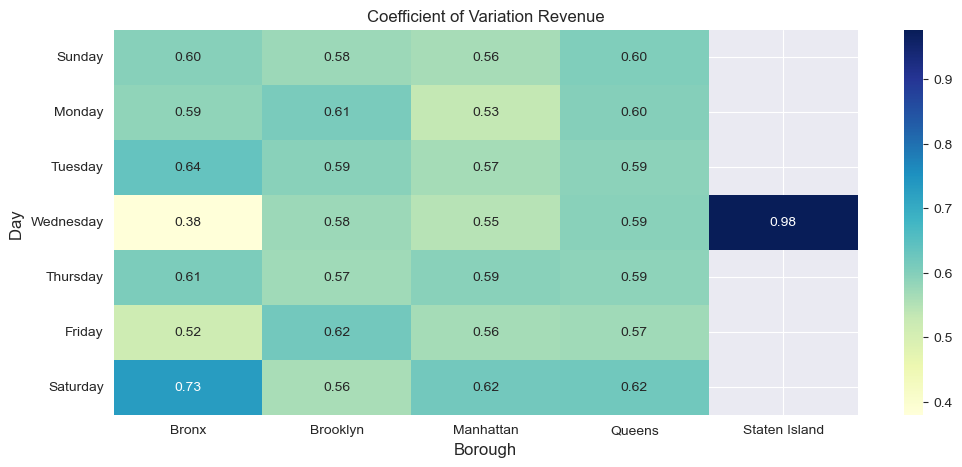

In [131]:
# Konsistensi Pendapatan (Variasi Standar)
revenue_variation = (
    df.groupby(["PUBorough", "pickup_day"])["total_amount"]
    .agg(["mean", "std"])
    .reset_index()
)
revenue_variation["cv"] = revenue_variation["std"] / revenue_variation["mean"]

# Kombinasi Wilayah dan Waktu Tertinggi
top_combination = (
    df.groupby(["PUBorough", "pickup_day"])["total_amount"]
    .mean()
    .reset_index()
    .sort_values(by="total_amount", ascending=False)
)

# Heatmap Konsistensi Revenue
pivot_cv = revenue_variation.pivot(index="pickup_day", columns="PUBorough", values="cv")
plt.figure(figsize=(12, 5))
sns.heatmap(pivot_cv, cmap="YlGnBu", annot=True, fmt=".2f")
plt.title("Coefficient of Variation Revenue")
plt.xlabel("Borough", fontsize=12)
plt.ylabel("Day ", fontsize=12)
plt.show()

In [132]:
# --- Temukan Kombinasi Paling dan Paling Tidak Konsisten ---
most_consistent = revenue_variation.loc[revenue_variation["cv"].idxmin()]
least_consistent = revenue_variation.loc[revenue_variation["cv"].idxmax()]

print("📉 Paling Konsisten:")
print(
    f"{most_consistent['PUBorough']} - {most_consistent['pickup_day']} | CV = {most_consistent['cv']:.2f}"
)

print("\n📈 Paling Tidak Konsisten:")
print(
    f"{least_consistent['PUBorough']} - {least_consistent['pickup_day']} | CV = {least_consistent['cv']:.2f}"
)

📉 Paling Konsisten:
Bronx - Wednesday | CV = 0.38

📈 Paling Tidak Konsisten:
Staten Island - Wednesday | CV = 0.98


In [133]:
# Cek distribusi jumlah trip per kombinasi
trip_count = (
    df.groupby(["PUBorough", "pickup_day"]).size().reset_index(name="trip_count")
)
low_volume = trip_count[trip_count["trip_count"] < 30]
print("\n⚠️ Wilayah dengan jumlah trip rendah:")
low_volume


⚠️ Wilayah dengan jumlah trip rendah:


,PUBorough,pickup_day,trip_count
28,Staten Island,Sunday,0
29,Staten Island,Monday,1
30,Staten Island,Tuesday,1
31,Staten Island,Wednesday,5
32,Staten Island,Thursday,0
33,Staten Island,Friday,1
34,Staten Island,Saturday,0


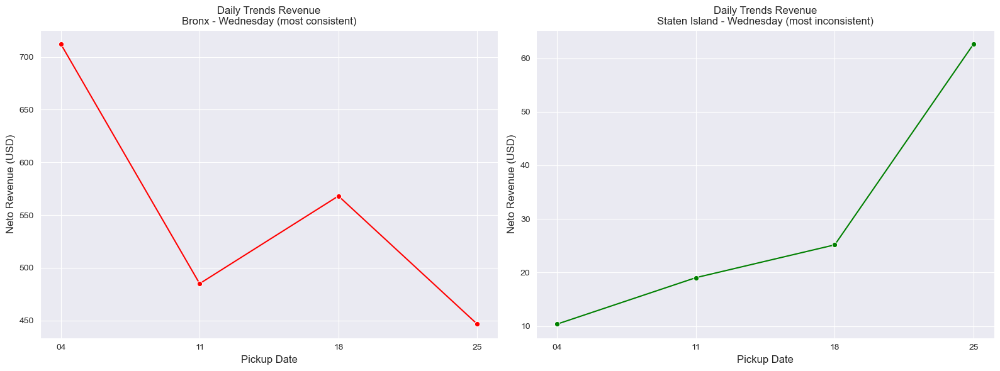

In [134]:
# Konsisten
df_consistent = df[
    (df["PUBorough"] == most_consistent["PUBorough"])
    & (df["pickup_day"] == most_consistent["pickup_day"])
]

# Tidak konsisten
df_inconsistent = df[
    (df["PUBorough"] == least_consistent["PUBorough"])
    & (df["pickup_day"] == least_consistent["pickup_day"])
]

# Agregasi Harian
trend_consistent = (
    df_consistent.groupby("pickup_date")["net_revenue"].sum().reset_index()
)
trend_inconsistent = (
    df_inconsistent.groupby("pickup_date")["net_revenue"].sum().reset_index()
)

# Plot Trend Harian
plt.figure(figsize=(16, 6))

# Konsisten
plt.subplot(1, 2, 1)
sns.lineplot(
    data=trend_consistent, x="pickup_date", y="net_revenue", marker="o", color="red"
)
plt.title(
    f"Daily Trends Revenue\n{most_consistent['PUBorough']} - {most_consistent['pickup_day']} (most consistent)"
)
plt.xlabel("Pickup Date", fontsize=12)
plt.ylabel("Neto Revenue (USD)", fontsize=12)

# Tidak Konsisten
plt.subplot(1, 2, 2)
sns.lineplot(
    data=trend_inconsistent,
    x="pickup_date",
    y="net_revenue",
    marker="o",
    color="green",
)
plt.title(
    f"Daily Trends Revenue\n{least_consistent['PUBorough']} - {least_consistent['pickup_day']} (most inconsistent)"
)
plt.xlabel("Pickup Date", fontsize=12)
plt.ylabel("Neto Revenue (USD)", fontsize=12)

plt.tight_layout()
plt.show()

**Insight:**

1. Bronx
   - Fluktuasi revenue kecil meskipun ada naik turun.
   - Rata-rata pendapatan per hari masih berada di rentang stabil (~500–850).
   - Ini menunjukkan bahwa jumlah perjalanan dan nilai transaksi di Bronx pada hari Rabu cenderung stabil setiap minggunya.

2. Staten Island
   - Revenue sangat rendah dan tidak stabil:
   - Naik dari sekitar 13 ke 73 dalam waktu 3 minggu.
   - Selisih besar dengan total revenue masih di bawah 100, menunjukkan aktivitas yang sangat rendah.
   - indikasi permintaan sangat fluktuatif atau rendah
   - Hal ini diharapkan mampu dijadikan sebagai bahan acuan untuk melakukan efesiensi bisnis di wilayah ini.

**Apakah terdapat perbedaan signifikan pada distribusi pendapatan antar borough yang konsisten dengan yang tidak konsisten?**

**Hipotesis:**

- H₀ (null): Tidak ada perbedaan signifikan pada distribusi pendapatan antar borough (konsisten).

- H₁ (alternatif): Ada perbedaan signifikan (tidak konsisten).

- Jika p > 0.05:

Distribusi pendapatan antar borough relatif konsisten.

Validasi insight: wilayah dengan total revenue tinggi cenderung juga memiliki distribusi pendapatan stabil.

Cocok untuk alokasi armada jangka panjang.

- Jika p < 0.05:

Ada ketidakkonsistenan dalam distribusi pendapatan.


In [135]:
from scipy.stats import kruskal

# Mengelompokkan revenue berdasarkan borough
grouped_revenue = [
    group["total_amount"].values for name, group in df.groupby("PUBorough")
]

# Uji Kruskal-Wallis
stat, p = kruskal(*grouped_revenue)

print(f"Statistic: {stat:.4f}")
print(f"P-value: {p:.4f}")

# Interpretasi
if p < 0.05:
    print("Terdapat perbedaan signifikan antar borough (tidak konsisten).")
else:
    print("Tidak terdapat perbedaan signifikan (relatif konsisten).")

Statistic: 1048.0295
P-value: 0.0000
Terdapat perbedaan signifikan antar borough (tidak konsisten).


**Insight:** 
- Hal ini dapat dijadikan sebagai bukti yang kuat untuk mengatakan bahwa terdapat perbedaan yang signifikan antar borough.

# BAB 3: PENUTUP

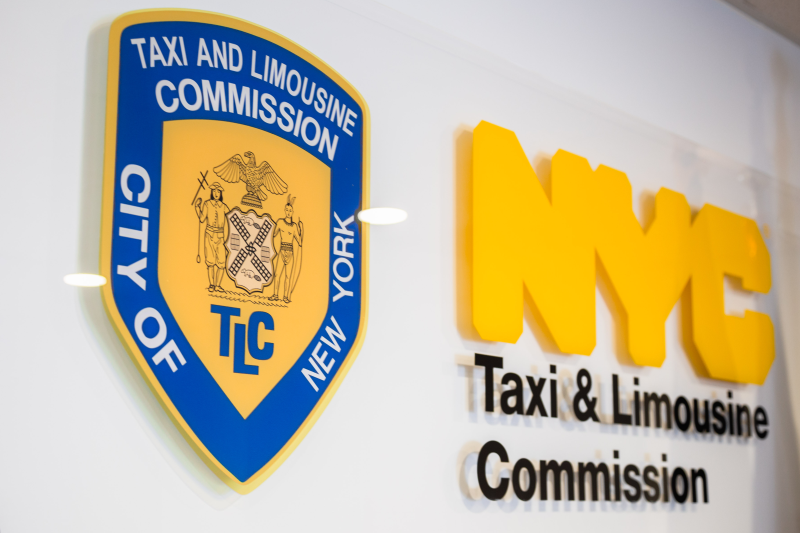

## 3.1 Kesimpulan

**Pola Permintaan & Valuasi Bisnis Green Taxi**
1. Manhattan – Pusat Permintaan dan Pendapatan
- Permintaan tertinggi (terutama weekday 08:00–18:00), tapi pendapatan per trip rendah karena banyak perjalanan pendek.
- Total revenue tertinggi (58%) karena frekuensi trip yang sangat besar.
- Prioritas utama alokasi armada, terutama saat weekday dan “golden hour” jam 05:00–06:00.

2. Queens – Fokus pada Weekend dan Airport Trips
- Permintaan tinggi sore hari (15:00–19:00), terutama weekday.
- Pendapatan per trip rendah di weekday, tapi naik signifikan di weekend.
- Rute ke bandara (JFK, LaGuardia) punya fare tinggi (~35–40 USD), meski jarang—cocok untuk strategi long-trip atau promosi.

3. Brooklyn – Stabilitas Permintaan & Pendapatan
- Permintaan stabil sepanjang hari, terutama 15:00–21:00.
- Pendapatan per trip cukup tinggi dan stabil (26–27 USD).
- Cocok untuk alokasi armada menengah dengan optimasi profit.

4. Bronx – Potensi Terbatas, Pendapatan Layak
- Permintaan rendah, tapi pendapatan per trip cukup tinggi (~25 USD).
- Bukan prioritas, tapi bisa jadi wilayah eksperimen untuk peningkatan layanan.

5. Staten Island – Aktivitas & Revenue Sangat Rendah
- Permintaan dan pendapatan sangat rendah dan fluktuatif.
- Tidak direkomendasikan untuk ekspansi atau penambahan armada.

## 3.2 Rekomendasi Bisnis

1. **Fokus Distribusi Armada di Wilayah Potensial**
- Manhattan: Armada terbanyak saat weekday 08:00–18:00 → volume trip tinggi.
- Queens & Brooklyn: Armada menengah sore–malam (15:00–21:00) → stabil & menguntungkan.

2. **Maksimalkan “Golden Hour” (05:00–06:00)**
- Pendapatan per trip tertinggi.
- Dorong shift pagi dengan insentif untuk driver.

3. **Promosi Spesifik Wilayah & Waktu**
- Terapkan Insentif & Promosi Berbasis Zona dan Waktu
- Queens (Weekend): Tawarkan bonus atau diskon bagi pengemudi dan penumpang untuk meningkatkan traffic.
- Bandara (JFK/LaGuardia): Sediakan armada khusus untuk long-trip premium (airport drop-off/pick-up).
- Zona-zona lokal padat seperti Forest Hills – maksimalkan mobilitas lokal lewat tarif tetap atau bundling.

4. **Efisiensi Operasional di Wilayah Kurang Potensial**
- Fokus: Bronx & Staten Island
- Kurangi armada aktif atau hanya operasikan pada jam tertentu.

5. **Tingkatkan Pendapatan Driver Lewat Strategi Tip**
- Dorong perjalanan berdurasi lebih panjang atau kecepatan stabil (>30 mph), yang terbukti meningkatkan tip.

In [136]:
df.columns

Index(['VendorID', 'lpep_pickup_datetime', 'lpep_dropoff_datetime',
       'store_and_fwd_flag', 'RatecodeID', 'PULocationID', 'DOLocationID',
       'passenger_count', 'trip_distance', 'fare_amount', 'extra', 'mta_tax',
       'tip_amount', 'tolls_amount', 'improvement_surcharge', 'total_amount',
       'payment_type', 'trip_type', 'congestion_surcharge', 'PUBorough',
       'PUZone', 'PUService_zone', 'DOBorough', 'DOZone', 'DOService_zone',
       'pickup_time', 'pickup_day', 'day_type', 'distance_bins',
       'trip_duration', 'duration_bins', 'driving_speed', 'speed_bins',
       'fare_amount_bins', 'tip_percent', 'tip_category', 'pickup_date',
       'pickup_hour', 'revenue_per_trip', 'operational_cost', 'net_revenue',
       'driver_income', 'company_income'],
      dtype='object')

In [137]:
df_cleaned = df[
    [
        "lpep_pickup_datetime",
        "lpep_dropoff_datetime",
        "day_type",
        "pickup_day",
        "pickup_time",
        "pickup_hour",
        "RatecodeID",
        "PULocationID",
        "PUBorough",
        "PUZone",
        "DOLocationID",
        "DOBorough",
        "DOZone",
        "passenger_count",
        "trip_distance",
        "distance_bins",
        "fare_amount",
        "fare_amount_bins",
        "tip_amount",
        "tip_category",
        "total_amount",
        "payment_type",
        "revenue_per_trip",
        "operational_cost",
        "net_revenue",
        "driver_income",
        "company_income",
        "trip_type",
        "trip_duration",
        "duration_bins",
        "driving_speed",
        "speed_bins",
    ]
]
df_cleaned

,lpep_pickup_datetime,lpep_dropoff_datetime,day_type,pickup_day,pickup_time,pickup_hour,RatecodeID,PULocationID,PUBorough,PUZone,...,revenue_per_trip,operational_cost,net_revenue,driver_income,company_income,trip_type,trip_duration,duration_bins,driving_speed,speed_bins
0,2023-01-01 00:26:10,2023-01-01 00:37:11,Weekend,Sunday,NaN,0,Standard rate,166,Manhattan,Morningside Heights,...,24.18,3.6270,20.5530,18.41710,6.16590,Street-hail,11.02,11-20 minutes,14.05,11-20 mph
1,2023-01-01 00:51:03,2023-01-01 00:57:49,Weekend,Sunday,NaN,0,Standard rate,24,Manhattan,Bloomingdale,...,15.84,2.3760,13.4640,12.06480,4.03920,Street-hail,6.77,<10 minutes,16.04,11-20 mph
3,2023-01-01 00:13:14,2023-01-01 00:19:03,Weekend,Sunday,NaN,0,Standard rate,41,Manhattan,Central Harlem,...,10.20,1.5300,8.6700,7.76900,2.60100,Street-hail,5.82,<10 minutes,13.40,11-20 mph
4,2023-01-01 00:33:04,2023-01-01 00:39:02,Weekend,Sunday,NaN,0,Standard rate,41,Manhattan,Central Harlem,...,8.00,1.2000,6.8000,4.76000,2.04000,Street-hail,5.97,<10 minutes,11.06,11-20 mph
5,2023-01-01 00:53:31,2023-01-01 01:11:04,Weekend,Sunday,NaN,0,Standard rate,41,Manhattan,Central Harlem,...,22.95,3.4425,19.5075,13.65525,5.85225,Street-hail,17.55,11-20 minutes,9.50,<10 mph
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68204,2023-01-31 21:53:00,2023-01-31 22:05:00,Weekdays,Tuesday,Night,21,Standard rate,42,Manhattan,Central Harlem North,...,20.16,3.0240,17.1360,15.30520,5.14080,Street-hail,12.00,11-20 minutes,11.30,11-20 mph
68205,2023-01-31 21:56:00,2023-01-31 22:14:00,Weekdays,Tuesday,Night,21,Standard rate,75,Manhattan,East Harlem South,...,24.20,3.6300,20.5700,15.64900,6.17100,Street-hail,18.00,11-20 minutes,13.07,11-20 mph
68206,2023-01-31 22:29:00,2023-01-31 22:42:00,Weekdays,Tuesday,Night,22,Standard rate,49,Brooklyn,Clinton Hill,...,17.93,2.6895,15.2405,10.66835,4.57215,Street-hail,13.00,11-20 minutes,10.66,11-20 mph
68207,2023-01-31 22:40:00,2023-01-31 22:48:00,Weekdays,Tuesday,Night,22,Standard rate,10,Queens,Baisley Park,...,6.64,0.9960,5.6440,3.95080,1.69320,Street-hail,8.00,<10 minutes,16.05,11-20 mph


In [138]:
df_cleaned.to_csv("NYC TLC Trip Record - Clean.csv", index=False)